# Running Differential Transcription Analysis for UPM 2.5

In [25]:
library(data.table)
library(stringr)
# plotting
library(ggplot2)
library(cowplot)
# DE analysis
#library(limma)
library(edgeR)
library(DESeq2)
library(UpSetR)
library(gridExtra)
library(clusterProfiler)
library(org.Hs.eg.db)

In [26]:
# save the results and TFEA input
results_dir="/Users/hopekirby/Desktop/TF_Enh_Linking/Resp_Env/Comb_UPM_WSP_ADP/results/"
tfea_input_dir="/Users/hopekirby/Desktop/TF_Enh_Linking/Resp_Env/Comb_UPM_WSP_ADP/data/TFEA_input/"

## 1. Get counts

In [27]:
# read in preliminary 5ptrunc counts
# the 
count_dir="/Users/hopekirby/Desktop/TF_Enh_Linking/Resp_Env/Comb_UPM_WSP_ADP/data/counts/"
genes_file=paste0(count_dir, "fixed_genes_CUWA_UPM_3.26.25_counts.txt")
gene_counts <- fread(genes_file)
gene_counts[1:2,]

# get easier names
colnames(gene_counts) <- c("Geneid", "Chr", "Start", "End", "Strand", "Length", 
                           "UPM120_1", "UPM120_2", "UPM30_1", "UPM30_2", "Veh_1", "Veh_2")
# get the gene name (not just isoform)
gene_counts$Gene <- str_split_fixed(gene_counts$Geneid, ":", 2)[,1]
nrow(gene_counts)
length(unique(gene_counts$Gene))

# only keep the non-putative Refseq genes
nonput <- fread("/Users/hopekirby/Desktop/TF_Enh_Linking/Final_Project_Repos/Bidir_Counting_Analysis/assets/hg38_refseq_diff53prime_5ptrunc_counting.bed")
nonput$Gene <- str_split_fixed(nonput$V4, ":", 2)[,1]
nrow(nonput)
length(unique(nonput$Gene))
nonput[1:2,]
# look at some of the names that are putative
setdiff(gene_counts$Gene, nonput$Gene)[1:3]
gene_counts <- gene_counts[gene_counts$Gene %in% nonput$Gene,]
nrow(gene_counts)
length(unique(gene_counts$Gene))

Geneid,Chr,Start,End,Strand,Length,./mmfiltbams/sm36-ALI-D21_120UPM-1.mmfilt.sorted.bam,./mmfiltbams/sm36-ALI-D21_120UPM-2.mmfilt.sorted.bam,./mmfiltbams/sm36-ALI-D21_30UPM-1.mmfilt.sorted.bam,./mmfiltbams/sm36-ALI-D21_30UPM-2.mmfilt.sorted.bam,./mmfiltbams/sm36-ALI-D21_veh-1.mmfilt.sorted.bam,./mmfiltbams/sm36-ALI-D21_veh-2.mmfilt.sorted.bam
<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
RCBTB2:NM_001268.4,chr13;chr13;chr13;chr13,48488962;48501874;48507200;48509309,48499874;48505200;48507309;48530979,-;-;-;-,36021,1023,808,1761,1895,587,650
FAM24B-CUZD1:NR_037915.1,chr10;chr10,122832154;122868549,122866549;122878101,-;-,43949,1862,1831,574,1039,1446,1617


[1] 42099

[1] 28775

[1] 42224

[1] 28889

V1,V2,V3,V4,V5,V6,Gene
<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>
chr1,12623,14409,DDX11L1:NR_046018.2,.,+,DDX11L1
chr1,14361,28620,WASH7P:NR_024540.1,.,-,WASH7P


[1] NA NA NA

[1] 42099

[1] 28775

In [28]:
# filter according to counts
# remove genes with counts (< 70 across all AND length > 3000) AND < 40
gene_counts$sum_counts <- rowSums(gene_counts[,c("UPM120_1", "UPM120_2", "UPM30_1", "UPM30_2", "Veh_1", "Veh_2")])
length(unique(gene_counts$Gene))

# Get the most transcribed isoforms of each
kept_isoforms <- c()
# get the length normalized counts 
gene_counts$LNC <- gene_counts$sum_counts/gene_counts$Length
gene_counts[1:2,]
# for each gene
for (gene in unique(gene_counts$Gene)) {
    # get the isoform with the highest Length normalized counts (LNC)
    filt = gene_counts[gene_counts$Gene == gene,]
    filt = filt[order(-filt$LNC),]
    kept_isoforms <- c(kept_isoforms, filt$Geneid[1])
    }
# ensure I'm keeping the right amount
length(kept_isoforms)
length(unique(gene_counts$Gene))

[1] 28775

Geneid,Chr,Start,End,Strand,Length,UPM120_1,UPM120_2,UPM30_1,UPM30_2,Veh_1,Veh_2,Gene,sum_counts,LNC
<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>,<dbl>,<dbl>
RCBTB2:NM_001268.4,chr13;chr13;chr13;chr13,48488962;48501874;48507200;48509309,48499874;48505200;48507309;48530979,-;-;-;-,36021,1023,808,1761,1895,587,650,RCBTB2,6724,0.1866689
FAM24B-CUZD1:NR_037915.1,chr10;chr10,122832154;122868549,122866549;122878101,-;-,43949,1862,1831,574,1039,1446,1617,FAM24B-CUZD1,8369,0.1904253


[1] 28775

[1] 28775

In [29]:
# FILTER COUNTS ACCORDING TO NUMBER OF READS
gene_counts <- gene_counts[gene_counts$Geneid %in% kept_isoforms,]
dim(gene_counts)
gene_counts[1:2,]

length(unique(gene_counts$Gene))
gene_filt_counts <- gene_counts[gene_counts$sum_counts > 49,]
gene_filt_counts <- gene_filt_counts[gene_filt_counts$sum_counts > 79 | gene_filt_counts$Length < 2000,]
length(unique(gene_filt_counts$Gene))

[1] 28775    15

Geneid,Chr,Start,End,Strand,Length,UPM120_1,UPM120_2,UPM30_1,UPM30_2,Veh_1,Veh_2,Gene,sum_counts,LNC
<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>,<dbl>,<dbl>
FAM24B-CUZD1:NR_037915.1,chr10;chr10,122832154;122868549,122866549;122878101,-;-,43949,1862,1831,574,1039,1446,1617,FAM24B-CUZD1,8369,0.190425266
LINC01483:NR_109971.1,chr17;chr17;chr17;chr17;chr17;chr17;chr17,69594736;69610062;69734814;69763066;69810392;69813505;69871904,69606630;69732814;69760192;69808392;69811505;69869904;69903000,+;+;+;+;+;+;+,293965,90,35,237,239,116,88,LINC01483,805,0.002738421


[1] 28775

[1] 20770

[1] 133

[1] 131  15

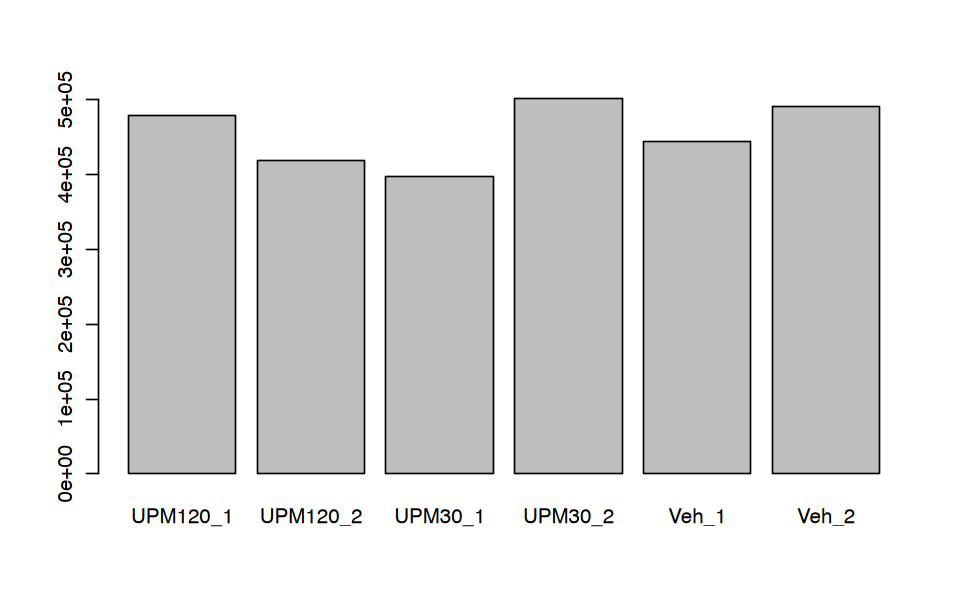

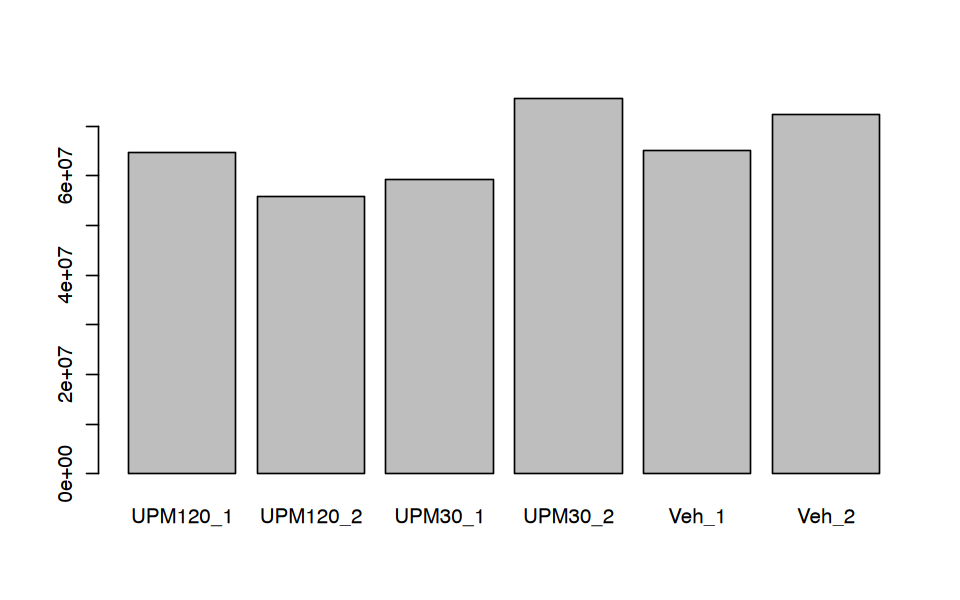

In [30]:
# check that the housekeeping genes are there
options(repr.plot.height=5, repr.plot.width=8)
hk_genes <- c(
  # Ribosomal genes (RPL and RPS families)
  "RPL3", "RPL4", "RPL5", "RPL6", "RPL7", "RPL8", "RPL9", "RPL10", "RPL10A", 
  "RPL11", "RPL12", "RPL13", "RPL13A", "RPL14", "RPL15", "RPL17", "RPL18", 
  "RPL18A", "RPL19", "RPL21", "RPL22", "RPL23", "RPL23A", "RPL24", "RPL26", 
  "RPL27", "RPL27A", "RPL28", "RPL29", "RPL30", "RPL31", "RPL32", "RPL34", 
  "RPL35", "RPL35A", "RPL36", "RPL36A", "RPL37", "RPL37A", "RPL38", "RPL39", 
  "RPS3", "RPS4X", "RPS4Y1", "RPS5", "RPS6", "RPS7", "RPS8", "RPS9", "RPS10", 
  "RPS11", "RPS12", "RPS13", "RPS14", "RPS15", "RPS15A", "RPS16", "RPS17", 
  "RPS18", "RPS19", "RPS20", "RPS21", "RPS23", "RPS24", "RPS25", "RPS26", 
  "RPS27", "RPS27A", "RPS28", "RPS29",

  # Translation factors (EEF, EIF, and GTPase families)
  "EEF1A1", "EEF1A2", "EEF1B2", "EEF1D", "EEF1G", "EEF2", "EIF1", "EIF2S1", 
  "EIF2S2", "EIF2S3", "EIF3A", "EIF3B", "EIF3C", "EIF3D", "EIF3E", "EIF3F", 
  "EIF3G", "EIF3H", "EIF3I", "EIF3J", "EIF3K", "EIF3L", "EIF3M", "EIF4A1", 
  "EIF4A2", "EIF4A3", "EIF4B", "EIF4E", "EIF4E1B", "EIF4E2", "EIF4E3", "EIF4G1", 
  "EIF4G2", "EIF4G3", "EIF5", "EIF5A", "EIF5B",

  # Transcription polymerase genes (RNA Polymerases)
  "POLR1A", "POLR1B", "POLR1C", "POLR1D", "POLR1E", "POLR2A", "POLR2B", 
  "POLR2C", "POLR2D", "POLR2E", "POLR2F", "POLR2G", "POLR2H", "POLR2I", 
  "POLR2J", "POLR2K", "POLR2L", "POLR3A", "POLR3B", "POLR3C", "POLR3D", 
  "POLR3E", "POLR3F", "POLR3G", "POLR3GL", "POLR3H"
)
length(hk_genes)
#length(intersect(gene_filt_counts$Gene, hk_genes))
gene_hk_counts <- gene_filt_counts[gene_filt_counts$Gene %in% hk_genes,]
dim(gene_hk_counts)
#gene_hk_counts
barplot(colSums(gene_hk_counts[,7:12]))
barplot(colSums(gene_counts[,7:12]))

### B. Bidirectionals

In [31]:
win_counts <- fread(paste0(count_dir, "fixed_full_bid_CUWA_UPM_3.26.25_counts.txt")) # TSS 18,017 & NonTSS 30,673

win_counts[1,]
# get easier names
colnames(win_counts) <- c("Geneid", "Chr", "Start", "End", "Strand", "Length", 
                           "UPM120_1", "UPM120_2", "UPM30_1", "UPM30_2", "Veh_1", "Veh_2")
# separate by tss and nontss bidirectionals
tss <- fread("/Users/hopekirby/Desktop/TF_Enh_Linking/Resp_Env/Comb_UPM_WSP_ADP//data/regions/tss_bid_CUWA_3.26.25.txt")
tss[1,]
tss_win_counts <- win_counts[win_counts$Geneid %in% tss$BidID,]
nontss_win_counts <- win_counts[!win_counts$Geneid %in% tss$BidID,]
nrow(tss_win_counts)
nrow(nontss_win_counts)

Geneid,Chr,Start,End,Strand,Length,./mmfiltbams/sm36-ALI-D21_120UPM-1.mmfilt.sorted.bam,./mmfiltbams/sm36-ALI-D21_120UPM-2.mmfilt.sorted.bam,./mmfiltbams/sm36-ALI-D21_30UPM-1.mmfilt.sorted.bam,./mmfiltbams/sm36-ALI-D21_30UPM-2.mmfilt.sorted.bam,./mmfiltbams/sm36-ALI-D21_veh-1.mmfilt.sorted.bam,./mmfiltbams/sm36-ALI-D21_veh-2.mmfilt.sorted.bam
<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
chr1:632605-632763,chr1;chr1,632426;632684,632684;633684,-;+,1260,95,110,200,261,171,171


Chr,Bid_Start,Bid_Stop,BidID,Gene_Start,Gene_Stop,TranscriptID,Strand,mu,TSS,GeneID
<chr>,<int>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<int>,<int>,<chr>
chr1,629241,629291,chr1:629230-629302,628509,629509,LOC101928626:NR_125957.1,-,629266,629009,LOC101928626


[1] 14986

[1] 53531

## Get the matrix counts

In [32]:
# for easier naming, assign matrices back to counts
tss_win_counts_matrix <- as.matrix(tss_win_counts[, 7:12])
rownames(tss_win_counts_matrix) <- tss_win_counts$Geneid
dim(tss_win_counts_matrix)
tss_win_counts <- tss_win_counts_matrix

nontss_win_counts_matrix <- as.matrix(nontss_win_counts[, 7:12])
rownames(nontss_win_counts_matrix) <- nontss_win_counts$Geneid
nontss_win_counts_matrix[1:2,]
dim(nontss_win_counts_matrix)
nontss_win_counts <- nontss_win_counts_matrix


gene_counts_matrix <- as.matrix(gene_counts[, 7:12])
rownames(gene_counts_matrix) <- gene_counts$Gene
gene_counts_matrix[1:2,]
dim(gene_counts_matrix)
gene_counts <- gene_counts_matrix

gene_filt_counts_matrix <- as.matrix(gene_filt_counts[, 7:12])
rownames(gene_filt_counts_matrix) <- gene_filt_counts$Gene
gene_filt_counts_matrix[1:2,]
dim(gene_filt_counts_matrix)
gene_filt_counts <- gene_filt_counts_matrix

gene_hk_counts <- gene_filt_counts[intersect(hk_genes, rownames(gene_filt_counts)),]
dim(gene_hk_counts)

[1] 14986     6

,UPM120_1,UPM120_2,UPM30_1,UPM30_2,Veh_1,Veh_2
chr1:1133229-1133779,598,499,610,868,922,1219
chr1:1353573-1354013,354,303,1,67,284,301


[1] 53531     6

,UPM120_1,UPM120_2,UPM30_1,UPM30_2,Veh_1,Veh_2
FAM24B-CUZD1,1862,1831,574,1039,1446,1617
LINC01483,90,35,237,239,116,88


[1] 28775     6

,UPM120_1,UPM120_2,UPM30_1,UPM30_2,Veh_1,Veh_2
FAM24B-CUZD1,1862,1831,574,1039,1446,1617
LINC01483,90,35,237,239,116,88


[1] 20770     6

[1] 131   6

### C. FIltering Bids based on counts

0%       25%       50%       75%      100% 
     0.00   1146.25   5627.00  15513.00 194815.00

[1] 50781

[1] 43396

[1] 39180

0%    25%    50%    75%   100% 
     0     87    366   1172 282520

0%  25%  50%  75% 100% 
   0   82  344 1044 9996

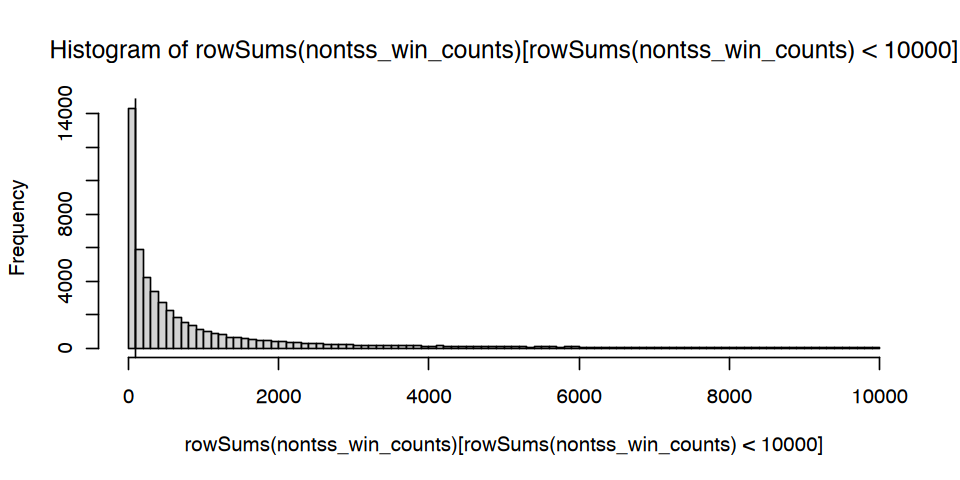

In [33]:
# exploring good cutoffs for enough transcription
quantile(rowSums(tss_win_counts))
length(rowSums(nontss_win_counts)[rowSums(nontss_win_counts) > 0])
options(repr.plot.height=4)
hist(rowSums(nontss_win_counts)[rowSums(nontss_win_counts) <  10000], breaks=120)
abline(v = 100)
length(rowSums(nontss_win_counts)[rowSums(nontss_win_counts) > 50])
length(rowSums(nontss_win_counts)[rowSums(nontss_win_counts) > 100])
quantile(rowSums(nontss_win_counts))
quantile(rowSums(nontss_win_counts)[rowSums(nontss_win_counts) < 10000])

In [34]:
old <- nrow(tss_win_counts)
tss_win_counts_filt = tss_win_counts[rowSums(tss_win_counts) > 25,]
cat("\nFixed TSS Bid: removed",old - nrow(tss_win_counts_filt), " Bid (", 
   nrow(tss_win_counts_filt), round(nrow(tss_win_counts_filt)/old, 3)*100, "% kept)")
# NonTSS Bid
old <- nrow(nontss_win_counts)
nontss_win_counts_filt = nontss_win_counts[rowSums(nontss_win_counts) > 25,]
cat("\nFixed nonTSS Bid: removed",old - nrow(nontss_win_counts_filt), " Bid (", 
   nrow(nontss_win_counts_filt), round(nrow(nontss_win_counts_filt)/old, 3)*100, "% kept)")



Fixed TSS Bid: removed 378  Bid ( 14608 97.5 % kept)
Fixed nonTSS Bid: removed 7122  Bid ( 46409 86.7 % kept)

## 2. Design & PCA

In [35]:
design <- data.table("Name"=c("UPM120_1", "UPM120_2", "UPM30_1", "UPM30_2", "Veh_1", "Veh_2"), 
                    "Replicate"=c("1", "2", "1", "2", "1", "2"), 
                    "Treatment"=c("UPM120", "UPM120", "UPM30", "UPM30", "VEH", "VEH"))
design$Replicate <- as.factor(design$Replicate)
design$Treatment <- as.factor(design$Treatment)
design


Name,Replicate,Treatment
<chr>,<fct>,<fct>
UPM120_1,1,UPM120
UPM120_2,2,UPM120
UPM30_1,1,UPM30
UPM30_2,2,UPM30
Veh_1,1,VEH
Veh_2,2,VEH


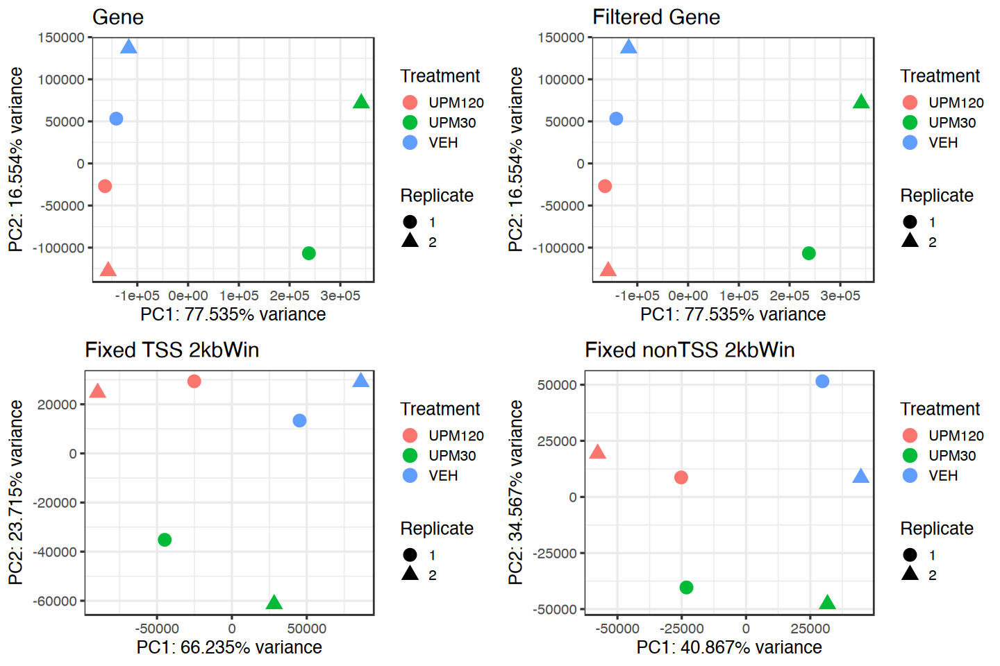

In [36]:
## Some functions for initial comparison to assess batch effects
plotPCA_hope_meta <- function(counts, metadata, ntop=500, Treat=TRUE) {
    rv <- rowVars(counts)
    length(rv) == nrow(counts)
    select <- order(rv, decreasing = TRUE)[seq_len(min(ntop,  length(rv)))]
    pca <- prcomp(t(counts[select, ]))
      percentVar <- pca$sdev^2/sum(pca$sdev^2)
    if (Treat == TRUE) {
        ## Select the PCAs and percentVar that you like instead of 1 and 2
  d <- data.frame(PC1 = pca$x[, 1], PC2 = pca$x[, 2], metadata)
    ggplot() + 
    geom_point(data=d, aes(x = PC1, y = PC2, color=Treatment, shape=Replicate), size = 5) + 
    xlab(paste0("PC1: ", round(percentVar[1] * 100, 3), "% variance")) + 
    ylab(paste0("PC2: ", round(percentVar[2] * 100, 3), "% variance")) + 
     theme_bw(base_size=15)
    } else {
        ## Select the PCAs and percentVar that you like instead of 1 and 2
  d <- data.frame(PC1 = pca$x[, 1], PC2 = pca$x[, 2], metadata)
    ggplot() + 
    geom_point(data=d, aes(x = PC1, y = PC2, color=Replicate), size = 5) + 
    xlab(paste0("PC1: ", round(percentVar[1] * 100, 3), "% variance")) + 
    ylab(paste0("PC2: ", round(percentVar[2] * 100, 3), "% variance")) + 
     theme_bw(base_size=15)
    }
  
}

p4 <- plotPCA_hope_meta(gene_counts, metadata=design, ntop=500) + ggtitle(paste0("Gene"))
p5 <- plotPCA_hope_meta(gene_filt_counts, metadata=design, ntop=500) + ggtitle(paste0("Filtered Gene"))
p6 <- plotPCA_hope_meta(tss_win_counts_filt, metadata=design, ntop=500) + ggtitle(paste0("Fixed TSS 2kbWin"))
p7 <- plotPCA_hope_meta(nontss_win_counts_filt, metadata=design, ntop=500) + ggtitle(paste0("Fixed nonTSS 2kbWin"))
options(repr.plot.height = 8, repr.plot.width = 12)
plot_grid(p4, p5, p6, p7, nrow=2)

## 2. Run DESeq2

In [37]:
# get the DESeq objects
## NOT FILTERED
dds_tss_win <- DESeqDataSetFromMatrix(countData = tss_win_counts, colData = design, design = ~ Treatment)
dds_nontss_win <- DESeqDataSetFromMatrix(countData = nontss_win_counts, colData = design, design = ~ Treatment)
dds_gene <- DESeqDataSetFromMatrix(countData = gene_counts, colData = design, design = ~ Treatment)

## FILTERED
dds_gene_filt <- DESeqDataSetFromMatrix(countData = gene_filt_counts, colData = design, design = ~ Treatment)
dds_tss_win_filt <- DESeqDataSetFromMatrix(countData = tss_win_counts_filt, colData = design, design = ~ Treatment)
dds_nontss_win_filt <- DESeqDataSetFromMatrix(countData = nontss_win_counts_filt, colData = design, design = ~ Treatment)

dss_hk <- DESeqDataSetFromMatrix(countData = gene_hk_counts, colData = design, design = ~ Treatment)


In [38]:
# make clear that reference is Vehicle
dds_tss_win$Treatment <- relevel(dds_tss_win$Treatment, ref = "VEH")
dds_nontss_win$Treatment <- relevel(dds_nontss_win$Treatment, ref = "VEH")
dds_gene$Treatment <- relevel(dds_gene$Treatment, ref = "VEH")

dds_tss_win_filt$Treatment <- relevel(dds_tss_win_filt$Treatment, ref = "VEH")
dds_nontss_win_filt$Treatment <- relevel(dds_nontss_win_filt$Treatment, ref = "VEH")
dds_gene_filt$Treatment <- relevel(dds_gene_filt$Treatment, ref = "VEH")

dss_hk$Treatment <- relevel(dss_hk$Treatment, ref="VEH")

### 2A. Size Factors

[1] 133

[1] 131

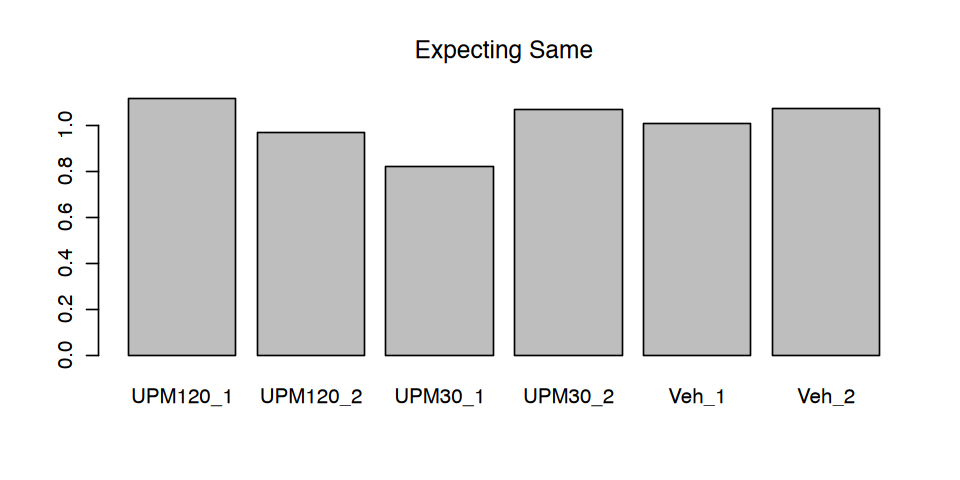

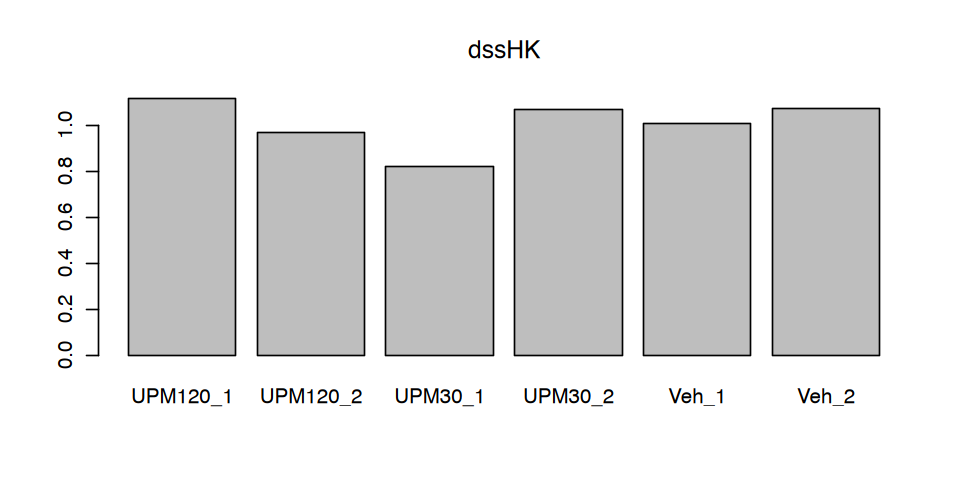

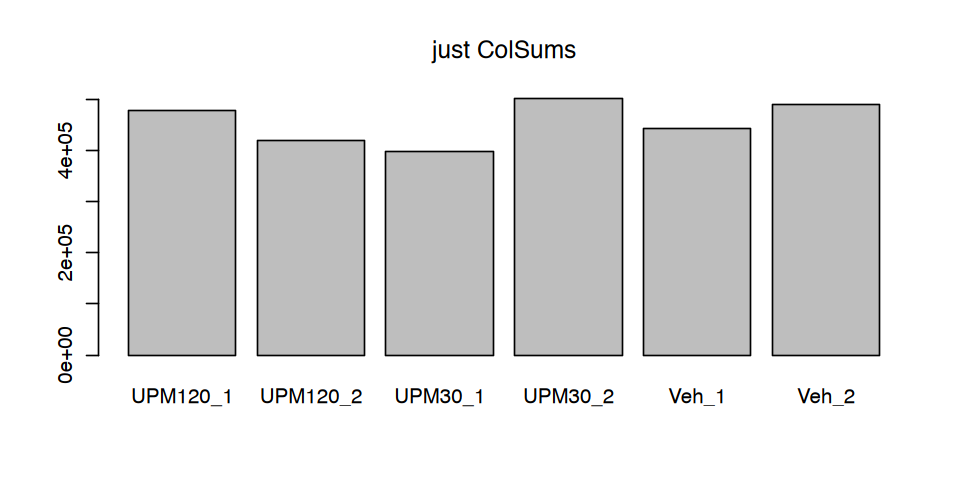

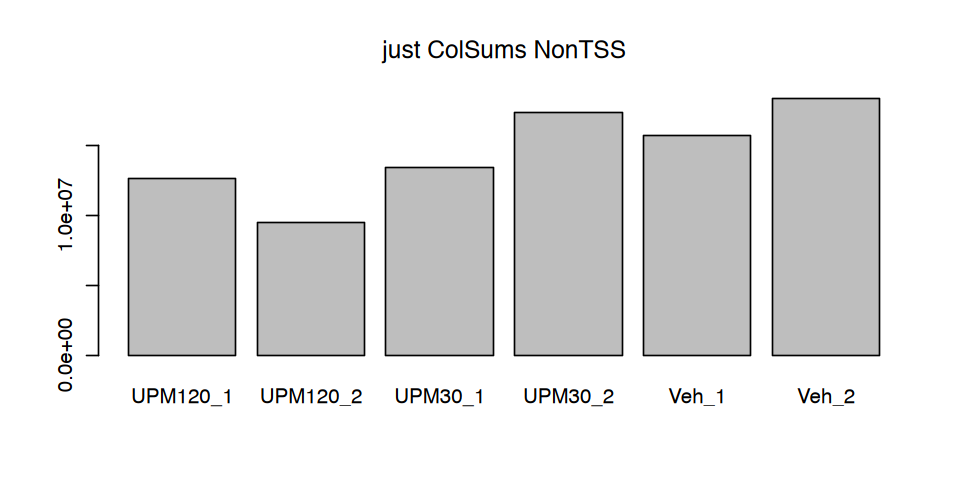

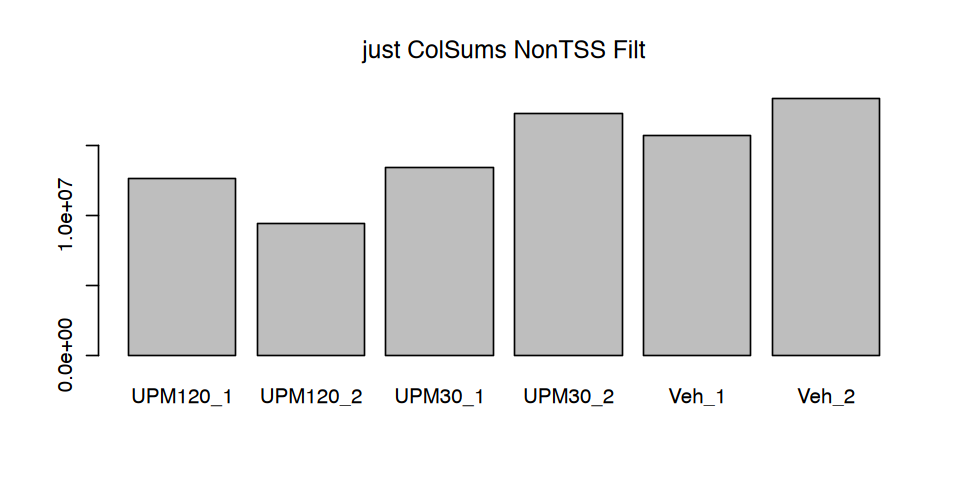

In [39]:
## Ratio
# get just the genes for normalization
isControl <- which(rownames(dds_gene_filt) %in% hk_genes)
length(hk_genes)
length(intersect(rownames(dds_gene_filt), hk_genes))
dds_gene_test = estimateSizeFactors(dds_gene_filt, controlGenes=isControl)
dds_gene_test2 = estimateSizeFactors(dss_hk)
dds_nontss_test = estimateSizeFactors(dds_nontss_win)
# test to see how different it would be without the control genes
options(repr.plot.height=4, repr.plot.width=8)
barplot(sizeFactors(dds_gene_test), main="Expecting Same")
barplot(sizeFactors(dds_gene_test2), main="dssHK")
barplot(colSums(gene_hk_counts), main="just ColSums")
barplot(colSums(nontss_win_counts), main="just ColSums NonTSS")
barplot(colSums(nontss_win_counts_filt), main="just ColSums NonTSS Filt")

In [40]:
sfs <- sizeFactors(dds_gene_test)
sizeFactors(dds_tss_win) <- sfs
sizeFactors(dds_tss_win_filt) <- sfs
sizeFactors(dds_nontss_win) <- sfs
sizeFactors(dds_nontss_win_filt) <- sfs
sizeFactors(dds_gene) <- sfs
sizeFactors(dds_gene_filt) <- sfs

using ntop=500 top features by variance

using ntop=500 top features by variance

using ntop=500 top features by variance



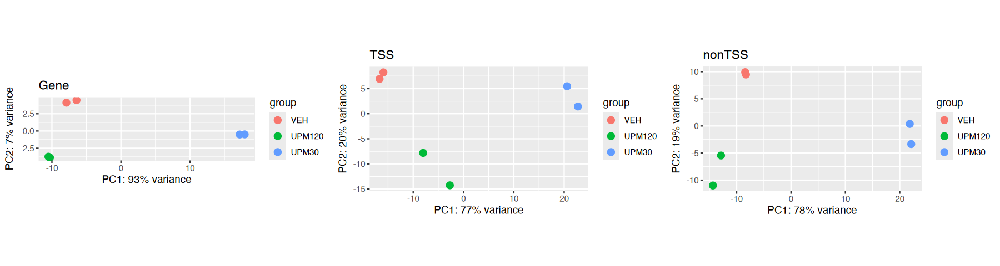

In [41]:
# plot PCA with with DESeq2 size factors
options(repr.plot.width=15, repr.plot.height=4)
# Ratio
vsd1 <- vst(dds_gene, blind = FALSE, fitType='local')
vsd3 <- vst(dds_tss_win, blind = FALSE, fitType='local')
vsd4 <- vst(dds_nontss_win, blind = FALSE, fitType='local')
p1 <- plotPCA(vsd1, intgroup = "Treatment") + ggtitle(paste0("Gene"))
p3 <- plotPCA(vsd3, intgroup = "Treatment") + ggtitle(paste0("TSS"))
p4 <- plotPCA(vsd4, intgroup = "Treatment") + ggtitle(paste0("nonTSS"))
plot_grid(p1, p3, p4, nrow=1)

In [ ]:
#save normalized counts
count_df = as.data.frame(counts(dds_gene, normalized=TRUE))
count_df$Gene <- rownames(count_df)
count_df[1:2,]
write.table(count_df, "../results/DESeq2/UPM_normalized_counts.txt", 
           row.names=FALSE, quote=FALSE)
rm(count_df)
gc()

count_df = as.data.frame(counts(dds_nontss_win, normalized=TRUE))
count_df$Gene <- rownames(count_df)
count_df[1:2,]
write.table(count_df, "../results/DESeq2/UPM_nontss_normalized_counts.txt", 
           row.names=FALSE, quote=FALSE)
rm(count_df)
gc()

,UPM120_1,UPM120_2,UPM30_1,UPM30_2,Veh_1,Veh_2,Gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
chr1:1133229-1133779,535.9884,515.0712,745.984818,812.53713,916.2887,1136.0651,chr1:1133229-1133779
chr1:1353573-1354013,317.2908,312.7587,1.222926,62.71888,282.2408,280.5214,chr1:1353573-1354013


,used,(Mb),gc trigger,(Mb),limit (Mb),max used,(Mb)
Ncells,8650040,462.0,14101000,753.1,NA,14101000,753.1
Vcells,19895374,151.8,38464719,293.5,16384,38464719,293.5


### 2B. Estimate Dispersions & Run Signfiicance Tests

In [228]:
## Ratio Normalization (parameteric is default)
dds_gene = estimateDispersions(dds_gene, fitType="parametric")
dds_tss_win = estimateDispersions(dds_tss_win, fitType="parametric")
dds_nontss_win = estimateDispersions(dds_nontss_win, fitType="parametric") # had to use local

dds_gene_filt = estimateDispersions(dds_gene_filt, fitType="parametric")
dds_tss_win_filt = estimateDispersions(dds_tss_win_filt, fitType="parametric")
dds_nontss_win_filt = estimateDispersions(dds_nontss_win_filt, fitType="parametric") # had to use local

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

gene-wise dispersion estimates

mean-dispersion relationship

-- note: fitType='parametric', but the dispersion trend was not well captured by the
   function: y = a/x + b, and a local regression fit was automatically substituted.
   specify fitType='local' or 'mean' to avoid this message next time.

final dispersion estimates

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

gene-wise dispersion estimates

mean-dispersion relationship

-- note: fitType='parametric', but the dispersion trend was not well captured by the
   function: y = a/x + b, and a local regression fit was automatically substituted.
   specify fitType='local' or 'mean' to avoid this message next time.

final di

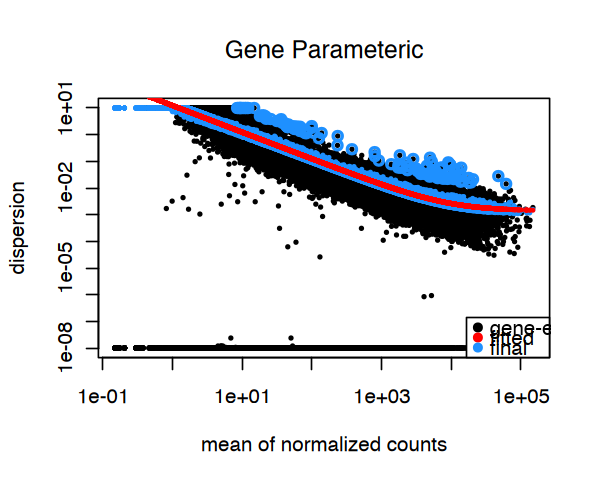

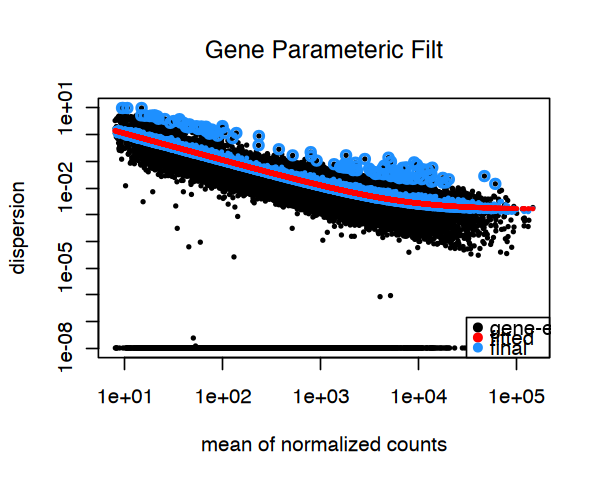

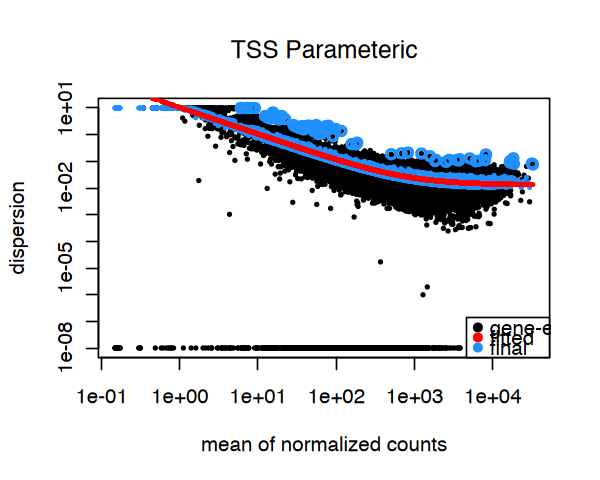

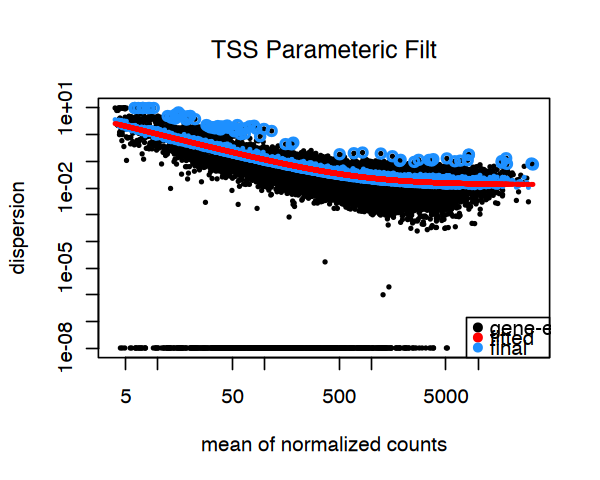

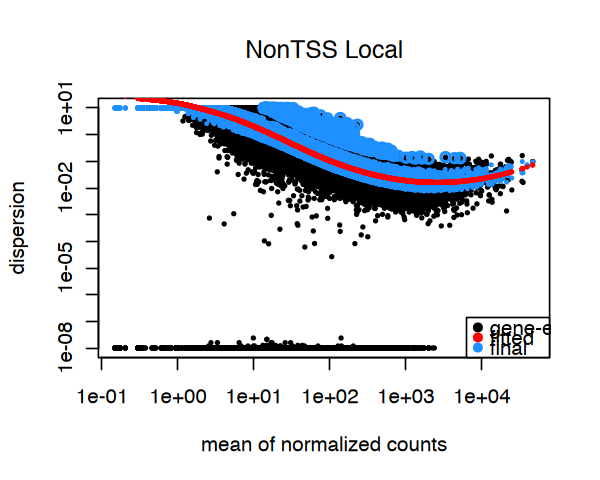

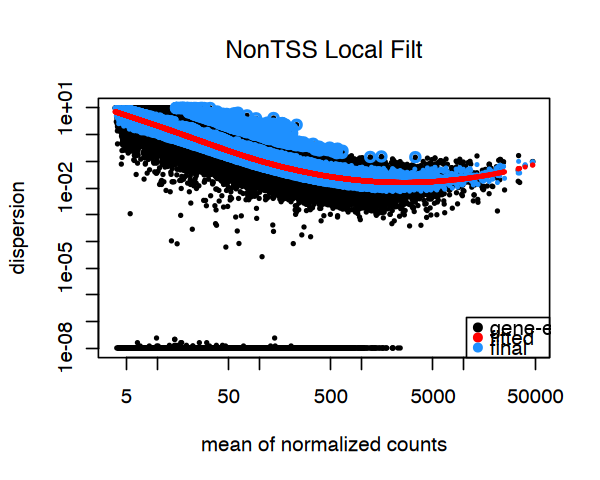

In [229]:
options(repr.plot.height=4, repr.plot.width=5)
plotDispEsts(dds_gene, main= "Gene Parameteric")
plotDispEsts(dds_gene_filt, main= "Gene Parameteric Filt")
plotDispEsts(dds_tss_win, main= "TSS Parameteric")
plotDispEsts(dds_tss_win_filt, main= "TSS Parameteric Filt")
plotDispEsts(dds_nontss_win, main= "NonTSS Local")
plotDispEsts(dds_nontss_win_filt, main= "NonTSS Local Filt")

In [230]:
dds_gene = nbinomWaldTest(dds_gene)
dds_tss_win = nbinomWaldTest(dds_tss_win)
dds_nontss_win = nbinomWaldTest(dds_nontss_win)

dds_gene_filt = nbinomWaldTest(dds_gene_filt)
dds_tss_win_filt = nbinomWaldTest(dds_tss_win_filt)
dds_nontss_win_filt = nbinomWaldTest(dds_nontss_win_filt)

### 2C. Get Results

In [231]:
binwidth_use=0.05
# Set your thresholds
padj_threshold <- 0.05
log2fc_threshold <- 0

In [232]:
# Get the significance comparisons ready
Up_Sig_genes = list("P120_vs_Veh"=c(), "P30_vs_Veh"=c(), "P120_vs_P30"=c())
Down_Sig_genes = list("P120_vs_Veh"=c(), "P30_vs_Veh"=c(), "P120_vs_P30"=c())
All_Sig_genes = list("P120_vs_Veh_up"=c(), "P30_vs_Veh_up"=c(), "P120_vs_P30_up"=c(), 
                     "P120_vs_Veh_down"=c(), "P30_vs_Veh_down"=c(), "P120_vs_P30_down"=c())
Up_Sig_nontss = list("P120_vs_Veh"=c(), "30_vs_Veh"=c(), "P120_vs_P30"=c())
Down_Sig_nontss = list("P120_vs_Veh"=c(), "30_vs_Veh"=c(), "P120_vs_P30"=c())
All_Sig_nontss = list("P120_vs_Veh_up"=c(), "30_vs_Veh_up"=c(), "P120_vs_P30_up"=c(), 
                     "P120_vs_Veh_down"=c(), "30_vs_Veh_down"=c(), "P120_vs_P30_down"=c())

In [233]:
gene_tss <- as.data.frame(fread("~/Downloads/assets//hg38_TSS1kb_refseq_diff53prime_with_putatives.bed"))
gene_tss[1:2,]
# only include the calls in the counts
gene_tss = gene_tss[gene_tss$V4 %in% kept_isoforms,]
gene_tss$Gene <- str_split_fixed(gene_tss$V4, ":", 2)[,1]
# get the tss
gene_tss$tss <- as.integer(as.integer(gene_tss$V2 + gene_tss$V3)/2)
# get the start and stop of tss for 3kb window
gene_tss$start = as.integer(gene_tss$tss - 1500)
gene_tss$stop = as.integer(gene_tss$tss + 1500)

,V1,V2,V3,V4,V5,V6
,<chr>,<int>,<int>,<chr>,<chr>,<chr>
1,chr1,11373,12373,DDX11L1:NR_046018.2,.,+
2,chr1,28870,29870,WASH7P:NR_024540.1,.,-


In [234]:
# function to get TFEA results
get_tfea_input_gene <- function(res, name, gene_tss) {
    # split by fold change (0 and positive)
    # rank by p-value (FC+ highest p-value to lowest)
    res <- as.data.frame(res)
    res[1:2,]
    old <- nrow(res)
    cat("\nNum orig & new", old, nrow(res))
    pos_FC <- res[res$log2FoldChange > 0,]
    neg_FC <- res[res$log2FoldChange < 0,]
    zero_FC <- res[res$log2FoldChange == 0,]
    # rank by p-value then FC
    pos_FC <- pos_FC %>%
      arrange(pvalue, desc(log2FoldChange))  # Sort by pval (ascending), then L2FC (descending)
    neg_FC <- neg_FC %>%
      arrange(desc(pvalue), desc(log2FoldChange)) # Sort by pval (descending), then L2FC (descending since most negative last)
    print(pos_FC[1:2,])
    print(neg_FC[1:2,])
    # recombine with any 0s in between
    pos_cutoff = nrow(pos_FC); neg_cutoff = nrow(neg_FC)
    if (nrow(zero_FC) != 0) {
        full_res = rbind(pos_FC, zero_FC, neg_FC)
        } else {
        full_res = rbind(pos_FC, neg_FC) }
    # print the position at which the separations take place
    cat("\n Positive rank end", nrow(pos_FC), "Negative rank end", nrow(full_res)-nrow(neg_FC), "Number zeros", nrow(zero_FC))
    set_used <- rownames(full_res)
    # now get the dataframe to save
    tfea_input <- data.frame("Name"=set_used)
    print(tfea_input[1:2,])
    # fc,p-value,rank
    tfea_input$fc_info <- paste0(2**(full_res$log2FoldChange), ",", full_res$pvalue, ",", paste0(seq(1, nrow(tfea_input))))
    # get the gene tss positions to line up
    filt_tss = gene_tss[gene_tss$Gene %in% set_used,]
    rownames(filt_tss) <- filt_tss$Gene
    filt_tss = filt_tss[set_used,]
    if (!identical(filt_tss$Gene, rownames(full_res))) {
        print(filt_tss[1:2,])
        print(full_res[1:2,])
        stop("Wrong order")}
    tfea_input$chrom = filt_tss$V1
    tfea_input$start = filt_tss$start
    tfea_input$stop = filt_tss$stop
    tfea_input$gene = filt_tss$Gene
    tfea_input = tfea_input[,c("chrom", "start", "stop", "fc_info", "gene")]
    colnames(tfea_input) <- c("#chrom", "start", "stop", "fc,p-value,rank", "gene")
    print(tfea_input[1:2,])
    write.table(tfea_input, 
                paste0(tfea_input_dir, name), 
                quote=FALSE, sep="\t", row.names=FALSE)
    }

[1] "UPM30 vs Veh"

out of 20770 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 5079, 24%
LFC < 0 (down)     : 5392, 26%
outliers [1]       : 0, 0%
low counts [2]     : 0, 0%
(mean count < 8)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results


Num orig & new 20770 20770         baseMean log2FoldChange      lfcSE     stat pvalue padj
SLC7A11  9546.002       3.984801 0.07978653 49.94327      0    0
CD55    13976.234       3.375153 0.07482705 45.10605      0    0
        baseMean log2FoldChange     lfcSE          stat    pvalue      padj
RASA4CP 84.17094  -6.735691e-05 0.6166517 -0.0001092301 0.9999128 0.9999128
ZFPM2   57.22069  -7.319609e-04 0.5947298 -0.0012307452 0.9990180 0.9992460

 Positive rank end 10468 Negative rank end 10468 Number zeros 0[1] "SLC7A11" "CD55"   
  #chrom     start      stop      fc,p-value,rank    gene
1   chr4 138240849 138243849 15.8323176954698,0,1 SLC7A11
2   chr1 207320177 207323177 1

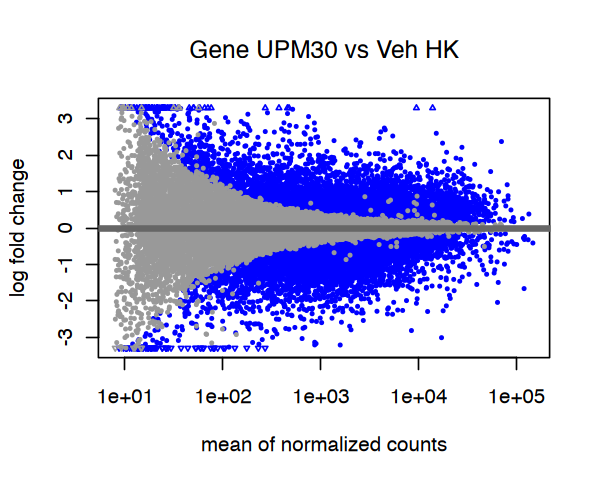

[1] 5079

[1] 5392

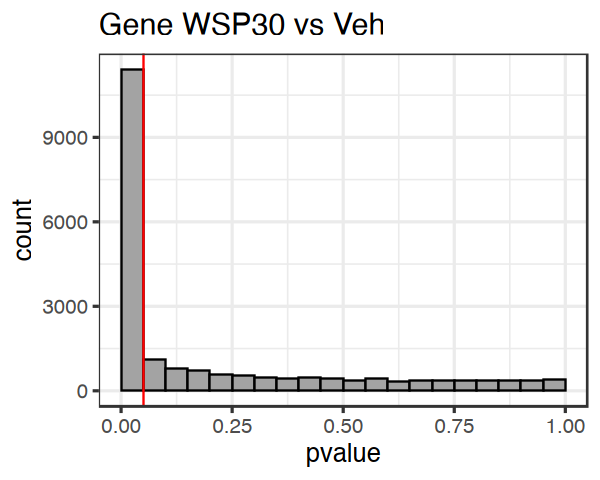

[1] "UPM120 vs Veh"

out of 20770 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 376, 1.8%
LFC < 0 (down)     : 4657, 22%
outliers [1]       : 0, 0%
low counts [2]     : 2014, 9.7%
(mean count < 32)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results


Num orig & new 20770 20770        baseMean log2FoldChange      lfcSE     stat        pvalue          padj
CYP1B1  3987.479       3.245862 0.10028277 32.36709 7.974719e-230 1.495738e-225
MSMB   13014.022       1.774475 0.07344056 24.16205 5.578185e-129 5.231222e-125
         baseMean log2FoldChange     lfcSE          stat    pvalue     padj
CYB561D1 281.1869  -0.0001257414 0.3192792 -0.0003938292 0.9996858 0.999899
EXOSC9   587.6085  -0.0001260465 0.1885209 -0.0006686074 0.9994665 0.999733

 Positive rank end 5012 Negative rank end 5013 Number zeros 1[1] "CYP1B1" "MSMB"  
  #chrom    start     stop                          fc,p-value,rank   gene
1   chr2 38074651 38077

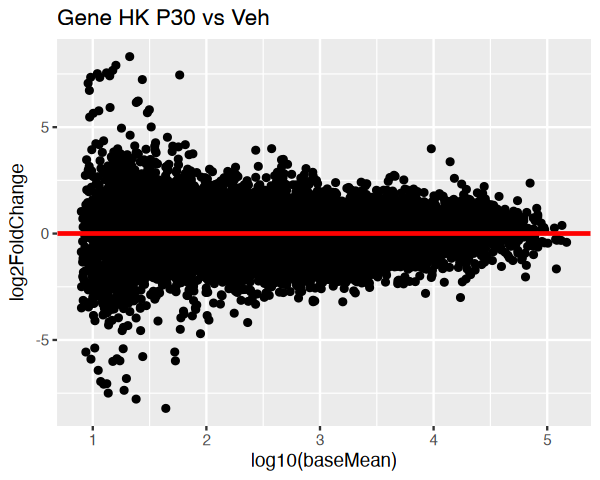

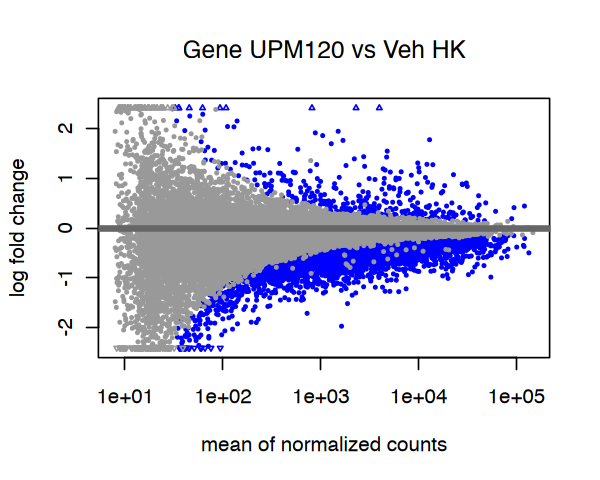

[1] 376

[1] 4657

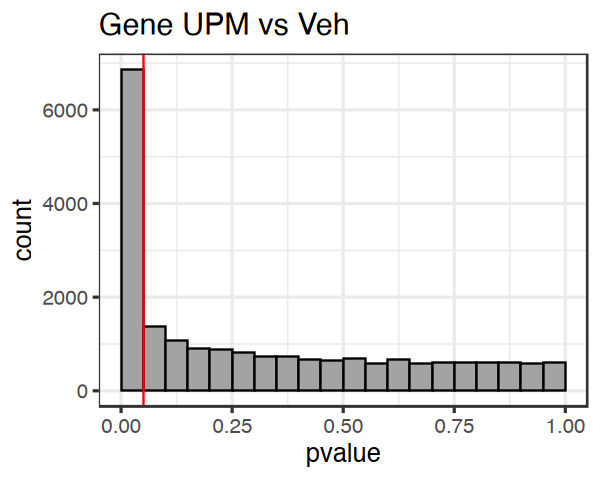

[1] "UPM120 vs UPM30"

out of 20770 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 4006, 19%
LFC < 0 (down)     : 7183, 35%
outliers [1]       : 0, 0%
low counts [2]     : 0, 0%
(mean count < 8)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results


Num orig & new 20770 20770         baseMean log2FoldChange      lfcSE     stat        pvalue
ANGPTL4  8490.545       2.490118 0.08001666 31.11999 1.292181e-212
EGLN3   17241.753       2.216464 0.07287052 30.41648 3.326415e-203
                 padj
ANGPTL4 1.341930e-209
EGLN3   2.657294e-200
           baseMean log2FoldChange     lfcSE          stat    pvalue      padj
PITPNA-AS1 122.1531  -0.0002125912 0.4091528 -0.0005195887 0.9995854 0.9996817
PIK3CA-DT   54.9577  -0.0005298333 0.6037825 -0.0008775234 0.9992998 0.9994442

 Positive rank end 8191 Negative rank end 8191 Number zeros 0[1] "ANGPTL4" "EGLN3"  
  #chrom    start     stop                          fc,p-value,r

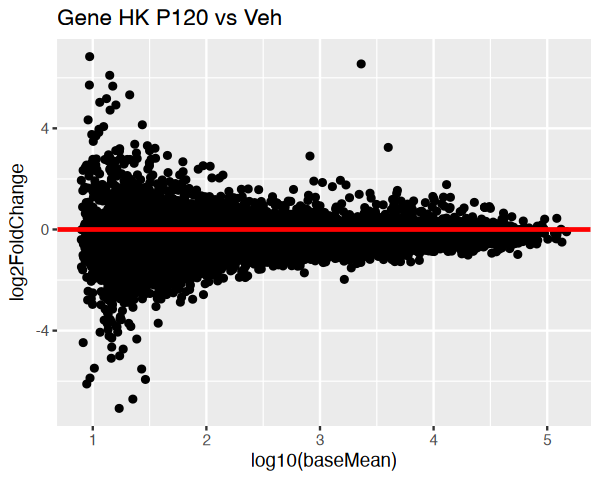

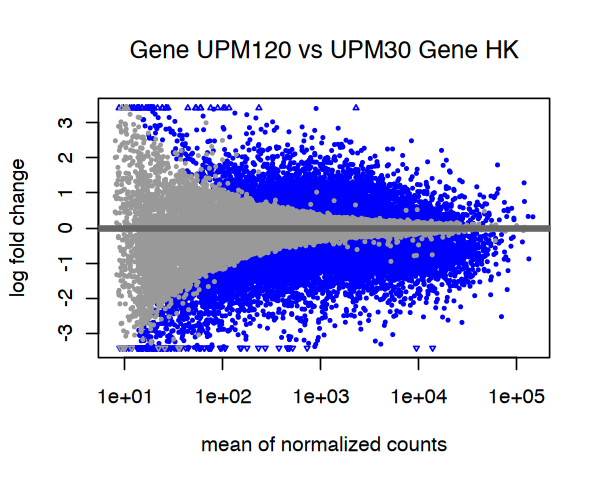

[1] 4006

[1] 7183

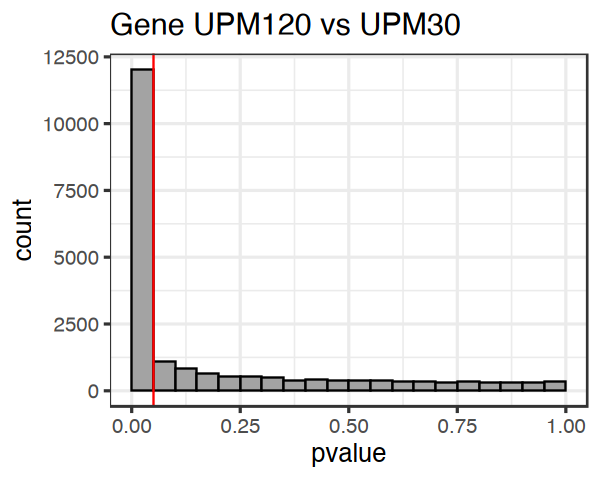

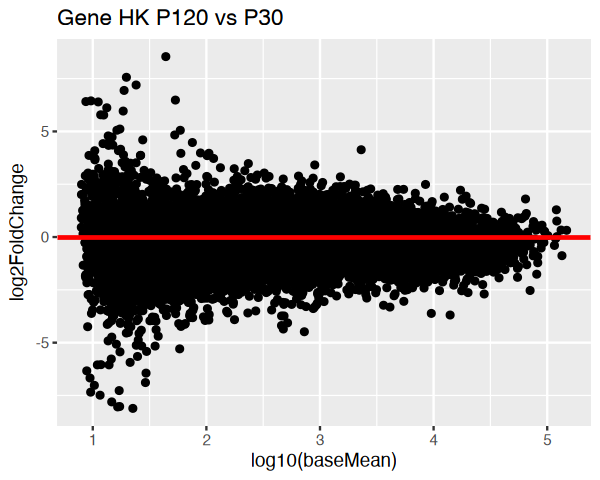

In [235]:
# Gene Results
padj_threshold=0.05
print("UPM30 vs Veh")
options(repr.plot.height=4, repr.plot.width=5)
gene_res = results(dds_gene_filt, contrast= c("Treatment", "UPM30", "VEH"), alpha=padj_threshold)
gene_res <- gene_res[order(gene_res$pvalue),]
summary(gene_res)
get_tfea_input_gene(gene_res, "GeneTSS_UPM30_vs_Veh_par_rat_Wd_GeneHK.bed", gene_tss)
plotMA(gene_res, main="Gene UPM30 vs Veh HK")
ggplot(data.frame(gene_res), aes(x=pvalue)) + geom_histogram(fill="grey64", binwidth=binwidth_use, color="black", boundary=0) + theme_bw(base_size=15) + 
       geom_vline(xintercept=padj_threshold, color="red") + ggtitle("Gene WSP30 vs Veh")
up_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange > 0), ])
down_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange < 0), ])
length(up_sig_genes); length(down_sig_genes)
Up_Sig_genes[["P30_vs_Veh"]] = up_sig_genes
All_Sig_genes[["P30_vs_Veh_up"]] = up_sig_genes
Down_Sig_genes[["P30_vs_Veh"]] = down_sig_genes
All_Sig_genes[["P30_vs_Veh_down"]] = down_sig_genes

testing = as.data.frame(gene_res)
ggplot(testing, aes(x=log10(baseMean), y=log2FoldChange)) + geom_point() + 
geom_hline(yintercept=0, color="red", size=1) + ggtitle("Gene HK P30 vs Veh")
write.table(gene_res, 
            paste0(results_dir, "res_Gene_UPM30_vs_Veh_par_rat_Wd_GeneHK.txt"), 
            sep=",", quote=FALSE)

print("UPM120 vs Veh")
options(repr.plot.height=4, repr.plot.width=5)
gene_res = results(dds_gene_filt, contrast= c("Treatment", "UPM120", "VEH"), alpha=padj_threshold)
gene_res <- gene_res[order(gene_res$pvalue),]
summary(gene_res)
get_tfea_input_gene(gene_res, "GeneTSS_UPM120_vs_Veh_par_rat_Wd_GeneHK.bed", gene_tss)
plotMA(gene_res, main="Gene UPM120 vs Veh HK")
ggplot(data.frame(gene_res), aes(x=pvalue)) + geom_histogram(fill="grey64", binwidth=binwidth_use, color="black", boundary=0) + theme_bw(base_size=15) + 
       geom_vline(xintercept=padj_threshold, color="red") + ggtitle("Gene UPM vs Veh")
up_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange > 0), ])
down_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange < 0), ])
length(up_sig_genes); length(down_sig_genes)
Up_Sig_genes[["P120_vs_Veh"]] = up_sig_genes
All_Sig_genes[["P120_vs_Veh_up"]] = up_sig_genes
Down_Sig_genes[["P120_vs_Veh"]] = down_sig_genes
All_Sig_genes[["P120_vs_Veh_down"]] = down_sig_genes

testing = as.data.frame(gene_res)
ggplot(testing, aes(x=log10(baseMean), y=log2FoldChange)) + geom_point() + 
geom_hline(yintercept=0, color="red", size=1) + ggtitle("Gene HK P120 vs Veh")
write.table(gene_res, 
            paste0(results_dir, "res_Gene_UPM120_vs_Veh_par_rat_Wd_GeneHK.txt"), 
            sep=",", quote=FALSE)

print("UPM120 vs UPM30")
options(repr.plot.height=4, repr.plot.width=5)
gene_res = results(dds_gene_filt, contrast= c("Treatment", "UPM120", "UPM30"), alpha=padj_threshold)
gene_res <- gene_res[order(gene_res$pvalue),]
summary(gene_res)
get_tfea_input_gene(gene_res, "GeneTSS_UPM120_vs_UPM30_par_rat_Wd_GeneHK.bed", gene_tss)
plotMA(gene_res, main="Gene UPM120 vs UPM30 Gene HK")
ggplot(data.frame(gene_res), aes(x=pvalue)) + geom_histogram(fill="grey64", binwidth=binwidth_use, color="black", boundary=0) + theme_bw(base_size=15) + 
       geom_vline(xintercept=padj_threshold, color="red") + ggtitle("Gene UPM120 vs UPM30")
up_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange > 0), ])
down_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange < 0), ])
length(up_sig_genes); length(down_sig_genes)
Up_Sig_genes[["P120_vs_P30"]] = up_sig_genes
All_Sig_genes[["P120_vs_P30_up"]] = up_sig_genes
Down_Sig_genes[["P120_vs_P30"]] = down_sig_genes
All_Sig_genes[["P120_vs_P30_down"]] = down_sig_genes

testing = as.data.frame(gene_res)
ggplot(testing, aes(x=log10(baseMean), y=log2FoldChange)) + geom_point() + 
geom_hline(yintercept=0, color="red", size=1) + ggtitle("Gene HK P120 vs P30")
write.table(gene_res, 
            paste0(results_dir, "res_Gene_UPM120_vs_UPM30_par_rat_Wd_GeneHK.txt"), 
            sep=",", quote=FALSE)

In [236]:
# function to get TFEA results
get_tfea_input <- function(res, name) {
    # split by fold change (0 and positive)
    # rank by p-value (FC+ highest p-value to lowest)
    res <- as.data.frame(res)
    res[1:2,]
    old <- nrow(res)
    cat("\nNum orig & new", old, nrow(res))
    pos_FC <- res[res$log2FoldChange > 0,]
    neg_FC <- res[res$log2FoldChange < 0,]
    zero_FC <- res[res$log2FoldChange == 0,]
     # rank by p-value then FC
    pos_FC <- pos_FC %>%
      arrange(pvalue, desc(log2FoldChange))  # Sort by pval (ascending), then L2FC (descending)
    neg_FC <- neg_FC %>%
      arrange(desc(pvalue), desc(log2FoldChange)) # Sort by pval (descending), then L2FC (descending since most negative last)
    print(pos_FC[1:2,])
    print(neg_FC[1:2,])
    # recombine with any 0s in between
    pos_cutoff = nrow(pos_FC); neg_cutoff = nrow(neg_FC)
    if (nrow(zero_FC) != 0) {
        full_res = rbind(pos_FC, zero_FC, neg_FC)
        } else {
        full_res = rbind(pos_FC, neg_FC) }
    # print the position at which the separations take place
    cat("\n Positive rank end", nrow(pos_FC), "Negative rank end", nrow(full_res)-nrow(neg_FC), "Number zeros", nrow(zero_FC))
    set_used <- rownames(full_res)
    # now get the dataframe to save
    tfea_input <- data.frame(str_split_fixed(set_used, ":", 2))
    print(tfea_input[1:2,])
    # fc,p-value,rank
    tfea_input$fc_info <- paste0(2**(full_res$log2FoldChange), ",", full_res$pvalue, ",", paste0(seq(1, nrow(tfea_input))))
    colnames(tfea_input) <- c("#chrom", "start_stop", "fc,p-value,rank")
    tfea_input_points = str_split_fixed(tfea_input$start_stop, "-", 2)
    tfea_input$mu <- as.integer((as.numeric(tfea_input_points[,1]) + as.numeric(tfea_input_points[,2]))/2)
    tfea_input$start = tfea_input$mu - 1500
    tfea_input$stop = tfea_input$mu + 1500
    print(tfea_input[1:2,])
    write.table(tfea_input[,c("#chrom", "start", "stop", "fc,p-value,rank")], 
                paste0(tfea_input_dir, name), 
                quote=FALSE, sep="\t", row.names=FALSE)
    }

[1] "UPM30 vs Veh"

out of 46409 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 5691, 12%
LFC < 0 (down)     : 4091, 8.8%
outliers [1]       : 0, 0%
low counts [2]     : 1800, 3.9%
(mean count < 7)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results


Num orig & new 46409 46409                       baseMean log2FoldChange     lfcSE     stat        pvalue
chr5:399569-400251     1299.319       3.977447 0.1647303 24.14521 8.384696e-129
chr2:38095956-38096612 1633.245       2.264431 0.1432313 15.80961  2.671037e-56
                                padj
chr5:399569-400251     3.740329e-124
chr2:38095956-38096612  3.971744e-52
                           baseMean log2FoldChange     lfcSE          stat
chr12:109831582-109832012 314.15642  -1.310163e-05 0.2409003 -5.438611e-05
chr17:46530175-46530597    36.96478  -5.114147e-05 0.7777525 -6.575545e-05
                             pvalue padj
chr12:109831582-109832012 0.999956

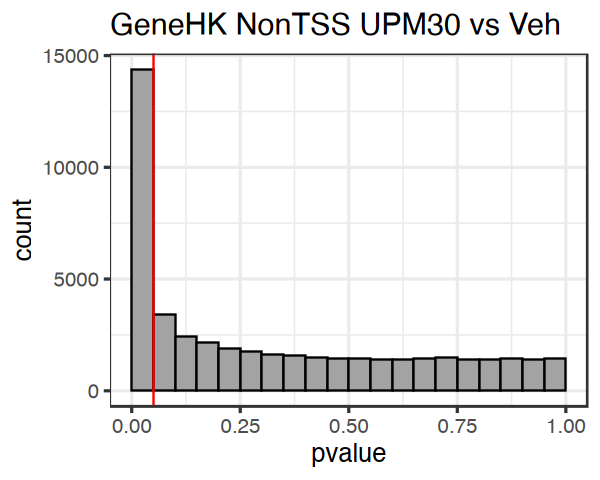

[1] 5691

[1] 4091

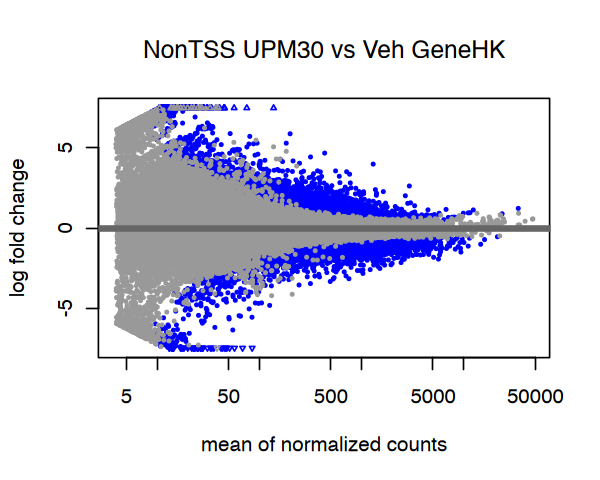

[1] "UPM120 vs Veh"

out of 46409 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 261, 0.56%
LFC < 0 (down)     : 12929, 28%
outliers [1]       : 0, 0%
low counts [2]     : 7198, 16%
(mean count < 17)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results


Num orig & new 46409 46409                        baseMean log2FoldChange     lfcSE     stat       pvalue
chr5:399569-400251      1299.319       3.016849 0.1657463 18.20161 5.010967e-74
chr15:74642026-74642998 2935.220       1.898810 0.1674756 11.33783 8.523309e-30
                                padj
chr5:399569-400251      1.964850e-69
chr15:74642026-74642998 1.114025e-25
                          baseMean log2FoldChange    lfcSE          stat
chr1:88060465-88061001    4.832965  -2.562000e-04 2.708079 -9.460580e-05
chr4:139645521-139645971 22.830630  -9.802268e-05 1.015375 -9.653842e-05
                            pvalue padj
chr1:88060465-88061001   0.9999245   NA

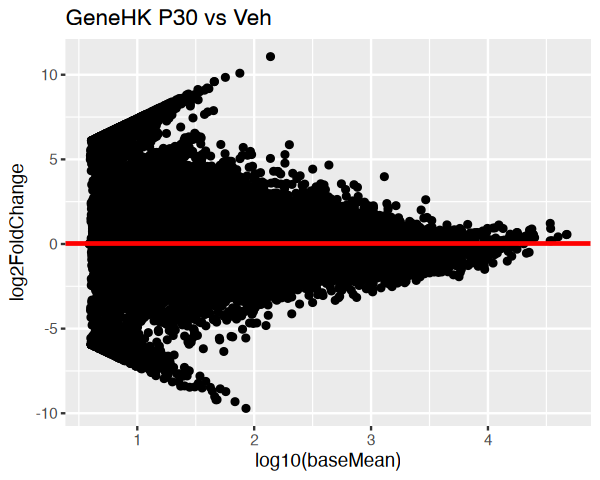

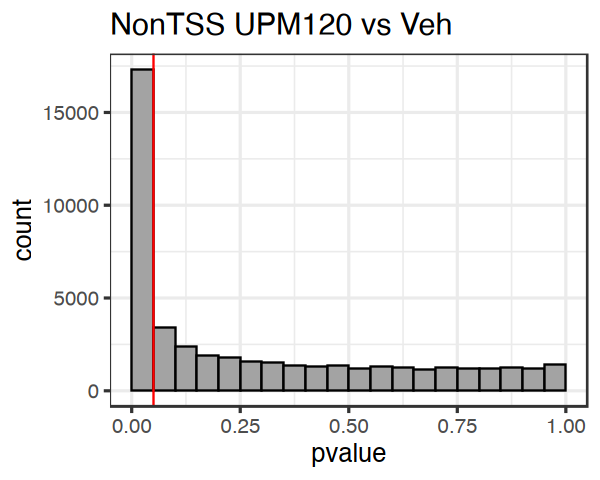

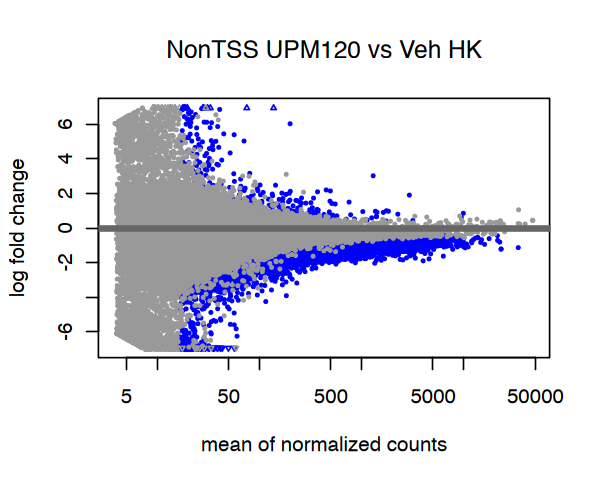

[1] "UPM120 vs UPM30"

out of 46409 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 1361, 2.9%
LFC < 0 (down)     : 16443, 35%
outliers [1]       : 0, 0%
low counts [2]     : 1800, 3.9%
(mean count < 7)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results


Num orig & new 46409 46409                         baseMean log2FoldChange     lfcSE     stat
chrX:107643889-107644423 541.3336       2.815702 0.2443360 11.52389
chr3:107524566-107525130 752.7875       2.183764 0.1897354 11.50952
                               pvalue         padj
chrX:107643889-107644423 9.998866e-31 5.186505e-28
chr3:107524566-107525130 1.181287e-30 5.855113e-28
                         baseMean log2FoldChange    lfcSE          stat
chr2:87075076-87075858   326.5213  -4.159369e-06 0.269078 -1.545785e-05
chr4:185376514-185377006 357.5877  -3.197216e-05 0.233295 -1.370461e-04
                            pvalue padj
chr2:87075076-87075858   0.9999877

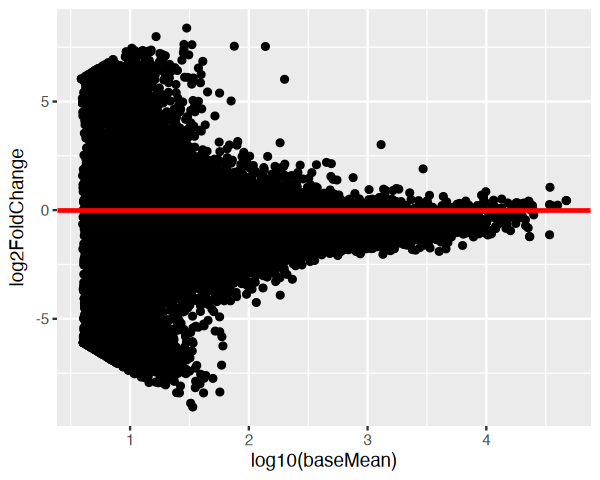

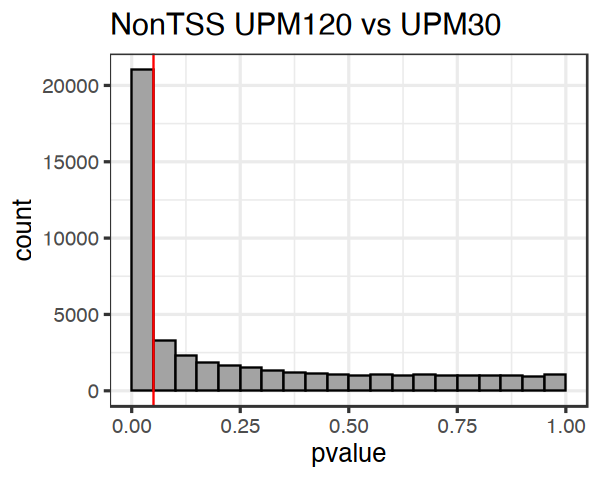

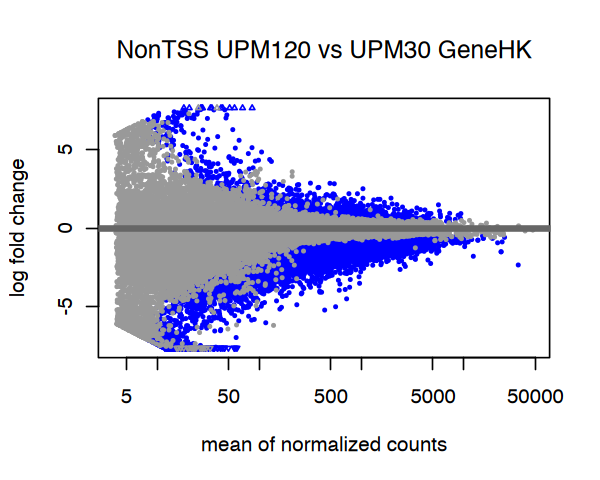

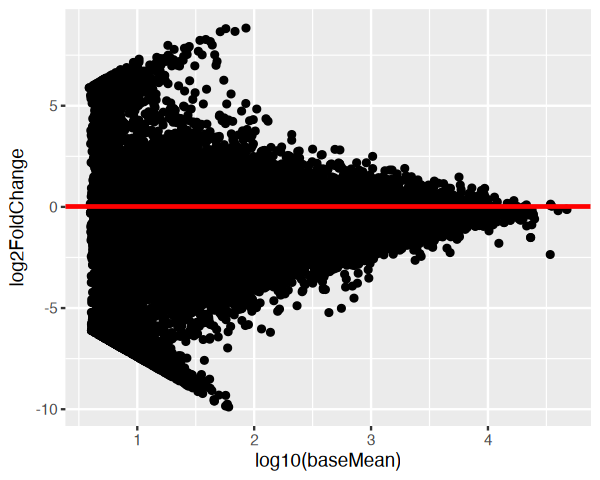

In [237]:
# NonTSS Results
options(repr.plot.height=4, repr.plot.width=5)
print("UPM30 vs Veh")
nontss_res = results(dds_nontss_win_filt, contrast= c("Treatment", "UPM30", "VEH"), alpha=0.05)
summary(nontss_res)
get_tfea_input(nontss_res, "NonTSS_UPM30_vs_Veh_par_rat_Wd_GeneHK.bed")
nontss_res <- nontss_res[order(nontss_res$pvalue),]
# plot pvalues
ggplot(data.frame(nontss_res), aes(x=pvalue)) + geom_histogram(fill="grey64", binwidth=binwidth_use, color="black", boundary=0) + theme_bw(base_size=15) + 
       geom_vline(xintercept=0.05, color="red") + ggtitle("GeneHK NonTSS UPM30 vs Veh")
plotMA(nontss_res, main="NonTSS UPM30 vs Veh GeneHK")
up_sig_nontss <- rownames(nontss_res[which(nontss_res$padj < padj_threshold & nontss_res$log2FoldChange > 0), ])
down_sig_nontss <- rownames(nontss_res[which(nontss_res$padj < padj_threshold & nontss_res$log2FoldChange < 0), ])
length(up_sig_nontss); length(down_sig_nontss)
Up_Sig_nontss[["P30_vs_Veh"]] = up_sig_nontss
All_Sig_nontss[["P30_vs_Veh_up"]] = up_sig_nontss
Down_Sig_nontss[["P30_vs_Veh"]] = down_sig_nontss
All_Sig_nontss[["P30_vs_Veh_down"]] = down_sig_nontss
testing = as.data.frame(nontss_res)
ggplot(testing, aes(x=log10(baseMean), y=log2FoldChange)) + geom_point() + 
geom_hline(yintercept=0, color="red", size=1) + ggtitle("GeneHK P30 vs Veh")
write.table(nontss_res, 
            paste0(results_dir, "res_NonTSS_UPM30_vs_Veh_par_rat_Wd_GeneHK.txt"), 
            sep=",", quote=FALSE)

print("UPM120 vs Veh")
nontss_res = results(dds_nontss_win_filt, contrast= c("Treatment", "UPM120", "VEH"), alpha=0.05)
summary(nontss_res)
get_tfea_input(nontss_res, "NonTSS_UPM120_vs_Veh_par_rat_Wd_GeneHK.bed")
nontss_res <- nontss_res[order(nontss_res$pvalue),]
# plot pvalues
ggplot(data.frame(nontss_res), aes(x=pvalue)) + geom_histogram(fill="grey64", binwidth=binwidth_use, color="black", boundary=0) + theme_bw(base_size=15) + 
       geom_vline(xintercept=0.05, color="red") + ggtitle("NonTSS UPM120 vs Veh")
plotMA(nontss_res, main="NonTSS UPM120 vs Veh HK")
up_sig_nontss <- rownames(nontss_res[which(nontss_res$padj < padj_threshold & nontss_res$log2FoldChange > 0), ])
down_sig_nontss <- rownames(nontss_res[which(nontss_res$padj < padj_threshold & nontss_res$log2FoldChange < 0), ])

Up_Sig_nontss[["P120_vs_Veh"]] = up_sig_nontss
All_Sig_nontss[["P120_vs_Veh_up"]] = up_sig_nontss
Down_Sig_nontss[["P120_vs_Veh"]] = down_sig_nontss
All_Sig_nontss[["P120_vs_Veh_down"]] = down_sig_nontss
testing = as.data.frame(nontss_res)
ggplot(testing, aes(x=log10(baseMean), y=log2FoldChange)) + geom_point() + 
geom_hline(yintercept=0, color="red", size=1)
write.table(nontss_res, 
            paste0(results_dir, "res_NonTSS_UPM120_vs_Veh_par_rat_Wd_GeneHK.txt"), 
            sep=",", quote=FALSE)


print("UPM120 vs UPM30")
nontss_res = results(dds_nontss_win_filt, contrast= c("Treatment", "UPM120", "UPM30"), alpha=0.05)
summary(nontss_res)
get_tfea_input(nontss_res, "NonTSS_UPM120_vs_UPM30_par_rat_Wd_GeneHK.bed")
nontss_res <- nontss_res[order(nontss_res$pvalue),]
# plot pvalues
ggplot(data.frame(nontss_res), aes(x=pvalue)) + geom_histogram(fill="grey64", binwidth=binwidth_use, color="black", boundary=0) + theme_bw(base_size=15) + 
       geom_vline(xintercept=0.05, color="red") + ggtitle("NonTSS UPM120 vs UPM30")
plotMA(nontss_res, main="NonTSS UPM120 vs UPM30 GeneHK")
up_sig_nontss <- rownames(nontss_res[which(nontss_res$padj < padj_threshold & nontss_res$log2FoldChange > 0), ])
down_sig_nontss <- rownames(nontss_res[which(nontss_res$padj < padj_threshold & nontss_res$log2FoldChange < 0), ])

Up_Sig_nontss[["P120_vs_P30"]] = up_sig_nontss
All_Sig_nontss[["P120_vs_P30_up"]] = up_sig_nontss
Down_Sig_nontss[["P120_vs_P30"]] = down_sig_nontss
All_Sig_nontss[["P120_vs_P30_down"]] = down_sig_nontss

testing = as.data.frame(nontss_res)
ggplot(testing, aes(x=log10(baseMean), y=log2FoldChange)) + geom_point() + 
geom_hline(yintercept=0, color="red", size=1)
write.table(nontss_res, 
            paste0(results_dir, "res_NonTSS_UPM120_vs_UPM30_par_rat_Wd_GeneHK.txt"), 
            sep=",", quote=FALSE)


## 4. GO Analysis with Genes

In [238]:
run_go_analysis <- function(gene_symbols) {
    # gene_ids <- bitr(gene_symbols, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = org.Hs.eg.db)
    # # Extract the Entrez IDs
    # entrez_gene_list <- gene_ids$ENTREZID
    # GO enrichment analysis
    go_enrichment <- enrichGO(gene = gene_symbols,
                          OrgDb = org.Hs.eg.db,
                          keyType = "SYMBOL",
                          ont = "ALL",  # Can be "BP", "MF", or "CC" for specific ontology categories
                          pAdjustMethod = "BH",
                          pvalueCutoff = 0.05,
                          qvalueCutoff = 0.05)

    return(go_enrichment)
    }

In [161]:
## EARLY and Temporary
early_rise_genes = setdiff(intersect(Up_Sig_genes[["P30_vs_Veh"]], Down_Sig_genes[["P120_vs_P30"]]), 
                           union(Up_Sig_genes[["P120_vs_Veh"]], Down_Sig_genes[["P120_vs_Veh"]]))
length(early_rise_genes)
go_early_rise = run_go_analysis(early_rise_genes)
early_fall_genes = setdiff(intersect(Down_Sig_genes[["P30_vs_Veh"]], Up_Sig_genes[["P120_vs_P30"]]), 
                           union(Up_Sig_genes[["P120_vs_Veh"]], Down_Sig_genes[["P120_vs_Veh"]]))
length(early_fall_genes)
go_early_fall = run_go_analysis(early_fall_genes)
#go_early_both = run_go_analysis(union(early_rise_genes, early_fall_genes))

[1] 2954

[1] 2945

In [162]:
## Early and stays (plateaus)
early_plat_up = setdiff(intersect(Up_Sig_genes[["P120_vs_Veh"]], Up_Sig_genes[["P30_vs_Veh"]]), 
                    union(Up_Sig_genes[["P120_vs_P30"]], Down_Sig_genes[["P120_vs_P30"]]))
length(early_plat_up)
go_early_plat_up = run_go_analysis(early_plat_up)
early_plat_down = setdiff(intersect(Down_Sig_genes[["P120_vs_Veh"]], Down_Sig_genes[["P30_vs_Veh"]]), 
                    union(Up_Sig_genes[["P120_vs_P30"]], Down_Sig_genes[["P120_vs_P30"]]))
length(early_plat_down)
go_early_plat_down = run_go_analysis(early_plat_down)
#go_early_plat_both = run_go_analysis(union(early_plat_up, early_plat_down))

[1] 94

[1] 804

In [163]:
## LATE
late_up = setdiff(intersect(Up_Sig_genes[["P120_vs_Veh"]], Up_Sig_genes[["P120_vs_P30"]]), 
                    union(Up_Sig_genes[["P30_vs_Veh"]], Down_Sig_genes[["P30_vs_Veh"]]))
length(late_up)
go_late_up = run_go_analysis(late_up)
late_down = setdiff(intersect(Down_Sig_genes[["P120_vs_Veh"]], Down_Sig_genes[["P120_vs_P30"]]), 
                    union(Up_Sig_genes[["P30_vs_Veh"]], Down_Sig_genes[["P30_vs_Veh"]]))
length(late_down)
go_late_down = run_go_analysis(late_down)
#go_late_both = run_go_analysis(union(late_up, late_down))

[1] 78

[1] 1158

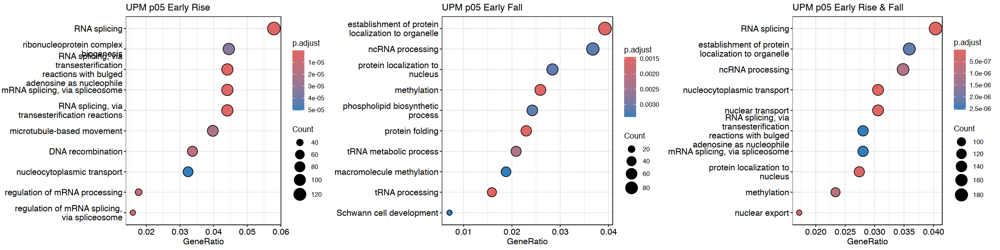

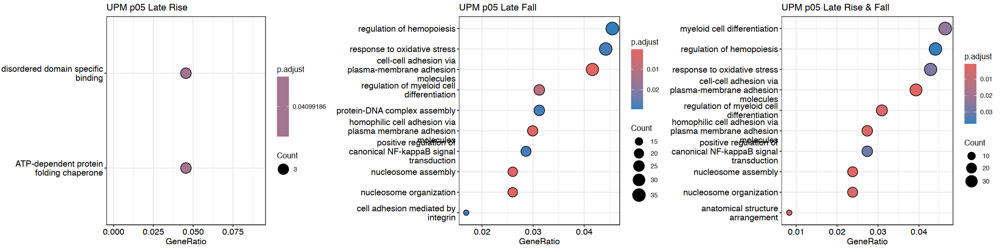

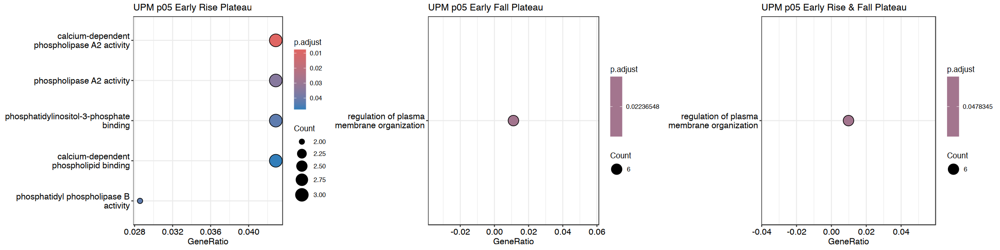

In [48]:
options(repr.plot.height=5, repr.plot.width=20)
pert="UPM p05"
p1 <- dotplot(go_early_rise, showCategory = 10, title=paste(pert,  "Early Rise"))
p2 <- dotplot(go_early_fall, showCategory = 10, title=paste(pert,  "Early Fall"))
p3 <- dotplot(go_early_both, showCategory = 10, title=paste(pert,  "Early Rise & Fall"))
grid.arrange(p1, p2, p3, ncol = 3)
# options(repr.plot.height=5, repr.plot.width=20)
p1 <- dotplot(go_late_up, showCategory = 10, title=paste(pert,  "Late Rise"))
p2 <- dotplot(go_late_down, showCategory = 10, title=paste(pert,  "Late Fall"))
p3 <- dotplot(go_late_both, showCategory = 10, title=paste(pert,  "Late Rise & Fall"))
grid.arrange(p1, p2, p3, ncol = 3)
options(repr.plot.height=5, repr.plot.width=20)
p1 <- dotplot(go_early_plat_up, showCategory = 10, title=paste(pert,  "Early Rise Plateau"))
p2 <- dotplot(go_early_plat_down, showCategory = 10, title=paste(pert,  "Early Fall Plateau"))
p3 <- dotplot(go_early_plat_both, showCategory = 10, title=paste(pert,  "Early Rise & Fall Plateau"))
grid.arrange(p1, p2, p3, ncol = 3)

In [164]:
pert="UPM"
write.table(go_early_rise, paste0("../results/GO/GO_EarlyRise", pert, "_DESeq2_GeneHK.txt"), 
           sep="\t", quote=FALSE)
write.table(go_early_fall, paste0("../results/GO/GO_EarlyFall", pert, "_DESeq2_GeneHK.txt"),, 
           sep="\t", quote=FALSE)
write.table(go_late_up, paste0("../results/GO/GO_LateRise", pert, "_DESeq2_GeneHK.txt"), 
           sep="\t", quote=FALSE)
write.table(go_late_down, paste0("../results/GO/GO_LateFall", pert, "_DESeq2_GeneHK.txt"),, 
           sep="\t", quote=FALSE)
write.table(go_early_plat_up, paste0("../results/GO/GO_EarlyRisePlat", pert, "_DESeq2_GeneHK.txt"), 
           sep="\t", quote=FALSE)
write.table(go_early_plat_down, paste0("../results/GO/GO_EarlyFallPlat", pert, "_DESeq2_GeneHK.txt"),, 
           sep="\t", quote=FALSE)

In [50]:
saveRDS(All_Sig_genes, paste0(results_dir, "UPM_siggenes_DESeq2_GeneHK.rds"))
saveRDS(All_Sig_nontss, paste0(results_dir, "UPM_signontss_DESeq2_GeneHK.rds"))

## Clean visualization of Results

In [165]:
pert="UPM"
go_early_rise <- fread(paste0("../results/GO/GO_EarlyRise", pert, "_DESeq2_GeneHK.txt"))
go_early_fall <- fread(paste0("../results/GO/GO_EarlyFall", pert, "_DESeq2_GeneHK.txt"))
go_late_rise <- fread(paste0("../results/GO/GO_LateRise", pert, "_DESeq2_GeneHK.txt"))
go_late_fall <- fread(paste0("../results/GO/GO_LateFall", pert, "_DESeq2_GeneHK.txt"))
go_early_risep <- fread(paste0("../results/GO/GO_EarlyRisePlatUPM_DESeq2_GeneHK.txt"))
go_early_fallp <- fread(paste0("../results/GO/GO_EarlyFallPlatUPM_DESeq2_GeneHK.txt"))

Warning message in fread(paste0("../results/GO/GO_EarlyRise", pert, "_DESeq2_GeneHK.txt")):
“Detected 13 column names but the data has 14 columns (i.e. invalid file). Added 1 extra default column name for the first column which is guessed to be row names or an index. Use setnames() afterwards if this guess is not correct, or fix the file write command that created the file to create a valid file.”
Warning message in fread(paste0("../results/GO/GO_EarlyFall", pert, "_DESeq2_GeneHK.txt")):
“Detected 13 column names but the data has 14 columns (i.e. invalid file). Added 1 extra default column name for the first column which is guessed to be row names or an index. Use setnames() afterwards if this guess is not correct, or fix the file write command that created the file to create a valid file.”
Warning message in fread(paste0("../results/GO/GO_LateRise", pert, "_DESeq2_GeneHK.txt")):
“Detected 13 column names but the data has 14 columns (i.e. invalid file). Added 1 extra default column nam

### Ones with single genes or processes 

#### Notes on below:
* Early Plateau Rise:
    *  [Mainstream and sidestream cigarette smoke exposure increases Ca2+-dependent phospholipid binding proteins in guinea pig alveolar type II cells](https://link.springer.com/article/10.1023/A:1014468521403)
        *  PLBP has maybe mediator for intracellular surfactant assembly and delivery to the plasma membrane of type II cells for secretion into alveolar space.
        *  CSE --> decrease in surfactant activity in bronchial washing
        *  They say CSE causes desensitation of B-adrenoreceptors AND increase in PLBP but don't know how.
        *  Genes of interest: PLA2G4A, PLA2G4B, PLA2G4E

In [166]:
unique(go_early_fallp$Count)
go_late_rise

go_early_risep # 

go_early_fallp # regulation of plasma membrane organization

[1] 6

V1,ONTOLOGY,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>
GO:0097718,MF,GO:0097718,disordered domain specific binding,3/66,32/18522,0.09375,26.30966,8.568962,0.0001990712,0.04099186,0.03803685,HSP90AA1/BCL2L2/HSPA1A,3
GO:0140662,MF,GO:0140662,ATP-dependent protein folding chaperone,3/66,40/18522,0.07500,21.04773,7.590249,0.0003885484,0.04099186,0.03803685,HSPA5/HSP90AA1/HSPA1A,3


V1,ONTOLOGY,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>
GO:0047498,MF,GO:0047498,calcium-dependent phospholipase A2 activity,3/70,17/18522,0.17647059,46.69412,11.609131,3.384279e-05,0.007614628,0.006590438,PLA2G4A/PLA2G4B/PLA2G4E,3
GO:0004623,MF,GO:0004623,phospholipase A2 activity,3/70,35/18522,0.08571429,22.68000,7.907143,3.102368e-04,0.034901642,0.030207269,PLA2G4A/PLA2G4B/PLA2G4E,3
GO:0032266,MF,GO:0032266,phosphatidylinositol-3-phosphate binding,3/70,45/18522,0.06666667,17.64000,6.883406,6.546762e-04,0.042609941,0.036878779,PLA2G4A/ZFYVE28/PLA2G4E,3
GO:0102545,MF,GO:0102545,phosphatidyl phospholipase B activity,2/70,11/18522,0.18181818,48.10909,9.625995,7.575101e-04,0.042609941,0.036878779,PLA2G4A/PLA2G4B,2
GO:0005544,MF,GO:0005544,calcium-dependent phospholipid binding,3/70,53/18522,0.05660377,14.97736,6.276259,1.057701e-03,0.047596541,0.041194667,PLA2G4A/PLA2G4B/PLA2G4E,3


V1,ONTOLOGY,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>
GO:1903729,BP,GO:1903729,regulation of plasma membrane organization,6/540,17/18888,0.3529412,12.3451,8.02822,5.024821e-06,0.02236548,0.02061234,ASAP1/ANXA2/SH3GLB1/NOX5/SYTL4/RAB3A,6


## Ones with substantial linkages

In [168]:
# go_late_rise[grepl("methylation|Prp19|3'-end processing|Sm-like|splic|RNA processing|mRNA catabolic|transcription|transferase|mediator|snRN|helicase|nuclear speck|acting on RNA|ribosom|binding|RNA polymerase|translation|tRNA|rRNA", go_late_rise$Description),]$Group <- "Transcription/RNA processing/Translation"
# go_late_rise[grepl("RNA export from nucleus|protein localization|Golgi|RNA localization|RNA transport|export|transport", go_late_rise$Description),]$Group <- "RNA/Protein Localization"
# go_late_rise[grepl("preinitiation|ribonucleoprotein|protein-RNA", go_late_rise$Description),]$Group <- "Protein-RNA complexes"
# go_late_rise[grepl("ubiquitin|modification-dependent|rotein target|RNA binding|peptidase|protein catabolic|proteasome|protein modification|protein stabili|ERAD|response to topologically", go_late_rise$Description),]$Group <- "Protein Degradation"
# go_late_rise[grepl("macroautophagy|autophag|maintenance of cell number|stem cell population maintenance", go_late_rise$Description),]$Group <- "Macroauthophagy"
# go_late_rise[grepl("vacuo|vesicle|lysosomal|vesicle organization|endosom", go_late_rise$Description),]$Group <- "Vacuolar|Lysosomal Transport"
# go_late_rise[grepl("ATPase|respiration|proton motive|electron transfer|NAD(P)H|NADH|oxidative phosphorylation|mitochondri", go_late_rise$Description),]$Group <- "Mitochondrial gene expression & Respiration"
# go_late_rise[grepl("cili|axoneme|plasma membrane bounded cell projection", go_late_rise$Description),]$Group <- "Cilia"
# go_late_rise[grepl("viral", go_late_rise$Description),]$Group <- "Viral expression & process"
# go_late_rise[grepl("repair|ligase|DNA damage|damaged DNA|activity, acting on DNA|double-strand break", go_late_rise$Description),]$Group <- "DNA repair"
# go_late_rise[grepl("organelle", go_late_rise$Description),]$Group <- "Organelle (dis)assembly"
# go_late_rise[grepl("stress", go_late_rise$Description),]$Group <- "stress response"
# go_late_rise[grepl("TORC1", go_late_rise$Description),]$Group <- "TORC1 signaling"
# go_late_rise[grepl("cell cycle| checkpoint|cyclin-dependent", go_late_rise$Description),]$Group <- "Cell Cycle Regulation"

In [81]:
go_early_rise[1:2,]

V1,ONTOLOGY,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count,Group,Max_call
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<chr>,<dbl>
GO:0008380,BP,GO:0008380,RNA splicing,134/2313,484/18888,0.2768595,2.260840,10.49709,1.344111e-20,7.920847e-17,7.478917e-17,BCAS2/RBM23/NRDE2/SRPK2/RBM39/YJU2/TMBIM6/CCNL1/HNRNPC/YTHDC1/RTCB/RBM3/FAM98B/RBM4/CIR1/SLC38A2/LARP7/METTL16/SMU1/NUP98/RSRC1/WBP4/WBP11/SYNCRIP/KHDRBS3/SREK1/SRSF6/EIF1/HNRNPA3/CWC25/THOC6/FUS/HNRNPL/SNIP1/PRPF38A/SF3A1/PABPC1/IK/PPP2R1A/UPF1/HNRNPA1L2/SF3B1/SNRNP35/TARDBP/SON/NCL/PPP2CA/SART3/RNU5D-1/RBFOX2/RNPC3/KHDC4/EFTUD2/TRA2A/SNRPE/SNRPA1/SCAF11/RNVU1-4/RBMXL1/HNRNPA1/SRSF5/PTBP1/PUF60/WTAP/TAF5L/CWF19L2/ZRANB2/BUD31/SMN1/RNU5F-1/AAR2/TRA2B/RBM6/USP49/SRSF4/PSIP1/RNVU1-3/SUPT6H/XAB2/LSM3/PRPF6/DHX9/SNRPD1/ZCCHC8/SAP18/HNRNPH2/ECD/SFSWAP/RNU5E-1/CDK12/PPIL2/DDX17/ZPR1/SREK1IP1/TGS1/LUC7L3/RBM4B/CELF4/SFPQ/RBM25/MAGOH/SNRPC/CDC5L/METTL14/COIL/AQR/RBFOX3/VIRMA/SART1/PRPF38B/RBM12/U2AF1/RBM48/LUC7L/SMN2/DHX15/SNRPF/HNRNPH1/SRSF10/SNRPB2/RPUSD4/HNRNPK/PPWD1/RBM19/CLASRP/RBM44/FMR1/CIRBP/SNRPG/SRSF11/RBM14/RNVU1-8/TRRAP/RRP1B,134,RNA splicing,-Inf
GO:0000377,BP,GO:0000377,"RNA splicing, via transesterification reactions with bulged adenosine as nucleophile",102/2313,337/18888,0.3026706,2.471614,10.18281,6.511200e-19,1.279017e-15,1.207656e-15,BCAS2/RBM23/SRPK2/RBM39/YJU2/HNRNPC/YTHDC1/RBM3/RBM4/LARP7/METTL16/SMU1/NUP98/RSRC1/WBP4/SYNCRIP/KHDRBS3/SRSF6/EIF1/HNRNPA3/CWC25/HNRNPL/SNIP1/PRPF38A/SF3A1/PABPC1/IK/UPF1/HNRNPA1L2/SF3B1/SNRNP35/SON/NCL/SART3/RNU5D-1/RBFOX2/RNPC3/KHDC4/EFTUD2/TRA2A/SNRPE/SNRPA1/SCAF11/RNVU1-4/RBMXL1/HNRNPA1/SRSF5/PTBP1/PUF60/WTAP/CWF19L2/BUD31/SMN1/RNU5F-1/AAR2/TRA2B/RBM6/USP49/SRSF4/PSIP1/RNVU1-3/XAB2/LSM3/PRPF6/DHX9/SNRPD1/ZCCHC8/SAP18/SFSWAP/RNU5E-1/DDX17/TGS1/LUC7L3/RBM4B/CELF4/SFPQ/RBM25/MAGOH/SNRPC/CDC5L/METTL14/COIL/AQR/RBFOX3/SART1/U2AF1/LUC7L/SMN2/DHX15/SNRPF/HNRNPH1/SRSF10/SNRPB2/HNRNPK/PPWD1/RBM19/RBM44/FMR1/CIRBP/SNRPG/RBM14/RNVU1-8,102,RNA splicing,-Inf


[1] 18

V1,ONTOLOGY,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count,Group
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<chr>
GO:0046982,MF,GO:0046982,protein heterodimerization activity,38/783,353/18522,0.10764873,2.546449,6.163197,1.299841e-07,5.550323e-05,5.550323e-05,H3-3A/H2BC8/H2BC12/H2BC10/IKBKG/TRMT112/CHRAC1/H4C6/H2AJ/H3C11/H3C10/CAV2/BHLHE41/H3C3/LSM5/H4C5/H2BC18/H4C8/ITGB1/KCNB1/H2BC6/H3C13/H2BC5/H4C16/SYT1/H4C2/TLR4/H2BC26/H3C12/H3C4/H2BC14/H2BC15/H3C6/KRT10/ZHX3/H2AC16/SLC3A2/ADRA2A,38,Other
GO:0006509,BP,GO:0006509,membrane protein ectodomain proteolysis,9/769,47/18888,0.19148936,4.703317,5.236793,9.944303e-05,4.139101e-02,4.013786e-02,BACE2/SNX9/SH3D19/PTPN3/SPPL2A/TIMP4/ADAM17/MMP7/ADRA2A,9,Other
GO:1903706,BP,GO:1903706,regulation of hemopoiesis,35/769,424/18888,0.08254717,2.027504,4.408403,6.307300e-05,2.954970e-02,2.865506e-02,TMEM131L/KLF10/BRD2/FOXO3/H4C6/CASP8/FOS/CD83/TNFSF11/LIF/H4C5/H4C8/CD46/SLC9B2/MYB/IL7/CTNNBIP1/H4C16/ANKRD54/H4C2/QKI/RAG2/TLR4/ZFP36/ZFP36L2/MITF/ING5/IL7R/JAG1/IL15/CDC73/IL4R/TLR3/TRAF6/ACVR2A,35,Other


Warning message:
“Cannot compute density for groups with fewer than two datapoints.”


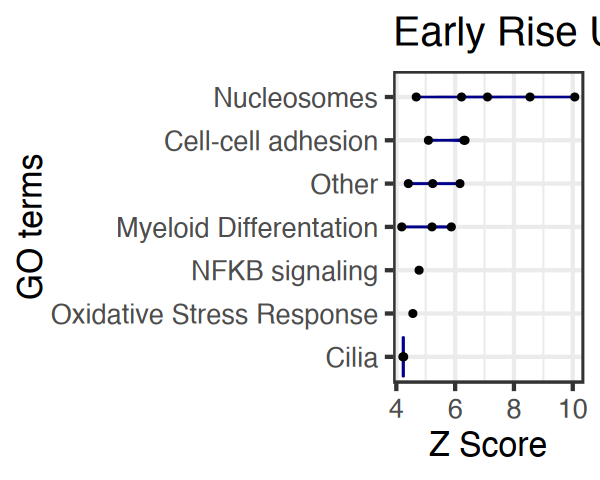

In [181]:
#go_early_risep$Description
using = go_late_fall
length(unique(using$Description))
using$Group <- "Other"
using[grepl("NF-kappaB", using$Description),]$Group <- "NFKB signaling"
using[grepl("nucleosome|chromatin|protein-DNA", using$Description),]$Group <- "Nucleosomes"
using[grepl("adhesion", using$Description),]$Group <- "Cell-cell adhesion"
using[grepl("cilia|axoneme", using$Description),]$Group <- "Cilia"
using[grepl("myeloid|differentiation", using$Description),]$Group <- "Myeloid Differentation"
using[grepl("oxidative", using$Description),]$Group <- "Oxidative Stress Response"
testing = using[using$Group == "Other",]
testing[order(-testing$zScore),]
using$Max_call <- 0
for (group in unique(using$Group)) {
    filt = using[using$Group == group,]
    max_call = max(filt$zScore)
    using[using$Group == group,]$Max_call = max_call
    }
go_early_rise = using
pER <- ggplot(go_early_rise, aes(x=zScore, y=reorder(Group, Max_call))) + geom_violin(color = "darkblue", drop=FALSE) + geom_point(color = "black") + theme_bw(base_size=20) + 
labs(y="GO terms", x="Z Score") + ggtitle("Early Rise UPM")
pER

[1] 181

V1,ONTOLOGY,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count,Group
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<chr>
GO:0001833,BP,GO:0001833,inner cell mass cell proliferation,8/2313,14/18888,0.5714286,4.666296,5.126278,7.563430e-05,0.009483254,0.0089541523,NDEL1/BRCA2/GINS4/CHEK1/ZPR1/TAF8/SBDS/NCAPG2,8,Other
GO:0099568,CC,GO:0099568,cytoplasmic region,63/2400,298/19894,0.2114094,1.752408,4.847177,5.520419e-06,0.000362506,0.0002931955,TTLL3/CLASP2/BBOF1/CFAP251/AGTPBP1/PAFAH1B1/CLASP1/SPAG6/ARL8B/DNAH10/BAIAP2/EIF4EBP2/CLTB/TRAF3IP1/RAB21/CFAP74/AP3B1/ARFGEF2/CFAP100/ATG14/CFAP77/AKAP14/OPA1/KIFAP3/IFT140/NDEL1/ROPN1L/AP3S2/BLOC1S6/RSPH9/DNAI2/KIF19/MAP4/KIF4A/DYNC2I2/GRIK2/GRIK3/AMBRA1/PIERCE2/BLOC1S2/CFAP73/CCDC40/PIERCE1/DRC3/AP3M1/ARL6/TEKTIP1/RSPH6A/DNAH1/DLG4/FBXW11/DCDC2/DNAL1/ODAD4/TTLL8/TRIM46/DNAH8/PRKCZ/FMR1/CTNND1/RIMS1/KIF5C/AP3M2,63,Other
GO:0051054,BP,GO:0051054,positive regulation of DNA metabolic process,63/2313,301/18888,0.2093023,1.709167,4.633076,1.234941e-05,0.002205305,0.0020822642,GRHL2/KAT7/SMARCA2/FAM168A/UBE2B/GCH1/ATM/EREG/CDC42/SIRT1/IL6/USP9X/WEE1/FUS/PARN/KAT5/ERCC6/MCRS1/BRCA1/INO80C/RFC3/DBF4/BCL7B/SLF1/MAP2K7/ERCC1/ARID2/HNRNPA1/PARM1/SMARCB1/RGCC/WDR48/MORF4L1/SMARCE1/DNA2/HNRNPD/ANKRD31/HMGB1/DHX9/SETMAR/WRN/KLF4/TNKS2/SHLD1/MRE11/EYA2/CCT4/UBE2V2/XRCC1/SMCHD1/PMS2/E2F8/RFC5/HMBOX1/SMARCA5/CEBPG/RNF168/YEATS4/EP400/TP53BP1/RAD51AP1/MLH1/TRRAP,63,Other
GO:0016887,MF,GO:0016887,ATP hydrolysis activity,84/2375,417/18522,0.2014388,1.570969,4.522713,1.432163e-05,0.004174755,0.0040100558,KIF13A/NLRP1/ATP2A2/YME1L1/ATAD2/FIGN/NUBP1/NSF/SHOC1/VPS4B/MORC3/AFG3L2/DNAH10/SMC4/BTAF1/KIF18A/CLPB/KIF13B/AFG1L/KATNAL2/ATAD2B/ATP8B4/ERCC6/UPF1/HSPA9/RECQL5/DHX37/ABCA6/ABCF1/RFC3/MDN1/ATP10D/PSMC1/MCM8/SUPV3L1/DDX25/HSPA14/CCT6B/SMC1A/DDX54/DHX40/SMARCAD1/ABCA9/DDX10/MYO19/MCM4/RIGI/KIF19/DNA2/ATP2B3/ABCB9/MCM3/ATP8B3/TRIP13/DHX9/ABCC2/ATP2A1/WRN/ORC1/DDX17/BLM/MCM6/DDX52/CCT4/DHX57/RAD51D/AQR/ABCB8/SMCHD1/ATP13A5/DHX15/PMS2/RFC1/KIF25/ABCA7/RECQL4/RFC5/SMARCA5/DNAH8/KIF14/ATP8A2/KIF7/MLH1/KIF5C,84,Other
GO:0043153,BP,GO:0043153,entrainment of circadian clock by photoperiod,10/2313,25/18888,0.4000000,3.266407,4.235894,4.238322e-04,0.031220538,0.0294786438,PER1/RBM4/FBXL3/CRY1/CRY2/CRTC1/PER3/RBM4B/ID2/USP2,10,Other
GO:0032392,BP,GO:0032392,DNA geometric change,23/2313,85/18888,0.2705882,2.209628,4.175326,1.646819e-04,0.016448655,0.0155309312,HMGB3/MNAT1/UPF1/RECQL5/RFC3/MCM8/SUPV3L1/ZGRF1/GINS4/SUB1/MCM4/DNA2/MCM3/HMGB1/DHX9/WRN/MRE11/BLM/MCM6/MTERF1/RECQL4/RFC5/DTD1,23,Other
GO:0009649,BP,GO:0009649,entrainment of circadian clock,11/2313,30/18888,0.3666667,2.994207,4.083434,5.329146e-04,0.035286132,0.0333174048,PER1/GNAQ/RBM4/FBXL3/CRY1/CRY2/CRTC1/PER3/RBM4B/ID2/USP2,11,Other
GO:0071103,BP,GO:0071103,DNA conformation change,24/2313,92/18888,0.2608696,2.130266,4.059609,2.210027e-04,0.020263191,0.0191326426,HMGB3/MNAT1/UPF1/RECQL5/RFC3/MCM8/SUPV3L1/ZGRF1/GINS4/TOP1/SUB1/MCM4/DNA2/MCM3/HMGB1/DHX9/WRN/MRE11/BLM/MCM6/MTERF1/RECQL4/RFC5/DTD1,24,Other
GO:0051236,BP,GO:0051236,establishment of RNA localization,37/2313,164/18888,0.2256098,1.842333,4.047149,1.521121e-04,0.015519886,0.0146539817,NUP88/NRDE2/ATM/NUP214/YTHDC1/SENP2/NUP133/CHTOP/IGF2BP3/NUP98/ZC3H11A/THOC6/FLOT1/NUP160/PNPT1/RAE1/POLDIP3/UPF1/HNRNPA1L2/DDX25/SEC13/AGFG1/HNRNPA1/SUPT6H/DHX9/NUP42/SEH1L/GLE1/PHAX/NXT2/MAGOH/TOMM20L/NXF2/NXF2B/FMR1/RANBP2/KIF5C,37,Other


Warning message:
“Cannot compute density for groups with fewer than two datapoints.”


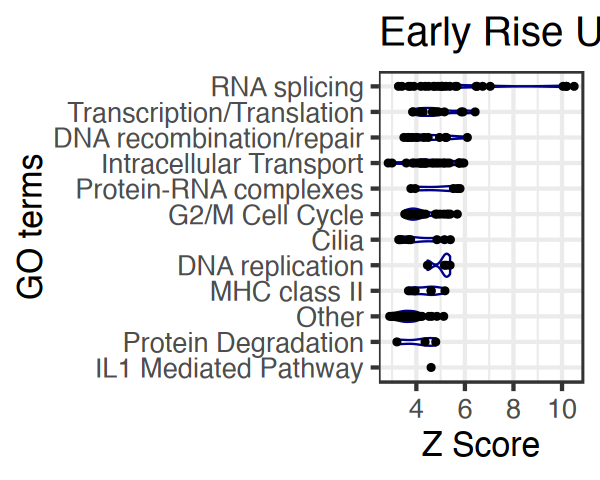

In [169]:
#go_early_risep$Description
using = go_early_rise
length(unique(using$Description))
using$Group <- "Other"
using[grepl("methylation|Prp19|3'-end processing|Sm-like|splic|RNA processing|mRNA catabolicsnRN|snRNP|helicase|nuclear speck", using$Description),]$Group <- "RNA splicing"
using[grepl("CRD-mediated|nucleus localization|ribosom|binding|chromosom|RNA polymerase|translation|tRNA|rRNA", using$Description),]$Group <- "Transcription/Translation"
using[grepl("preinitiation|ribonucleoprotein|protein-RNA", using$Description),]$Group <- "Protein-RNA complexes"
using[grepl("DNA replication|replication fork", using$Description),]$Group <- "DNA replication"
using[grepl("kinetochore|centriole|centromer|G2/M|cell cycle|mitotic|segregation|chromosome localization|microtubule", using$Description),]$Group <- "G2/M Cell Cycle"
using[grepl("cili|axoneme|plasma membrane bounded cell projection", using$Description),]$Group <- "Cilia"
using[grepl("DNA recombination|recombinational|double-strand|DNA damage| DNA repair", using$Description),]$Group <- "DNA recombination/repair"
using[grepl("MHC class II|MHC protein", using$Description),]$Group <- "MHC class II"
using[grepl("interleukin-1", using$Description),]$Group <- "IL1 Mediated Pathway"
using[grepl("ubiquitin|protein destabilization", using$Description),]$Group <- "Protein Degradation"
using[grepl("nuclear export|RNA export|establishment of organelle localization|Golgi|vesicle|nuclear membrane|nucleocytoplasmic transport|microtubule-based|nuclear envelope|COPII-coated|nuclear transport|AP-3|transport along microtubule|intracellular transport", using$Description),]$Group <- "Intracellular Transport"
testing = using[using$Group == "Other",]
testing[order(-testing$zScore),]
using$Max_call <- 0
for (group in unique(using$Group)) {
    filt = using[using$Group == group,]
    max_call = max(filt$zScore)
    using[using$Group == group,]$Max_call = max_call
    }
go_early_rise = using
pER <- ggplot(go_early_rise, aes(x=zScore, y=reorder(Group, Max_call))) + geom_violin(color = "darkblue", drop=FALSE) + geom_point(color = "black") + theme_bw(base_size=20) + 
labs(y="GO terms", x="Z Score") + ggtitle("Early Rise UPM")
pER

[1] 165

V1,ONTOLOGY,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count,Group
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<chr>
GO:0008276,MF,GO:0008276,protein methyltransferase activity,34/2474,97/18522,0.3505155,2.624191,6.297102,4.587633e-08,0.0000197256,1.834731e-05,SETD3/DPH5/KMT2A/PRMT8/SETD1B/WDR5/KMT2D/PCMT1/CARM1/EZH1/KMT5A/EHMT2/LCMT1/FBL/FAM98A/KMT2B/DOT1L/NSD3/FAM86B1/SUZ12/PRMT5/EZH2/CSKMT/METTL13/METTL22/EEF2KMT/NSD2/PRMT3/HEMK1/PRMT9/PCMTD2/N6AMT1/SETDB2/SETD7,34,Other
GO:0140142,MF,GO:0140142,nucleocytoplasmic carrier activity,15/2474,32/18522,0.4687500,3.509372,5.578190,4.412910e-06,0.0007312822,6.801854e-04,XPO5/KPNB1/XPO7/SNUPN/EIF4ENIF1/IPO5/CSE1L/HIKESHI/TMCO6/XPO1/IPO9/TNPO2/TNPO3/NUTF2/KPNA2,15,Other
GO:0008033,BP,GO:0008033,tRNA processing,38/2395,134/18888,0.2835821,2.236450,5.473518,9.825460e-07,0.0014517117,1.368066e-03,TRMT1L/DALRD3/POP1/MTFMT/TSEN2/METTL2B/FAM98A/ELP2/TRMT10B/BCDIN3D/AKT1/GTPBP3/TRIT1/TSEN34/TRMT13/CTU1/TRMU/ELAC2/TSEN54/SARS1/RPP30/TRMT5/METTL6/MTO1/PUS1/PUSL1/SSB/LAGE3/METTL2A/ADAT1/RTRAF/PUS3/TYW5/URM1/PTCD1/DUS1L/POP5/DUS2,38,Other
GO:0016853,MF,GO:0016853,isomerase activity,45/2474,161/18522,0.2795031,2.092545,5.466706,7.228764e-07,0.0002096342,1.949864e-04,MPI/PPIC/FBH1/PGAM1/TPI1/DHRS9/FKBP4/TOP3A/DDTL/RPUSD3/GLCE/THAP4/CYP2S1/P4HB/KATNA1/PTPA/QSOX1/SPAST/HSPD1/PDIA5/FKBP2/PMM1/FKBP1B/PPID/FKBP8/DDT/KATNAL1/RPUSD1/FKBP15/MRI1/PUS1/ECI2/PUSL1/RPE/PDIA6/PPIL3/PIN1/PUS3/PPIB/TXNDC5/TOP1MT/TWNK/NAXE/CRELD1/GFUS,45,Other
GO:0014044,BP,GO:0014044,Schwann cell development,17/2395,42/18888,0.4047619,3.192126,5.419573,5.873932e-06,0.0034065386,3.210258e-03,PPP3R1/GRB2/MAPK1/SKI/MAPK3/AKT1/RAF1/ERBB2/MAP2K2/ILK/PRX/HRAS/AKT2/ITGB4/POU3F1/LAMB2/SIRT2,17,Other
GO:0032259,BP,GO:0032259,methylation,62/2395,262/18888,0.2366412,1.866254,5.380477,6.527616e-07,0.0014517117,1.368066e-03,SETD3/TRMT1L/DPH5/KMT2A/ARID4A/PRMT8/DALRD3/SETD1B/KMT2D/MTRR/SMYD4/MTA2/GATAD2A/PCMT1/METTL2B/EZH1/KMT5A/EHMT2/MPHOSPH8/LCMT1/FBL/FAM98A/MBD3/TRMT10B/COMTD1/KMT2B/BCDIN3D/AKT1/EEF1AKMT4-ECE2/NSD3/GTPBP3/FAM86B1/METTL3/TRMT13/FTSJ3/CARNMT1/PRMT5/EMG1/MAPT-AS1/EZH2/CSKMT/METTL13/METTL22/TRMT5/METTL6/MTO1/RAB6A/EEF2KMT/COQ5/METTL5/NSD2/PRMT3/METTL2A/FAM86C2P/BEND3/HEMK1/PRMT9/SPOCD1/SNRPD2/N6AMT1/SETDB2/SETD7,62,Other
GO:0006457,BP,GO:0006457,protein folding,55/2395,225/18888,0.2444444,1.927794,5.335026,9.329779e-07,0.0014517117,1.368066e-03,PPIC/HSPH1/CCT3/MKKS/FKBP4/P3H1/CDC37/MOGS/BAG4/HSP90B1/DNAJA3/ST13/DNAJB14/LMAN2L/CHCHD4/CLPX/AHSA1/HSPA8/P4HB/QSOX1/ARL2/TBCB/DNAJA2/HSPD1/DNAJC4/RP2/PDIA5/CSNK2A1/NUDCD3/FKBP2/LTBP4/NUDCD2/CHORDC1/FKBP1B/PPID/TCP1/DNAJC25/FKBP8/TOR1B/CANX/MESD/GRN/CDC37L1/TOR1A/CCT5/PDIA6/HSPA4/UGGT1/PDRG1/PPIL3/PPIB/TXNDC5/TRAP1/GRPEL1/HSPA1B,55,Other
GO:0016581,CC,GO:0016581,NuRD complex,9/2513,16/19894,0.5625000,4.452994,5.253860,3.999868e-05,0.0023599219,2.017477e-03,CHD4/HDAC2/MTA2/GATAD2A/MTA1/MBD3/CDK2AP1/GATAD2B/HDAC1,9,Other
GO:0090545,CC,GO:0090545,CHD-type complex,9/2513,16/19894,0.5625000,4.452994,5.253860,3.999868e-05,0.0023599219,2.017477e-03,CHD4/HDAC2/MTA2/GATAD2A/MTA1/MBD3/CDK2AP1/GATAD2B/HDAC1,9,Other


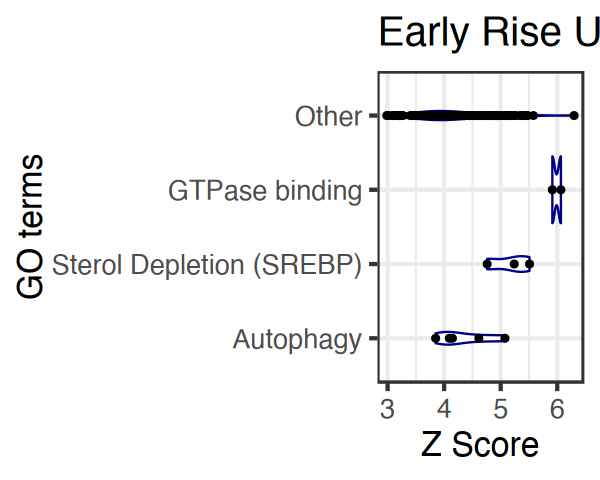

In [174]:
#go_early_risep$Description
using = go_early_fall
length(unique(using$Description))
using$Group <- "Other"
using[grepl("GTPase binding", using$Description),]$Group <- "GTPase binding"
using[grepl("SREBP|sterol", using$Description),]$Group <- "Sterol Depletion (SREBP)"
using[grepl("autophagy", using$Description),]$Group <- "Autophagy"
testing = using[using$Group == "Other",]
testing[order(-testing$zScore),]
using$Max_call <- 0
for (group in unique(using$Group)) {
    filt = using[using$Group == group,]
    max_call = max(filt$zScore)
    using[using$Group == group,]$Max_call = max_call
    }
go_early_rise = using
pER <- ggplot(go_early_rise, aes(x=zScore, y=reorder(Group, Max_call))) + geom_violin(color = "darkblue", drop=FALSE) + geom_point(color = "black") + theme_bw(base_size=20) + 
labs(y="GO terms", x="Z Score") + ggtitle("Early Rise UPM")
pER

## Lower pvalue cutoff

[1] "UPM30 vs Veh"

out of 20770 with nonzero total read count
adjusted p-value < 0.001
LFC > 0 (up)       : 3448, 17%
LFC < 0 (down)     : 3699, 18%
outliers [1]       : 0, 0%
low counts [2]     : 1611, 7.8%
(mean count < 26)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



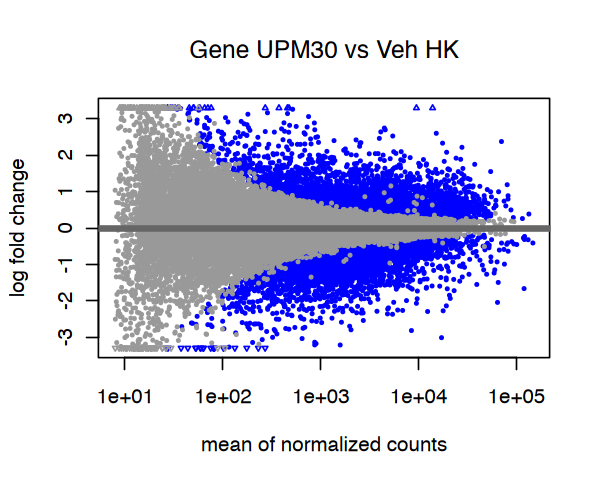

[1] 3448

[1] 3699

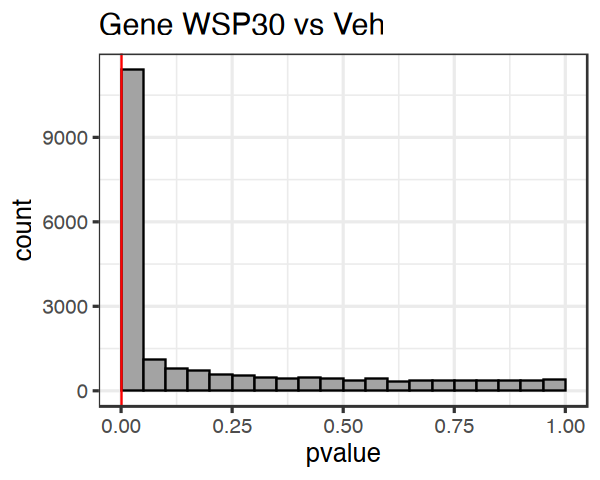

[1] "UPM120 vs Veh"

out of 20770 with nonzero total read count
adjusted p-value < 0.001
LFC > 0 (up)       : 181, 0.87%
LFC < 0 (down)     : 2344, 11%
outliers [1]       : 0, 0%
low counts [2]     : 5638, 27%
(mean count < 159)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



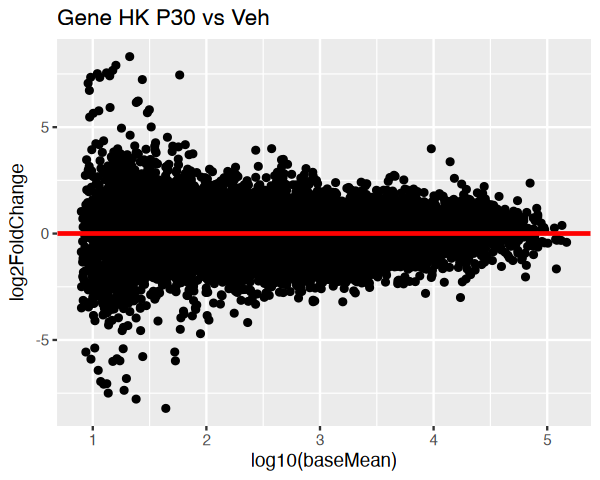

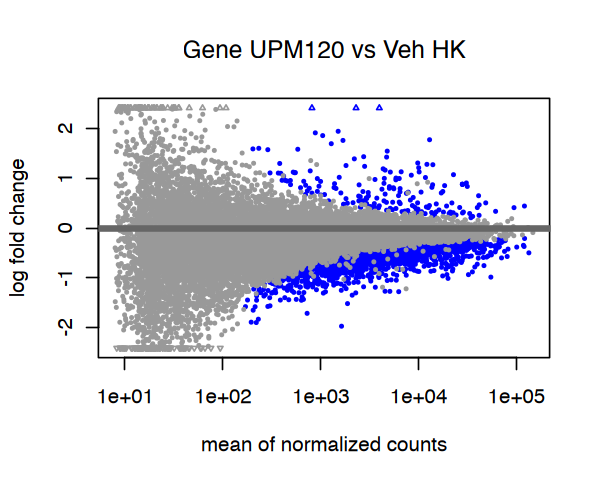

[1] 181

[1] 2344

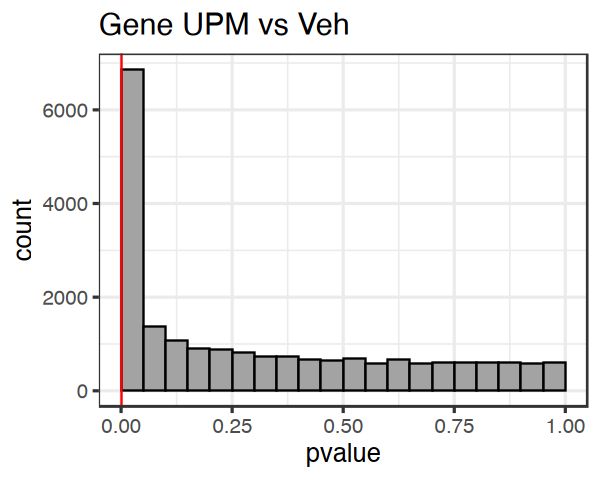

[1] "UPM120 vs UPM30"

out of 20770 with nonzero total read count
adjusted p-value < 0.001
LFC > 0 (up)       : 2641, 13%
LFC < 0 (down)     : 5101, 25%
outliers [1]       : 0, 0%
low counts [2]     : 1208, 5.8%
(mean count < 21)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



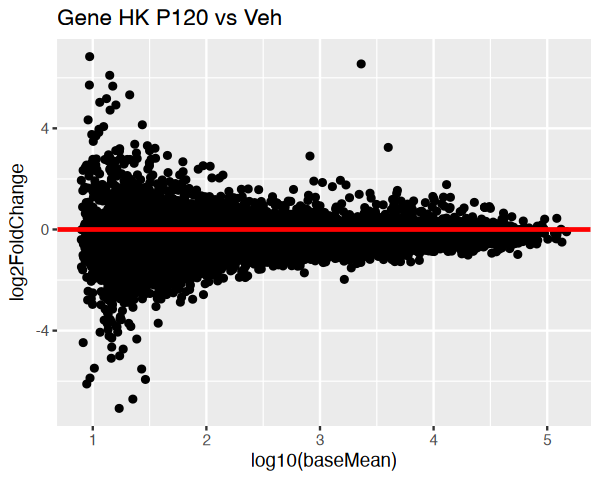

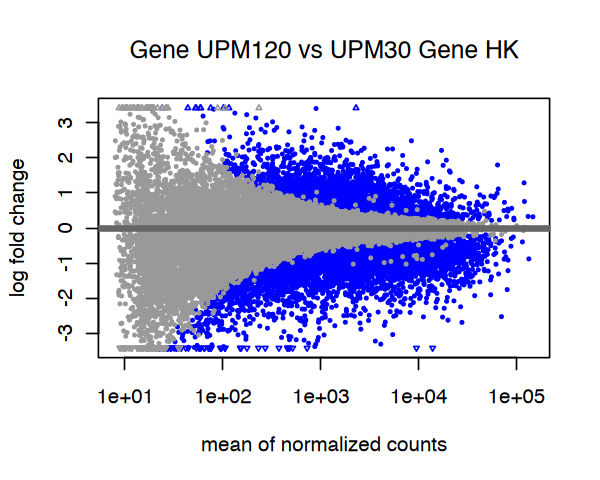

[1] 2641

[1] 5101

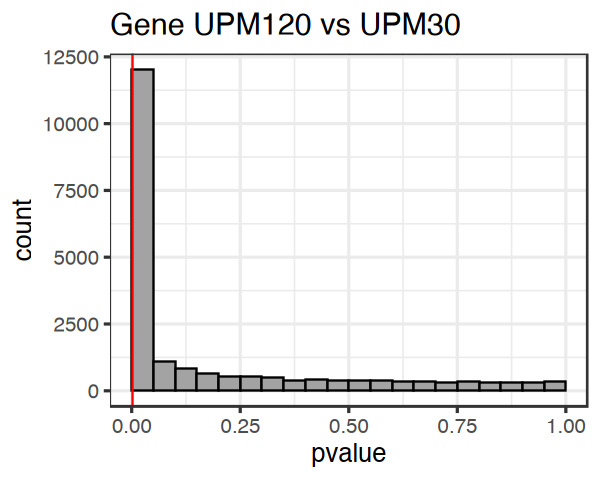

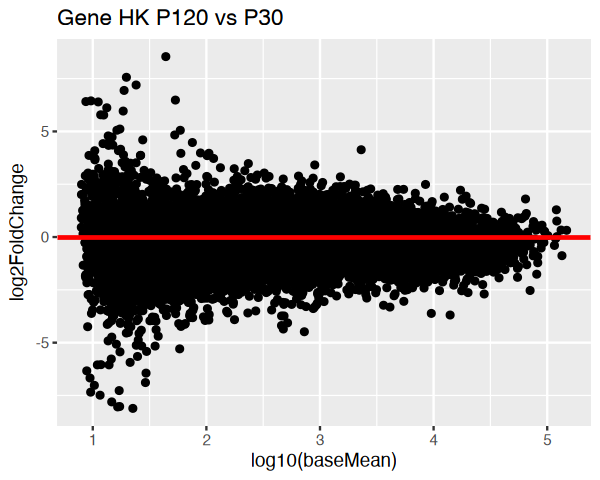

In [142]:
# Gene Results
padj_threshold=0.001
print("UPM30 vs Veh")
options(repr.plot.height=4, repr.plot.width=5)
gene_res = results(dds_gene_filt, contrast= c("Treatment", "UPM30", "VEH"), alpha=padj_threshold)
gene_res <- gene_res[order(gene_res$pvalue),]
summary(gene_res)
plotMA(gene_res, main="Gene UPM30 vs Veh HK")
ggplot(data.frame(gene_res), aes(x=pvalue)) + geom_histogram(fill="grey64", binwidth=binwidth_use, color="black", boundary=0) + theme_bw(base_size=15) + 
       geom_vline(xintercept=padj_threshold, color="red") + ggtitle("Gene WSP30 vs Veh")
up_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange > 0), ])
down_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange < 0), ])
length(up_sig_genes); length(down_sig_genes)
Up_Sig_genes[["P30_vs_Veh"]] = up_sig_genes
All_Sig_genes[["P30_vs_Veh_up"]] = up_sig_genes
Down_Sig_genes[["P30_vs_Veh"]] = down_sig_genes
All_Sig_genes[["P30_vs_Veh_down"]] = down_sig_genes

testing = as.data.frame(gene_res)
ggplot(testing, aes(x=log10(baseMean), y=log2FoldChange)) + geom_point() + 
geom_hline(yintercept=0, color="red", size=1) + ggtitle("Gene HK P30 vs Veh")
write.table(gene_res, 
            paste0(results_dir, "res_Gene_UPM30_vs_Veh_par_rat_Wd_GeneHK_p01.txt"), 
            sep=",", quote=FALSE)

print("UPM120 vs Veh")
options(repr.plot.height=4, repr.plot.width=5)
gene_res = results(dds_gene_filt, contrast= c("Treatment", "UPM120", "VEH"), alpha=padj_threshold)
gene_res <- gene_res[order(gene_res$pvalue),]
summary(gene_res)
plotMA(gene_res, main="Gene UPM120 vs Veh HK")
ggplot(data.frame(gene_res), aes(x=pvalue)) + geom_histogram(fill="grey64", binwidth=binwidth_use, color="black", boundary=0) + theme_bw(base_size=15) + 
       geom_vline(xintercept=padj_threshold, color="red") + ggtitle("Gene UPM vs Veh")
up_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange > 0), ])
down_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange < 0), ])
length(up_sig_genes); length(down_sig_genes)
Up_Sig_genes[["P120_vs_Veh"]] = up_sig_genes
All_Sig_genes[["P120_vs_Veh_up"]] = up_sig_genes
Down_Sig_genes[["P120_vs_Veh"]] = down_sig_genes
All_Sig_genes[["P120_vs_Veh_down"]] = down_sig_genes

testing = as.data.frame(gene_res)
ggplot(testing, aes(x=log10(baseMean), y=log2FoldChange)) + geom_point() + 
geom_hline(yintercept=0, color="red", size=1) + ggtitle("Gene HK P120 vs Veh")
write.table(gene_res, 
            paste0(results_dir, "res_Gene_UPM120_vs_Veh_par_rat_Wd_GeneHK_p01.txt"), 
            sep=",", quote=FALSE)

print("UPM120 vs UPM30")
options(repr.plot.height=4, repr.plot.width=5)
gene_res = results(dds_gene_filt, contrast= c("Treatment", "UPM120", "UPM30"), alpha=padj_threshold)
gene_res <- gene_res[order(gene_res$pvalue),]
summary(gene_res)
plotMA(gene_res, main="Gene UPM120 vs UPM30 Gene HK")
ggplot(data.frame(gene_res), aes(x=pvalue)) + geom_histogram(fill="grey64", binwidth=binwidth_use, color="black", boundary=0) + theme_bw(base_size=15) + 
       geom_vline(xintercept=padj_threshold, color="red") + ggtitle("Gene UPM120 vs UPM30")
up_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange > 0), ])
down_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange < 0), ])
length(up_sig_genes); length(down_sig_genes)
Up_Sig_genes[["P120_vs_P30"]] = up_sig_genes
All_Sig_genes[["P120_vs_P30_up"]] = up_sig_genes
Down_Sig_genes[["P120_vs_P30"]] = down_sig_genes
All_Sig_genes[["P120_vs_P30_down"]] = down_sig_genes

testing = as.data.frame(gene_res)
ggplot(testing, aes(x=log10(baseMean), y=log2FoldChange)) + geom_point() + 
geom_hline(yintercept=0, color="red", size=1) + ggtitle("Gene HK P120 vs P30")
write.table(gene_res, 
            paste0(results_dir, "res_Gene_UPM120_vs_UPM30_par_rat_Wd_GeneHK_p01.txt"), 
            sep=",", quote=FALSE)

In [143]:
## EARLY and Temporary
early_rise_genes = setdiff(intersect(Up_Sig_genes[["P30_vs_Veh"]], Down_Sig_genes[["P120_vs_P30"]]), 
                           union(Up_Sig_genes[["P120_vs_Veh"]], Down_Sig_genes[["P120_vs_Veh"]]))
length(early_rise_genes)
go_early_rise = run_go_analysis(early_rise_genes)
early_fall_genes = setdiff(intersect(Down_Sig_genes[["P30_vs_Veh"]], Up_Sig_genes[["P120_vs_P30"]]), 
                           union(Up_Sig_genes[["P120_vs_Veh"]], Down_Sig_genes[["P120_vs_Veh"]]))
length(early_fall_genes)
go_early_fall = run_go_analysis(early_fall_genes)
go_early_both = run_go_analysis(union(early_rise_genes, early_fall_genes))

[1] 2448

[1] 2162

In [147]:
## Early and stays (plateaus)
early_plat_up = setdiff(intersect(Up_Sig_genes[["P120_vs_Veh"]], Up_Sig_genes[["P30_vs_Veh"]]), 
                    union(Up_Sig_genes[["P120_vs_P30"]], Down_Sig_genes[["P120_vs_P30"]]))
length(early_plat_up)
go_early_plat_up = run_go_analysis(early_plat_up)
early_plat_down = setdiff(intersect(Down_Sig_genes[["P120_vs_Veh"]], Down_Sig_genes[["P30_vs_Veh"]]), 
                    union(Up_Sig_genes[["P120_vs_P30"]], Down_Sig_genes[["P120_vs_P30"]]))
length(early_plat_down)
go_early_plat_down = run_go_analysis(early_plat_down)
go_early_plat_both = run_go_analysis(union(early_plat_up, early_plat_down))

[1] 47

[1] 445

In [146]:
go_early_plat_up$Description

[1] "glycerolipid catabolic process"                        
 [2] "glycerophospholipid catabolic process"                 
 [3] "calcium-dependent phospholipase A2 activity"           
 [4] "phospholipase A2 activity"                             
 [5] "phosphatidylinositol-3-phosphate binding"              
 [6] "phosphatidyl phospholipase B activity"                 
 [7] "calcium-dependent phospholipid binding"                
 [8] "phospholipase A1 activity"                             
 [9] "polypeptide N-acetylgalactosaminyltransferase activity"
[10] "phosphatidylinositol-5-phosphate binding"              
[11] "acetylcholine receptor activity"                       
[12] "lysophospholipase activity"                            
[13] "phosphatidylinositol-4-phosphate binding"              
[14] "phospholipase activity"

In [148]:
## LATE
late_up = setdiff(intersect(Up_Sig_genes[["P120_vs_Veh"]], Up_Sig_genes[["P120_vs_P30"]]), 
                    union(Up_Sig_genes[["P30_vs_Veh"]], Down_Sig_genes[["P30_vs_Veh"]]))
length(late_up)
go_late_up = run_go_analysis(late_up)
late_down = setdiff(intersect(Down_Sig_genes[["P120_vs_Veh"]], Down_Sig_genes[["P120_vs_P30"]]), 
                    union(Up_Sig_genes[["P30_vs_Veh"]], Down_Sig_genes[["P30_vs_Veh"]]))
length(late_down)
go_late_down = run_go_analysis(late_down)
go_late_both = run_go_analysis(union(late_up, late_down))

[1] 48

[1] 657

In [153]:
late_down = setdiff(intersect(Down_Sig_genes[["P120_vs_Veh"]], Down_Sig_genes[["P120_vs_P30"]]), 
                    union(Up_Sig_genes[["P30_vs_Veh"]], Down_Sig_genes[["P30_vs_Veh"]]))
length(late_down)
NFKB_genes = c("PLK2","LIMS1","BIRC3","IKBKG","TNFRSF10B","CASP8","CFLAR", 
               "ZDHHC13", "TNFSF11", "PPM1A", "S100A13", "BIRC2", "UBE2V1", "INAVA", "TLR4", "GPRC5B", 
               "BCL10", "TLR3", "LPAR1", "TRAF6", "TRIM22", "PIM2")
length(NFKB_genes)
length(intersect(late_down, NFKB_genes))
intersect(late_down, NFKB_genes)

[1] 657

[1] 22

[1] 9

[1] "PLK2"      "LIMS1"     "BIRC3"     "IKBKG"     "TNFRSF10B" "CASP8"    
[7] "ZDHHC13"   "TNFSF11"   "INAVA"

In [154]:
go_late_down$Description
go_late_up

[1] "cell-cell adhesion via plasma-membrane adhesion molecules"      
 [2] "homophilic cell adhesion via plasma membrane adhesion molecules"
 [3] "nucleosome assembly"                                            
 [4] "nucleosome organization"                                        
 [5] "cellular response to oxidative stress"                          
 [6] "innate immune response in mucosa"                               
 [7] "response to activity"                                           
 [8] "cellular response to chemical stress"                           
 [9] "nucleosome"                                                     
[10] "structural constituent of chromatin"                            
[11] "protein heterodimerization activity"                            
[12] "cadherin binding"

#
# over-representation test
#
#...@organism 	 Homo sapiens 
#...@ontology 	 GOALL 
#...@keytype 	 SYMBOL 
#...@gene 	 chr [1:48] "ROR1" "LINC00886" "PAPPA" "CLDN10" "TPCN1" "DAPK1" "MROH2A" ...
#...pvalues adjusted by 'BH' with cutoff <0.05 
#...0 enriched terms found
#...Citation
 T Wu, E Hu, S Xu, M Chen, P Guo, Z Dai, T Feng, L Zhou, W Tang, L Zhan, X Fu, S Liu, X Bo, and G Yu.
 clusterProfiler 4.0: A universal enrichment tool for interpreting omics data.
 The Innovation. 2021, 2(3):100141 


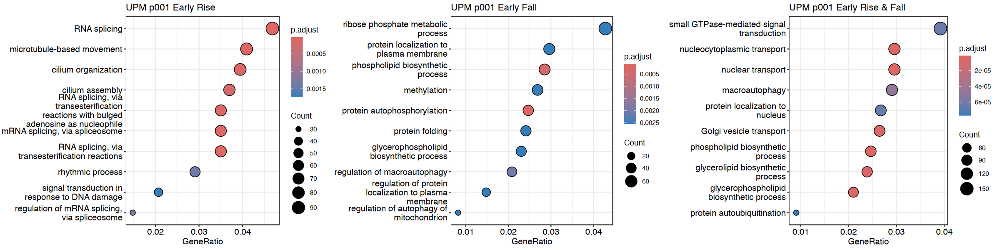

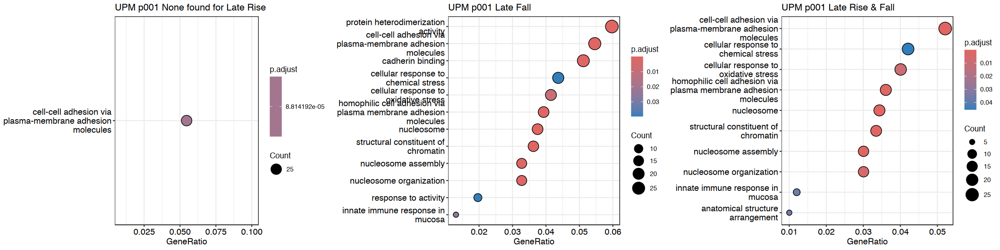

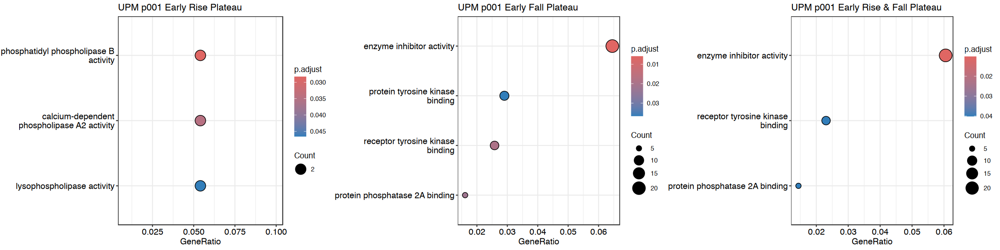

In [155]:
options(repr.plot.height=5, repr.plot.width=20)
pert="UPM p001"
p1 <- dotplot(go_early_rise, showCategory = 10, title=paste(pert,  "Early Rise"))
p2 <- dotplot(go_early_fall, showCategory = 10, title=paste(pert,  "Early Fall"))
p3 <- dotplot(go_early_both, showCategory = 10, title=paste(pert,  "Early Rise & Fall"))
grid.arrange(p1, p2, p3, ncol = 3)
# options(repr.plot.height=5, repr.plot.width=20)
p1 <- dotplot(go_late_down, showCategory = 0, title=paste(pert,  "None found for Late Rise"))
p2 <- dotplot(go_late_down, showCategory = 12, title=paste(pert,  "Late Fall"))
p3 <- dotplot(go_late_both, showCategory = 10, title=paste(pert,  "Late Rise & Fall"))
grid.arrange(p1, p2, p3, ncol = 3)
options(repr.plot.height=5, repr.plot.width=20)
p1 <- dotplot(go_early_plat_up, showCategory = 10, title=paste(pert,  "Early Rise Plateau"))
p2 <- dotplot(go_early_plat_down, showCategory = 10, title=paste(pert,  "Early Fall Plateau"))
p3 <- dotplot(go_early_plat_both, showCategory = 10, title=paste(pert,  "Early Rise & Fall Plateau"))
grid.arrange(p1, p2, p3, ncol = 3)

In [158]:
pert="UPM"
write.table(go_early_rise, paste0("../results/GO/p001_GO_EarlyRise", pert, "_DESeq2_GeneHK.txt"), 
           sep="\t", quote=FALSE)
write.table(go_early_fall, paste0("../results/GO/p001_GO_EarlyFall", pert, "_DESeq2_GeneHK.txt"),, 
           sep="\t", quote=FALSE)
write.table(go_late_up, paste0("../results/GO/p001_GO_LateRise", pert, "_DESeq2_GeneHK.txt"), 
           sep="\t", quote=FALSE)
write.table(go_late_down, paste0("../results/GO/p001_GO_LateFall", pert, "_DESeq2_GeneHK.txt"),, 
           sep="\t", quote=FALSE)
write.table(go_early_plat_up, paste0("../results/GO/p001_GO_EarlyRisePlat", pert, "_DESeq2_GeneHK.txt"), 
           sep="\t", quote=FALSE)
write.table(go_early_plat_down, paste0("../results/GO/p001_GO_EarlyFallPlat", pert, "_DESeq2_GeneHK.txt"),, 
           sep="\t", quote=FALSE)

saveRDS(All_Sig_genes, paste0(results_dir, "UPM_siggenes_DESeq2_GeneHK_p001.rds"))
saveRDS(All_Sig_nontss, paste0(results_dir, "UPM_signontss_DESeq2_GeneHK_p001.rds"))

In [182]:
early_plat_up

[1] "CDK5RAP2"               "SNTB1"                  "LYPD6B"                
 [4] "CDC14B"                 "ALDH3A1"                "GALNT10"               
 [7] "PLA2G4A"                "KSR1"                   "OSBPL10"               
[10] "VSTM2L"                 "GAD1"                   "STAG3L5P-PVRIG2P-PILRB"
[13] "SORL1"                  "ZFYVE28"                "RNA45SN1"              
[16] "RNA18SN1"               "KRT17"                  "LEKR1"                 
[19] "VEGFD"                  "CD7"                    "ANKRD13C"              
[22] "ST3GAL3"                "PPP2R2C"                "SLC8B1"                
[25] "SLC7A2"                 "ARHGEF7"                "LINC02029"             
[28] "TNRC18"                 "LHFPL6"                 "ITPK1"                 
[31] "GPR68"                  "MYZAP"                  "SNORA64"               
[34] "VCAN"                   "VDR"                    "ARHGEF18"              
[37] "PA2G4P4"                "MYLK3"                  "TMEM45B"               
[40] "TSPAN11"                "DNAH17"                 "LURAP1"                
[43] "PVT1"                   "PLA2G4B"                "PLA2G4E"               
[46] "SCARNA22"               "NKD2"                   "CLMN"                  
[49] "GCOM1"                  "MN1"                    "CHRNA7"                
[52] "KIAA1549"               "PTGFR"                  "ADAM12"                
[55] "IDO1"                   "CWF19L1"                "GALNT5"                
[58] "CD93"                   "IQCD"                   "CHRM4"                 
[61] "LOC102724467"           "ATP5ME"                 "DCLK1"                 
[64] "ITGA11"                 "BSN"                    "S1PR2"                 
[67] "KIF2C"                  "NQO1"                   "STAG3L5P"              
[70] "LINC01451"              "TIMP3"                  "SNORA11F"              
[73] "COL20A1"                "PGAP4"                  "ECI1"                  
[76] "KRT40"                  "PSPC1"                  "ATP5PO"                
[79] "PTCSC2"                 "RP1L1"                  "MMP10"                 
[82] "NCOA4"                  "SNORA32"                "CEP72"                 
[85] "SERTAD2"                "FRMPD3"                 "WLS"                   
[88] "TEX55"                  "ORC6"                   "NHSL1"                 
[91] "HUNK"                   "TAS2R31"                "SNORD35A"              
[94] "MIR6502"

In [183]:
sort(early_plat_up)

[1] "ADAM12"                 "ALDH3A1"                "ANKRD13C"              
 [4] "ARHGEF18"               "ARHGEF7"                "ATP5ME"                
 [7] "ATP5PO"                 "BSN"                    "CD7"                   
[10] "CD93"                   "CDC14B"                 "CDK5RAP2"              
[13] "CEP72"                  "CHRM4"                  "CHRNA7"                
[16] "CLMN"                   "COL20A1"                "CWF19L1"               
[19] "DCLK1"                  "DNAH17"                 "ECI1"                  
[22] "FRMPD3"                 "GAD1"                   "GALNT10"               
[25] "GALNT5"                 "GCOM1"                  "GPR68"                 
[28] "HUNK"                   "IDO1"                   "IQCD"                  
[31] "ITGA11"                 "ITPK1"                  "KIAA1549"              
[34] "KIF2C"                  "KRT17"                  "KRT40"                 
[37] "KSR1"                   "LEKR1"                  "LHFPL6"                
[40] "LINC01451"              "LINC02029"              "LOC102724467"          
[43] "LURAP1"                 "LYPD6B"                 "MIR6502"               
[46] "MMP10"                  "MN1"                    "MYLK3"                 
[49] "MYZAP"                  "NCOA4"                  "NHSL1"                 
[52] "NKD2"                   "NQO1"                   "ORC6"                  
[55] "OSBPL10"                "PA2G4P4"                "PGAP4"                 
[58] "PLA2G4A"                "PLA2G4B"                "PLA2G4E"               
[61] "PPP2R2C"                "PSPC1"                  "PTCSC2"                
[64] "PTGFR"                  "PVT1"                   "RNA18SN1"              
[67] "RNA45SN1"               "RP1L1"                  "S1PR2"                 
[70] "SCARNA22"               "SERTAD2"                "SLC7A2"                
[73] "SLC8B1"                 "SNORA11F"               "SNORA32"               
[76] "SNORA64"                "SNORD35A"               "SNTB1"                 
[79] "SORL1"                  "ST3GAL3"                "STAG3L5P"              
[82] "STAG3L5P-PVRIG2P-PILRB" "TAS2R31"                "TEX55"                 
[85] "TIMP3"                  "TMEM45B"                "TNRC18"                
[88] "TSPAN11"                "VCAN"                   "VDR"                   
[91] "VEGFD"                  "VSTM2L"                 "WLS"                   
[94] "ZFYVE28"

In [187]:
gene_filt_counts[c("PLA2G4A", "PLA2G4B", "PLA2G4E"),]
# Not being transribed

,UPM120_1,UPM120_2,UPM30_1,UPM30_2,Veh_1,Veh_2
PLA2G4A,7421,6728,5206,6224,3766,4430
PLA2G4B,553,452,405,501,296,216
PLA2G4E,312,246,305,462,121,145


## Adj pval of 1e-10

[1] "UPM30 vs Veh"

out of 20770 with nonzero total read count
adjusted p-value < 1e-10
LFC > 0 (up)       : 1545, 7.4%
LFC < 0 (down)     : 1500, 7.2%
outliers [1]       : 0, 0%
low counts [2]     : 2819, 14%
(mean count < 46)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



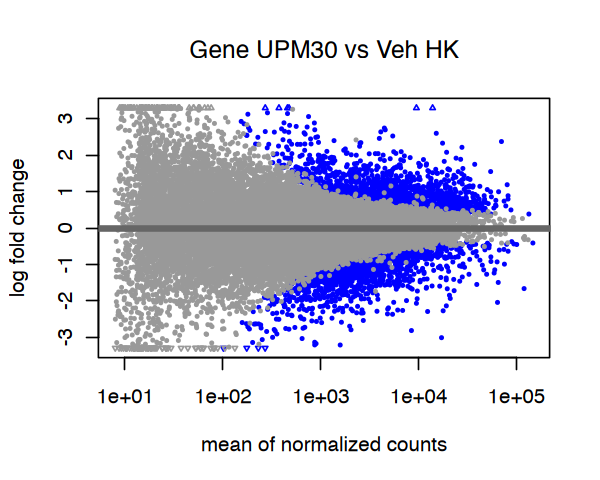

[1] 1545

[1] 1500

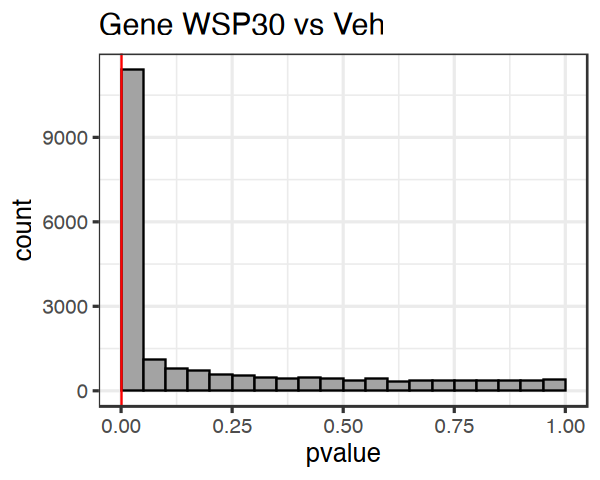

[1] "UPM120 vs Veh"

out of 20770 with nonzero total read count
adjusted p-value < 1e-10
LFC > 0 (up)       : 65, 0.31%
LFC < 0 (down)     : 335, 1.6%
outliers [1]       : 0, 0%
low counts [2]     : 8456, 41%
(mean count < 449)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



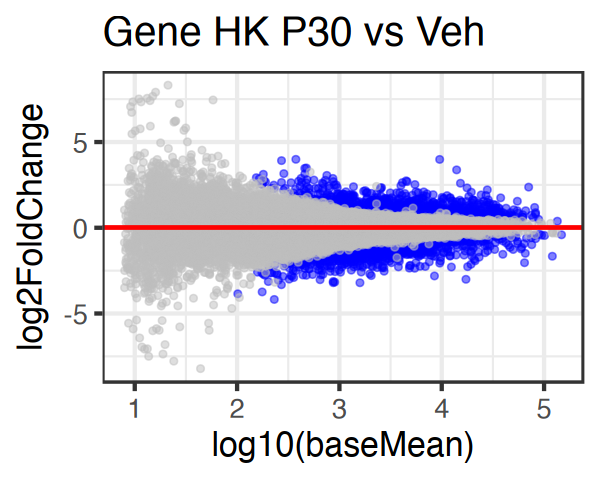

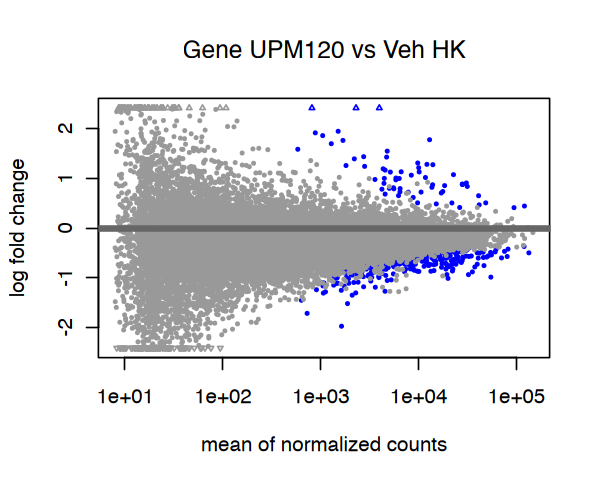

[1] 65

[1] 335

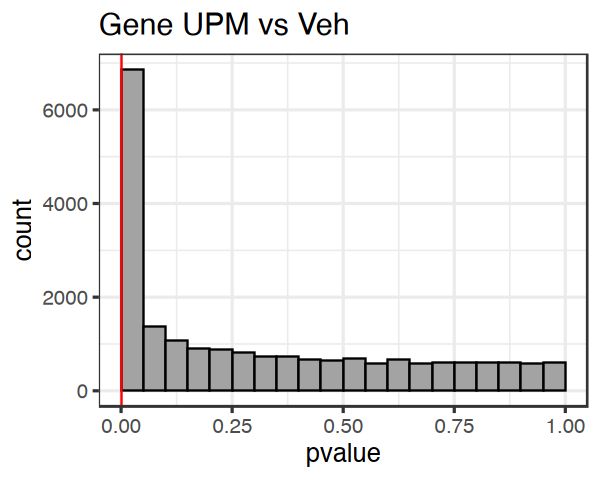

[1] "UPM120 vs UPM30"

out of 20770 with nonzero total read count
adjusted p-value < 1e-10
LFC > 0 (up)       : 1006, 4.8%
LFC < 0 (down)     : 2491, 12%
outliers [1]       : 0, 0%
low counts [2]     : 4027, 19%
(mean count < 79)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



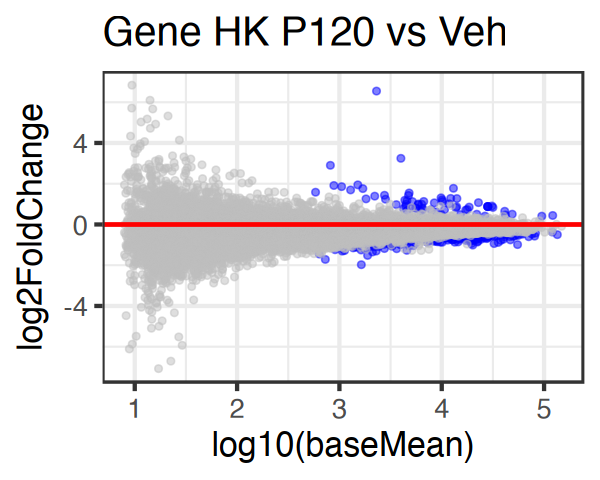

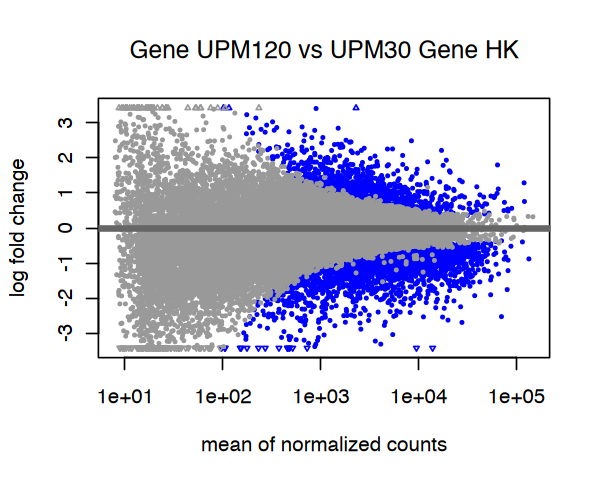

[1] 1006

[1] 2491

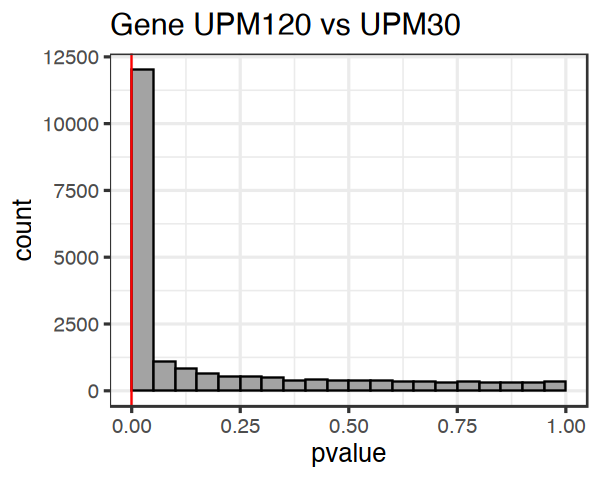

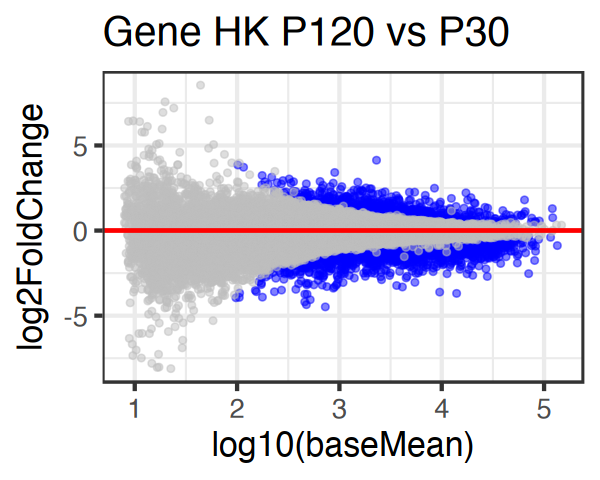

In [196]:
# Gene Results
padj_threshold=0.0000000001
print("UPM30 vs Veh")
options(repr.plot.height=4, repr.plot.width=5)
gene_res = results(dds_gene_filt, contrast= c("Treatment", "UPM30", "VEH"), alpha=padj_threshold)
gene_res <- gene_res[order(gene_res$pvalue),]
summary(gene_res)
plotMA(gene_res, main="Gene UPM30 vs Veh HK")
ggplot(data.frame(gene_res), aes(x=pvalue)) + geom_histogram(fill="grey64", binwidth=binwidth_use, color="black", boundary=0) + theme_bw(base_size=15) + 
       geom_vline(xintercept=padj_threshold, color="red") + ggtitle("Gene WSP30 vs Veh")
up_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange > 0), ])
down_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange < 0), ])
length(up_sig_genes); length(down_sig_genes)
Up_Sig_genes[["P30_vs_Veh"]] = up_sig_genes
All_Sig_genes[["P30_vs_Veh_up"]] = up_sig_genes
Down_Sig_genes[["P30_vs_Veh"]] = down_sig_genes
All_Sig_genes[["P30_vs_Veh_down"]] = down_sig_genes

testing = as.data.frame(gene_res)
testing$Color <- "NonSig"
testing$Geneid = rownames(testing)
testing[testing$Geneid %in% union(up_sig_genes, down_sig_genes),]$Color <- "Sig"
ggplot(testing, aes(x=log10(baseMean), y=log2FoldChange, color=Color)) + geom_point(alpha=0.5) + 
scale_color_manual(values=c("NonSig"="grey", "Sig"="blue")) + theme_bw(base_size=20) + 
theme(legend.position="None") +
geom_hline(yintercept=0, color="red", size=1) + ggtitle("Gene HK P30 vs Veh")
write.table(gene_res, 
            paste0(results_dir, "res_Gene_UPM30_vs_Veh_par_rat_Wd_GeneHK_p01.txt"), 
            sep=",", quote=FALSE)

print("UPM120 vs Veh")
options(repr.plot.height=4, repr.plot.width=5)
gene_res = results(dds_gene_filt, contrast= c("Treatment", "UPM120", "VEH"), alpha=padj_threshold)
gene_res <- gene_res[order(gene_res$pvalue),]
summary(gene_res)
plotMA(gene_res, main="Gene UPM120 vs Veh HK")
ggplot(data.frame(gene_res), aes(x=pvalue)) + geom_histogram(fill="grey64", binwidth=binwidth_use, color="black", boundary=0) + theme_bw(base_size=15) + 
       geom_vline(xintercept=padj_threshold, color="red") + ggtitle("Gene UPM vs Veh")
up_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange > 0), ])
down_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange < 0), ])
length(up_sig_genes); length(down_sig_genes)
Up_Sig_genes[["P120_vs_Veh"]] = up_sig_genes
All_Sig_genes[["P120_vs_Veh_up"]] = up_sig_genes
Down_Sig_genes[["P120_vs_Veh"]] = down_sig_genes
All_Sig_genes[["P120_vs_Veh_down"]] = down_sig_genes

testing = as.data.frame(gene_res)
testing$Color <- "NonSig"
testing$Geneid = rownames(testing)
testing[testing$Geneid %in% union(up_sig_genes, down_sig_genes),]$Color <- "Sig"
ggplot(testing, aes(x=log10(baseMean), y=log2FoldChange, color=Color)) + geom_point(alpha=0.5) + 
scale_color_manual(values=c("NonSig"="grey", "Sig"="blue")) + theme_bw(base_size=20) + 
theme(legend.position="None") +
geom_hline(yintercept=0, color="red", size=1) + ggtitle("Gene HK P120 vs Veh")
write.table(gene_res, 
            paste0(results_dir, "res_Gene_UPM120_vs_Veh_par_rat_Wd_GeneHK_p01.txt"), 
            sep=",", quote=FALSE)

print("UPM120 vs UPM30")
options(repr.plot.height=4, repr.plot.width=5)
gene_res = results(dds_gene_filt, contrast= c("Treatment", "UPM120", "UPM30"), alpha=padj_threshold)
gene_res <- gene_res[order(gene_res$pvalue),]
summary(gene_res)
plotMA(gene_res, main="Gene UPM120 vs UPM30 Gene HK")
ggplot(data.frame(gene_res), aes(x=pvalue)) + geom_histogram(fill="grey64", binwidth=binwidth_use, color="black", boundary=0) + theme_bw(base_size=15) + 
       geom_vline(xintercept=padj_threshold, color="red") + ggtitle("Gene UPM120 vs UPM30")
up_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange > 0), ])
down_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange < 0), ])
length(up_sig_genes); length(down_sig_genes)
Up_Sig_genes[["P120_vs_P30"]] = up_sig_genes
All_Sig_genes[["P120_vs_P30_up"]] = up_sig_genes
Down_Sig_genes[["P120_vs_P30"]] = down_sig_genes
All_Sig_genes[["P120_vs_P30_down"]] = down_sig_genes

testing = as.data.frame(gene_res)
testing$Color <- "NonSig"
testing$Geneid = rownames(testing)
testing[testing$Geneid %in% union(up_sig_genes, down_sig_genes),]$Color <- "Sig"
ggplot(testing, aes(x=log10(baseMean), y=log2FoldChange, color=Color)) + geom_point(alpha=0.5) + 
scale_color_manual(values=c("NonSig"="grey", "Sig"="blue")) + theme_bw(base_size=20) + 
theme(legend.position="None") +
geom_hline(yintercept=0, color="red", size=1) + ggtitle("Gene HK P120 vs P30")
write.table(gene_res, 
            paste0(results_dir, "res_Gene_UPM120_vs_UPM30_par_rat_Wd_GeneHK_p01.txt"), 
            sep=",", quote=FALSE)

In [197]:
## EARLY and Temporary
early_rise_genes = setdiff(intersect(Up_Sig_genes[["P30_vs_Veh"]], Down_Sig_genes[["P120_vs_P30"]]), 
                           union(Up_Sig_genes[["P120_vs_Veh"]], Down_Sig_genes[["P120_vs_Veh"]]))
length(early_rise_genes)
go_early_rise = run_go_analysis(early_rise_genes)
early_fall_genes = setdiff(intersect(Down_Sig_genes[["P30_vs_Veh"]], Up_Sig_genes[["P120_vs_P30"]]), 
                           union(Up_Sig_genes[["P120_vs_Veh"]], Down_Sig_genes[["P120_vs_Veh"]]))
length(early_fall_genes)
go_early_fall = run_go_analysis(early_fall_genes)
go_early_both = run_go_analysis(union(early_rise_genes, early_fall_genes))

[1] 1348

[1] 851

In [198]:
## Early and stays (plateaus)
early_plat_up = setdiff(intersect(Up_Sig_genes[["P120_vs_Veh"]], Up_Sig_genes[["P30_vs_Veh"]]), 
                    union(Up_Sig_genes[["P120_vs_P30"]], Down_Sig_genes[["P120_vs_P30"]]))
length(early_plat_up)
go_early_plat_up = run_go_analysis(early_plat_up)
early_plat_down = setdiff(intersect(Down_Sig_genes[["P120_vs_Veh"]], Down_Sig_genes[["P30_vs_Veh"]]), 
                    union(Up_Sig_genes[["P120_vs_P30"]], Down_Sig_genes[["P120_vs_P30"]]))
length(early_plat_down)
go_early_plat_down = run_go_analysis(early_plat_down)
go_early_plat_both = run_go_analysis(union(early_plat_up, early_plat_down))

[1] 25

[1] 51

In [199]:
## LATE
late_up = setdiff(intersect(Up_Sig_genes[["P120_vs_Veh"]], Up_Sig_genes[["P120_vs_P30"]]), 
                    union(Up_Sig_genes[["P30_vs_Veh"]], Down_Sig_genes[["P30_vs_Veh"]]))
length(late_up)
go_late_up = run_go_analysis(late_up)
late_down = setdiff(intersect(Down_Sig_genes[["P120_vs_Veh"]], Down_Sig_genes[["P120_vs_P30"]]), 
                    union(Up_Sig_genes[["P30_vs_Veh"]], Down_Sig_genes[["P30_vs_Veh"]]))
length(late_down)
go_late_down = run_go_analysis(late_down)
go_late_both = run_go_analysis(union(late_up, late_down))

[1] 21

[1] 94

#### GO Term Numbers
* Early Rise: 1348 genes, 120 enriched terms
* Early Fall: 851 genes, 63 enriched terms
* Late Up: 21 genes, 36 enriched terms
* Late Down: 94 genes, 37 enriched terms
* Early Plateau Up: 25 genes, 35 enriched terms
* Early Plateau Down: 51 genes, 14 enriched terms

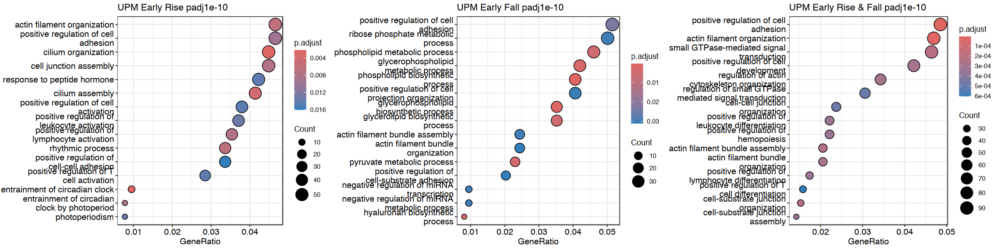

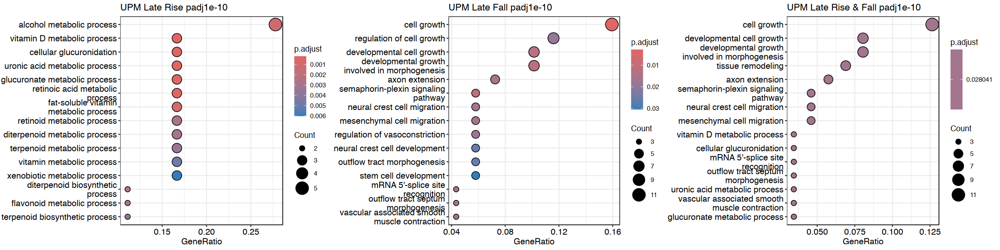

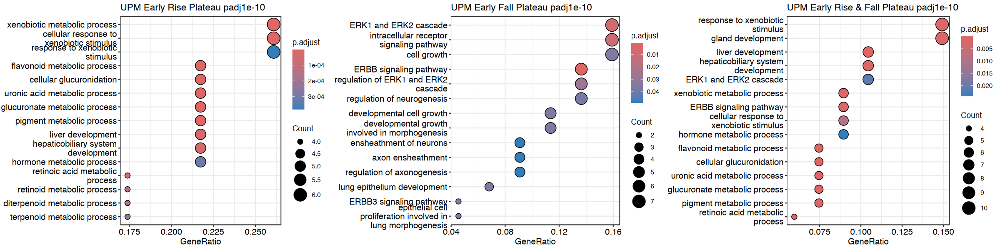

In [209]:
options(repr.plot.height=5, repr.plot.width=20)
pert="UPM"
p1 <- dotplot(go_early_rise, showCategory = 15, title=paste(pert,  "Early Rise padj1e-10"))
p2 <- dotplot(go_early_fall, showCategory = 15, title=paste(pert,  "Early Fall padj1e-10"))
p3 <- dotplot(go_early_both, showCategory = 15, title=paste(pert,  "Early Rise & Fall padj1e-10"))
grid.arrange(p1, p2, p3, ncol = 3)
# options(repr.plot.height=5, repr.plot.width=20)
p1 <- dotplot(go_late_up, showCategory = 15, title=paste(pert,  "Late Rise padj1e-10"))
p2 <- dotplot(go_late_down, showCategory = 15, title=paste(pert,  "Late Fall padj1e-10"))
p3 <- dotplot(go_late_both, showCategory = 15, title=paste(pert,  "Late Rise & Fall padj1e-10"))
grid.arrange(p1, p2, p3, ncol = 3)
options(repr.plot.height=5, repr.plot.width=20)
p1 <- dotplot(go_early_plat_up, showCategory = 15, title=paste(pert,  "Early Rise Plateau padj1e-10"))
p2 <- dotplot(go_early_plat_down, showCategory = 15, title=paste(pert,  "Early Fall Plateau padj1e-10"))
p3 <- dotplot(go_early_plat_both, showCategory = 15, title=paste(pert,  "Early Rise & Fall Plateau padj1e-10"))
grid.arrange(p1, p2, p3, ncol = 3)

In [211]:
write.table(go_early_rise, paste0("../results/GO/p1e10_GO_EarlyRise", pert, "_DESeq2_GeneHK.txt"), 
           sep="\t", quote=FALSE)
write.table(go_early_fall, paste0("../results/GO/p1e10_GO_EarlyFall", pert, "_DESeq2_GeneHK.txt"),, 
           sep="\t", quote=FALSE)
write.table(go_late_up, paste0("../results/GO/p1e10_GO_LateRise", pert, "_DESeq2_GeneHK.txt"), 
           sep="\t", quote=FALSE)
write.table(go_late_down, paste0("../results/GO/p1e10_GO_LateFall", pert, "_DESeq2_GeneHK.txt"),, 
           sep="\t", quote=FALSE)
write.table(go_early_plat_up, paste0("../results/GO/p1e10_GO_EarlyRisePlat", pert, "_DESeq2_GeneHK.txt"), 
           sep="\t", quote=FALSE)
write.table(go_early_plat_down, paste0("../results/GO/p1e10_GO_EarlyFallPlat", pert, "_DESeq2_GeneHK.txt"), 
           sep="\t", quote=FALSE)

saveRDS(All_Sig_genes, paste0(results_dir, "UPM_siggenes_DESeq2_GeneHK_p1e10.rds"))
saveRDS(All_Sig_nontss, paste0(results_dir, "UPM_signontss_DESeq2_GeneHK_p1e10.rds"))

## Adj pval of 1e-20

[1] "UPM30 vs Veh"

out of 20770 with nonzero total read count
adjusted p-value < 1e-20
LFC > 0 (up)       : 758, 3.6%
LFC < 0 (down)     : 625, 3%
outliers [1]       : 0, 0%
low counts [2]     : 4027, 19%
(mean count < 79)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



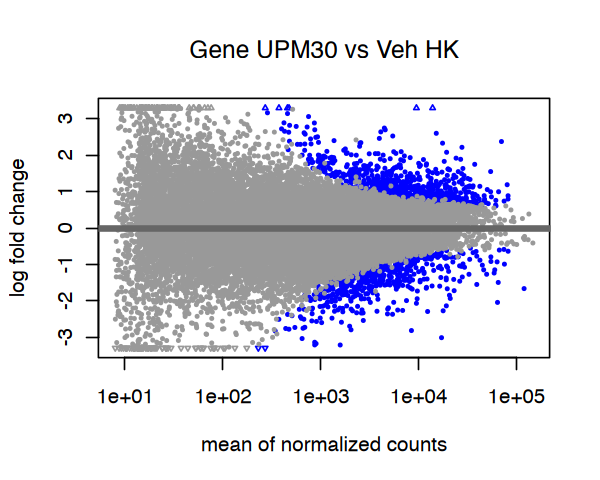

[1] 758

[1] 625

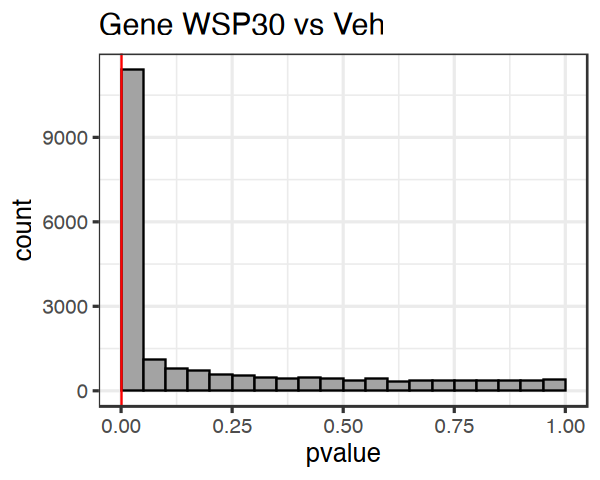

[1] "UPM120 vs Veh"

out of 20770 with nonzero total read count
adjusted p-value < 1e-20
LFC > 0 (up)       : 46, 0.22%
LFC < 0 (down)     : 52, 0.25%
outliers [1]       : 0, 0%
low counts [2]     : 1208, 5.8%
(mean count < 21)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



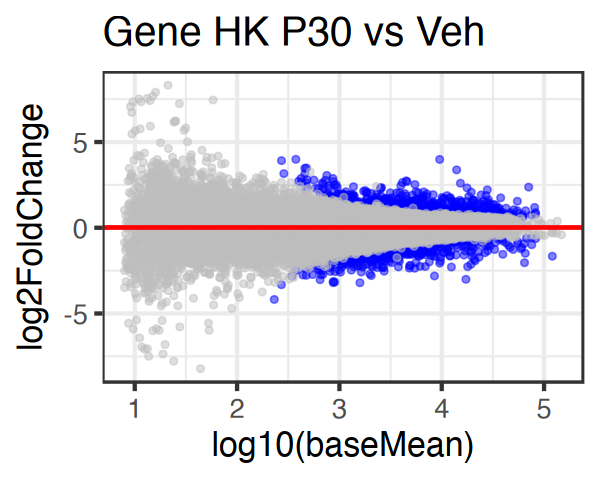

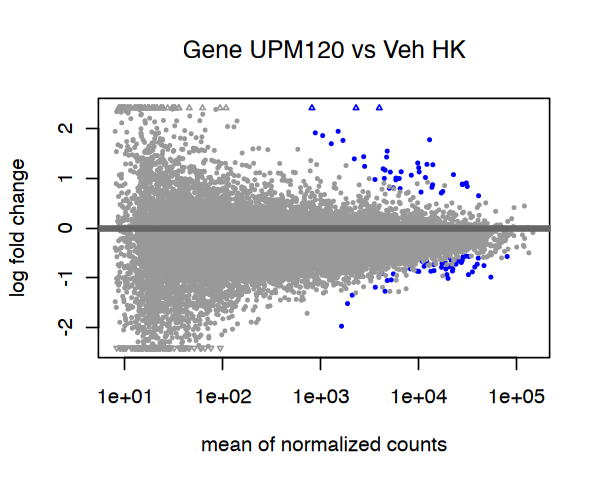

[1] 46

[1] 52

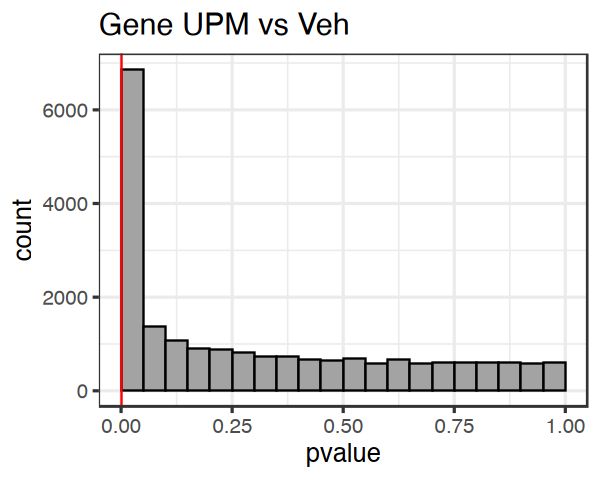

[1] "UPM120 vs UPM30"

out of 20770 with nonzero total read count
adjusted p-value < 1e-20
LFC > 0 (up)       : 440, 2.1%
LFC < 0 (down)     : 1394, 6.7%
outliers [1]       : 0, 0%
low counts [2]     : 0, 0%
(mean count < 8)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



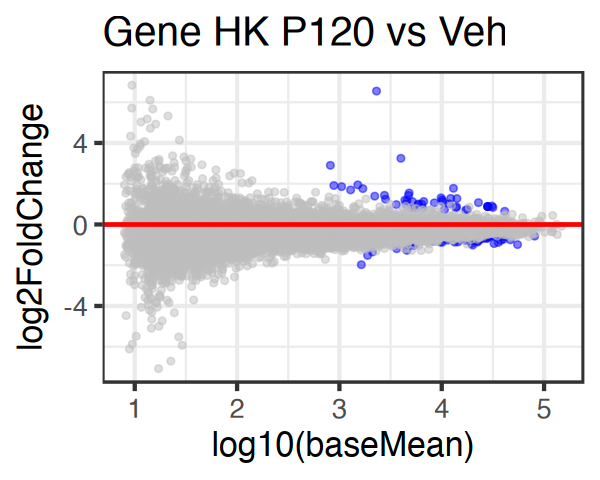

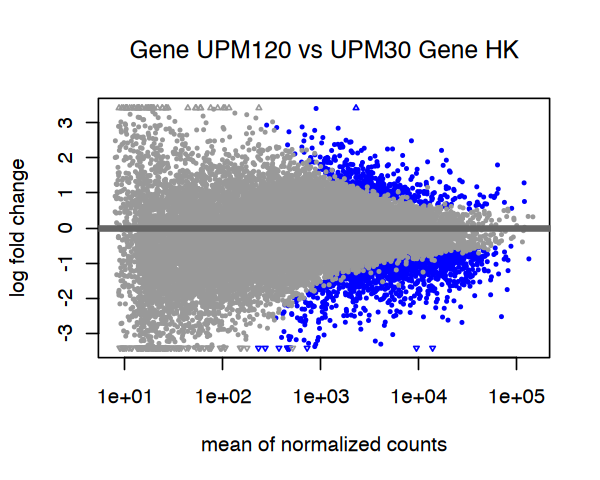

[1] 440

[1] 1394

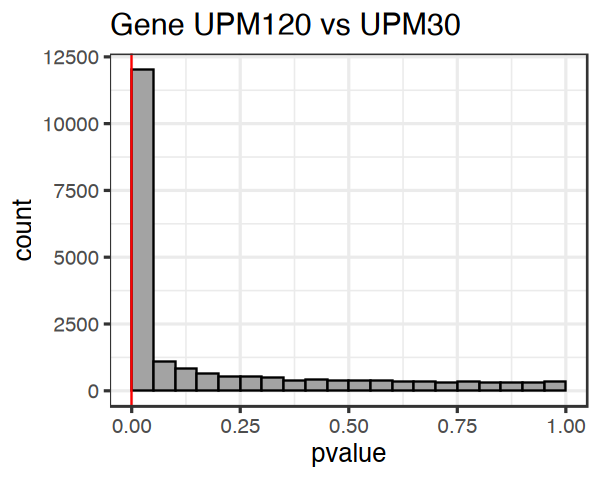

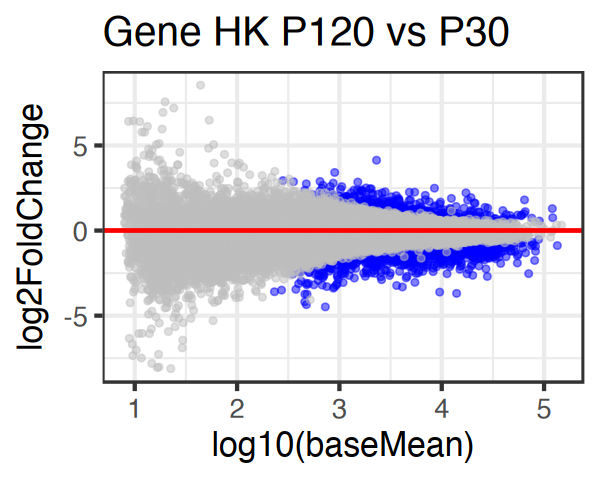

In [239]:
# Gene Results
padj_threshold=1e-20
print("UPM30 vs Veh")
options(repr.plot.height=4, repr.plot.width=5)
gene_res = results(dds_gene_filt, contrast= c("Treatment", "UPM30", "VEH"), alpha=padj_threshold)
gene_res <- gene_res[order(gene_res$pvalue),]
summary(gene_res)
plotMA(gene_res, main="Gene UPM30 vs Veh HK")
ggplot(data.frame(gene_res), aes(x=pvalue)) + geom_histogram(fill="grey64", binwidth=binwidth_use, color="black", boundary=0) + theme_bw(base_size=15) + 
       geom_vline(xintercept=padj_threshold, color="red") + ggtitle("Gene WSP30 vs Veh")
up_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange > 0), ])
down_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange < 0), ])
length(up_sig_genes); length(down_sig_genes)
Up_Sig_genes[["P30_vs_Veh"]] = up_sig_genes
All_Sig_genes[["P30_vs_Veh_up"]] = up_sig_genes
Down_Sig_genes[["P30_vs_Veh"]] = down_sig_genes
All_Sig_genes[["P30_vs_Veh_down"]] = down_sig_genes

testing = as.data.frame(gene_res)
testing$Color <- "NonSig"
testing$Geneid = rownames(testing)
testing[testing$Geneid %in% union(up_sig_genes, down_sig_genes),]$Color <- "Sig"
ggplot(testing, aes(x=log10(baseMean), y=log2FoldChange, color=Color)) + geom_point(alpha=0.5) + 
scale_color_manual(values=c("NonSig"="grey", "Sig"="blue")) + theme_bw(base_size=20) + 
theme(legend.position="None") +
geom_hline(yintercept=0, color="red", size=1) + ggtitle("Gene HK P30 vs Veh")


print("UPM120 vs Veh")
options(repr.plot.height=4, repr.plot.width=5)
gene_res = results(dds_gene_filt, contrast= c("Treatment", "UPM120", "VEH"), alpha=padj_threshold)
gene_res <- gene_res[order(gene_res$pvalue),]
summary(gene_res)
plotMA(gene_res, main="Gene UPM120 vs Veh HK")
ggplot(data.frame(gene_res), aes(x=pvalue)) + geom_histogram(fill="grey64", binwidth=binwidth_use, color="black", boundary=0) + theme_bw(base_size=15) + 
       geom_vline(xintercept=padj_threshold, color="red") + ggtitle("Gene UPM vs Veh")
up_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange > 0), ])
down_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange < 0), ])
length(up_sig_genes); length(down_sig_genes)
Up_Sig_genes[["P120_vs_Veh"]] = up_sig_genes
All_Sig_genes[["P120_vs_Veh_up"]] = up_sig_genes
Down_Sig_genes[["P120_vs_Veh"]] = down_sig_genes
All_Sig_genes[["P120_vs_Veh_down"]] = down_sig_genes

testing = as.data.frame(gene_res)
testing$Color <- "NonSig"
testing$Geneid = rownames(testing)
testing[testing$Geneid %in% union(up_sig_genes, down_sig_genes),]$Color <- "Sig"
ggplot(testing, aes(x=log10(baseMean), y=log2FoldChange, color=Color)) + geom_point(alpha=0.5) + 
scale_color_manual(values=c("NonSig"="grey", "Sig"="blue")) + theme_bw(base_size=20) + 
theme(legend.position="None") +
geom_hline(yintercept=0, color="red", size=1) + ggtitle("Gene HK P120 vs Veh")


print("UPM120 vs UPM30")
options(repr.plot.height=4, repr.plot.width=5)
gene_res = results(dds_gene_filt, contrast= c("Treatment", "UPM120", "UPM30"), alpha=padj_threshold)
gene_res <- gene_res[order(gene_res$pvalue),]
summary(gene_res)
plotMA(gene_res, main="Gene UPM120 vs UPM30 Gene HK")
ggplot(data.frame(gene_res), aes(x=pvalue)) + geom_histogram(fill="grey64", binwidth=binwidth_use, color="black", boundary=0) + theme_bw(base_size=15) + 
       geom_vline(xintercept=padj_threshold, color="red") + ggtitle("Gene UPM120 vs UPM30")
up_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange > 0), ])
down_sig_genes <- rownames(gene_res[which(gene_res$padj < padj_threshold & gene_res$log2FoldChange < 0), ])
length(up_sig_genes); length(down_sig_genes)
Up_Sig_genes[["P120_vs_P30"]] = up_sig_genes
All_Sig_genes[["P120_vs_P30_up"]] = up_sig_genes
Down_Sig_genes[["P120_vs_P30"]] = down_sig_genes
All_Sig_genes[["P120_vs_P30_down"]] = down_sig_genes

testing = as.data.frame(gene_res)
testing$Color <- "NonSig"
testing$Geneid = rownames(testing)
testing[testing$Geneid %in% union(up_sig_genes, down_sig_genes),]$Color <- "Sig"
ggplot(testing, aes(x=log10(baseMean), y=log2FoldChange, color=Color)) + geom_point(alpha=0.5) + 
scale_color_manual(values=c("NonSig"="grey", "Sig"="blue")) + theme_bw(base_size=20) + 
theme(legend.position="None") +
geom_hline(yintercept=0, color="red", size=1) + ggtitle("Gene HK P120 vs P30")


In [240]:
## EARLY and Temporary
early_rise_genes = setdiff(intersect(Up_Sig_genes[["P30_vs_Veh"]], Down_Sig_genes[["P120_vs_P30"]]), 
                           union(Up_Sig_genes[["P120_vs_Veh"]], Down_Sig_genes[["P120_vs_Veh"]]))
length(early_rise_genes)
go_early_rise = run_go_analysis(early_rise_genes)
early_fall_genes = setdiff(intersect(Down_Sig_genes[["P30_vs_Veh"]], Up_Sig_genes[["P120_vs_P30"]]), 
                           union(Up_Sig_genes[["P120_vs_Veh"]], Down_Sig_genes[["P120_vs_Veh"]]))
length(early_fall_genes)
go_early_fall = run_go_analysis(early_fall_genes)
go_early_both = run_go_analysis(union(early_rise_genes, early_fall_genes))

[1] 689

[1] 373

In [241]:
## Early and stays (plateaus)
early_plat_up = setdiff(intersect(Up_Sig_genes[["P120_vs_Veh"]], Up_Sig_genes[["P30_vs_Veh"]]), 
                    union(Up_Sig_genes[["P120_vs_P30"]], Down_Sig_genes[["P120_vs_P30"]]))
length(early_plat_up)
go_early_plat_up = run_go_analysis(early_plat_up)
early_plat_down = setdiff(intersect(Down_Sig_genes[["P120_vs_Veh"]], Down_Sig_genes[["P30_vs_Veh"]]), 
                    union(Up_Sig_genes[["P120_vs_P30"]], Down_Sig_genes[["P120_vs_P30"]]))
length(early_plat_down)
go_early_plat_down = run_go_analysis(early_plat_down)
go_early_plat_both = run_go_analysis(union(early_plat_up, early_plat_down))

[1] 13

[1] 8

In [242]:
## LATE
late_up = setdiff(intersect(Up_Sig_genes[["P120_vs_Veh"]], Up_Sig_genes[["P120_vs_P30"]]), 
                    union(Up_Sig_genes[["P30_vs_Veh"]], Down_Sig_genes[["P30_vs_Veh"]]))
length(late_up)
go_late_up = run_go_analysis(late_up)
late_down = setdiff(intersect(Down_Sig_genes[["P120_vs_Veh"]], Down_Sig_genes[["P120_vs_P30"]]), 
                    union(Up_Sig_genes[["P30_vs_Veh"]], Down_Sig_genes[["P30_vs_Veh"]]))
length(late_down)
go_late_down = run_go_analysis(late_down)
go_late_both = run_go_analysis(union(late_up, late_down))

[1] 14

[1] 18

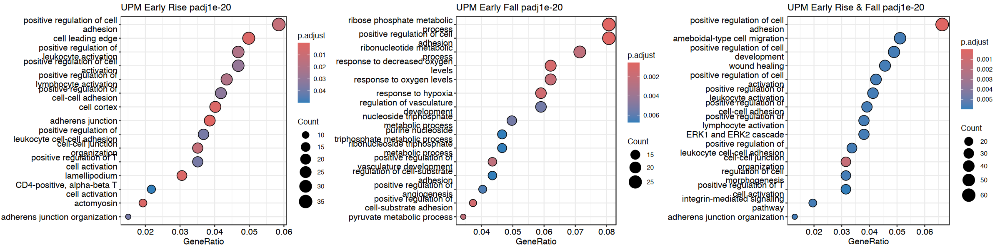

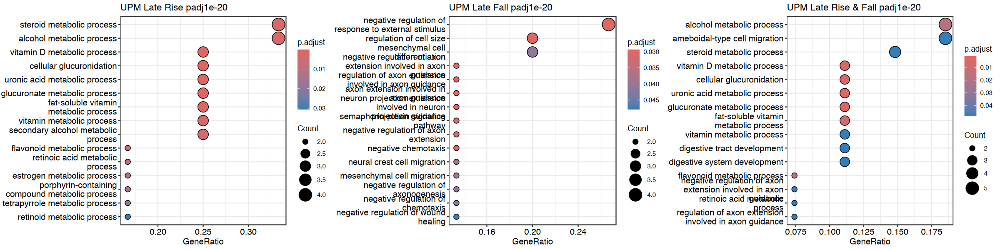

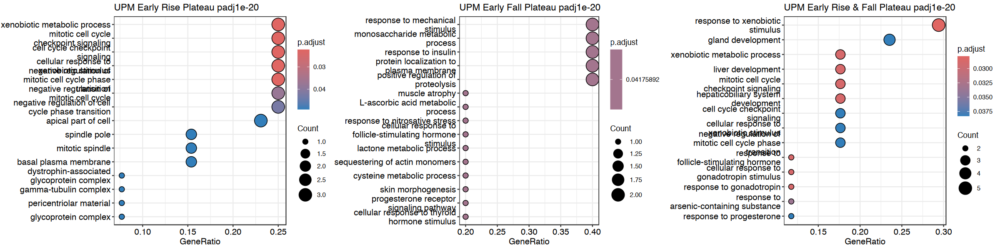

In [243]:
options(repr.plot.height=5, repr.plot.width=20)
pert="UPM"
p1 <- dotplot(go_early_rise, showCategory = 15, title=paste(pert,  "Early Rise padj1e-20"))
p2 <- dotplot(go_early_fall, showCategory = 15, title=paste(pert,  "Early Fall padj1e-20"))
p3 <- dotplot(go_early_both, showCategory = 15, title=paste(pert,  "Early Rise & Fall padj1e-20"))
grid.arrange(p1, p2, p3, ncol = 3)
# options(repr.plot.height=5, repr.plot.width=20)
p1 <- dotplot(go_late_up, showCategory = 15, title=paste(pert,  "Late Rise padj1e-20"))
p2 <- dotplot(go_late_down, showCategory = 15, title=paste(pert,  "Late Fall padj1e-20"))
p3 <- dotplot(go_late_both, showCategory = 15, title=paste(pert,  "Late Rise & Fall padj1e-20"))
grid.arrange(p1, p2, p3, ncol = 3)
options(repr.plot.height=5, repr.plot.width=20)
p1 <- dotplot(go_early_plat_up, showCategory = 15, title=paste(pert,  "Early Rise Plateau padj1e-20"))
p2 <- dotplot(go_early_plat_down, showCategory = 15, title=paste(pert,  "Early Fall Plateau padj1e-20"))
p3 <- dotplot(go_early_plat_both, showCategory = 15, title=paste(pert,  "Early Rise & Fall Plateau padj1e-20"))
grid.arrange(p1, p2, p3, ncol = 3)

In [244]:
write.table(go_early_rise, paste0("../results/GO/p1e20_GO_EarlyRise", pert, "_DESeq2_GeneHK.txt"), 
           sep="\t", quote=FALSE)
write.table(go_early_fall, paste0("../results/GO/p1e20_GO_EarlyFall", pert, "_DESeq2_GeneHK.txt"),, 
           sep="\t", quote=FALSE)
write.table(go_late_up, paste0("../results/GO/p1e20_GO_LateRise", pert, "_DESeq2_GeneHK.txt"), 
           sep="\t", quote=FALSE)
write.table(go_late_down, paste0("../results/GO/p1e20_GO_LateFall", pert, "_DESeq2_GeneHK.txt"),, 
           sep="\t", quote=FALSE)
write.table(go_early_plat_up, paste0("../results/GO/p1e20_GO_EarlyRisePlat", pert, "_DESeq2_GeneHK.txt"), 
           sep="\t", quote=FALSE)
write.table(go_early_plat_down, paste0("../results/GO/p1e20_GO_EarlyFallPlat", pert, "_DESeq2_GeneHK.txt"), 
           sep="\t", quote=FALSE)

saveRDS(All_Sig_genes, paste0(results_dir, "UPM_siggenes_DESeq2_GeneHK_p1e20.rds"))

[1] 50

,ONTOLOGY,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count,Group,Max_call
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<chr>,<dbl>
GO:0045216,BP,GO:0045216,cell-cell junction organization,21/598,213/18888,0.09859155,3.114042,5.610459,4.381915e-06,0.01253415,0.0114844,CLDN1/VCL/EPHA4/TJP1/GRHL2/CDH1/CNTNAP2/CDH26/WDR1/TJP2/OCLN/TGFB2/PERP/MPP7/POF1B/CDH3/HEG1/EFNB2/CDHR3/ADAM10/HOPX,21,Cellular Adhesion,7.63032
GO:0045785,BP,GO:0045785,positive regulation of cell adhesion,35/598,485/18888,0.07216495,2.279350,5.161088,5.580656e-06,0.01253415,0.0114844,CD55/MAP3K8/EPHA4/GCNT2/TJP1/VAV3/NEDD9/IL18/ITGAV/SLC7A1/CD74/VTCN1/LYN/VNN1/TGFB2/ARID1B/SMARCA2/NR4A3/EFNB2/MAGI1/FMN1/HLA-DRA/NFKBIZ/EDIL3/GLI3/HLA-DPB1/IL6ST/ABL2/ATM/PPP3CA/IL1RL2/BRAF/MALT1/ADGRG1/PTPN11,35,Cellular Adhesion,7.63032


ONTOLOGY,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count,Group,Max_call
<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<chr>,<dbl>


Warning message:
“Cannot compute density for groups with fewer than two datapoints.”


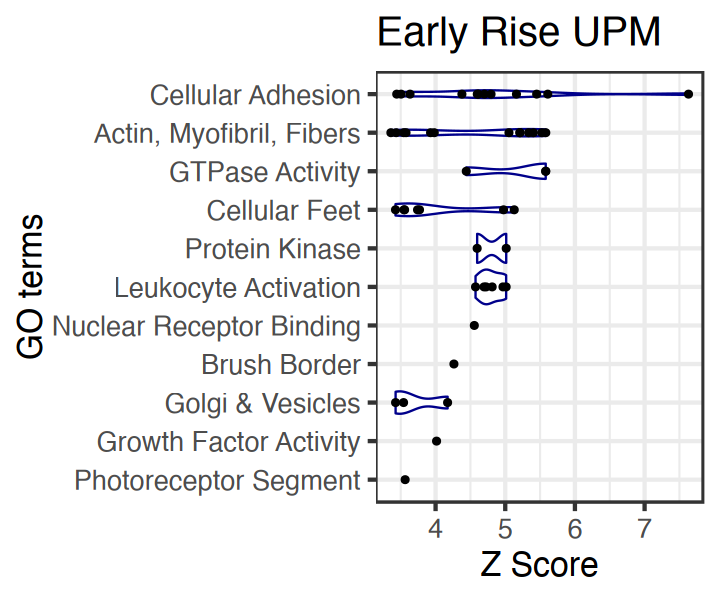

In [266]:
options(repr.plot.width=6)
#go_early_risep$Description
using = as.data.frame(go_early_rise)
length(unique(using$Description))
using[1:2,]
using$Group <- "Other"
using[grepl("junction|desmosome|cadherin|integrin|adhesion|adherens|immunological synapse", using$Description),]$Group <- "Cellular Adhesion"
using[grepl("contractile fiber|Z disc|I band|actin|myofibril|actomyosin|stress fiber|cell cortex", using$Description),]$Group <- "Actin, Myofibril, Fibers"
using[grepl("ruffle|growth cone|ciliary|polarized growth|filopodium|lamellipodium|cell leading edge", using$Description),]$Group <- "Cellular Feet"
using[grepl("leukocyte|lymphocyte|activation", using$Description),]$Group <- "Leukocyte Activation"
using[grepl("GTPase|nucleoside-triphosphatase", using$Description),]$Group <- "GTPase Activity"
using[grepl("protein serine", using$Description),]$Group <- "Protein Kinase"
using[grepl("brush border", using$Description),]$Group <- "Brush Border"
using[grepl("growth factor", using$Description),]$Group <- "Growth Factor Activity"
using[grepl("golgi|Golgi|vesicle", using$Description),]$Group <- "Golgi & Vesicles"
using[grepl("photoreceptor", using$Description),]$Group <- "Photoreceptor Segment"
using[grepl("nuclear receptor binding", using$Description),]$Group <- "Nuclear Receptor Binding"
# using[grepl("SREBP|sterol", using$Description),]$Group <- "Sterol Depletion (SREBP)"
# using[grepl("autophagy", using$Description),]$Group <- "Autophagy"
testing = using[using$Group == "Other",]
testing[order(-testing$zScore),]
using$Max_call <- 0
for (group in unique(using$Group)) {
    filt = using[using$Group == group,]
    max_call = max(filt$zScore)
    using[using$Group == group,]$Max_call = max_call
    }
go_early_rise = using
pER <- ggplot(go_early_rise, aes(x=zScore, y=reorder(Group, Max_call))) + geom_violin(color = "darkblue", drop=FALSE) + geom_point(color = "black") + theme_bw(base_size=20) + 
labs(y="GO terms", x="Z Score") + ggtitle("Early Rise UPM")
pER

[1] 105

,ONTOLOGY,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count,Group,Max_call
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<chr>,<dbl>
GO:0018208,BP,GO:0018208,peptidyl-proline modification,5/322,39/18888,0.12820513,7.520306,5.367924,4.994929e-04,0.028387849,0.024233772,P4HA1/EGLN1/FKBP1A/PPIC/FKBP4,5,Other,5.367924
GO:1902894,BP,GO:1902894,negative regulation of miRNA transcription,4/322,27/18888,0.14814815,8.690131,5.266032,1.067330e-03,0.045494944,0.038837536,VEGFA/SMAD3/TGFB1/YY1,4,Other,5.367924
GO:0050878,BP,GO:0050878,regulation of body fluid levels,18/322,370/18888,0.04864865,2.853651,4.742224,7.112410e-05,0.009044364,0.007720876,CEACAM1/VEGFA/ADM/HK2/ITGB3/SCNN1G/PLAT/F3/ZNF385A/MLLT6/GPI/ANO1/PAFAH2/XBP1/ZBTB7B/FLNA/ADA/AQP3,18,Other,5.367924
GO:0001667,BP,GO:0001667,ameboidal-type cell migration,22/322,498/18888,0.04417671,2.591334,4.739532,4.878613e-05,0.008317553,0.007100421,LOXL2/SEMA4B/CEACAM1/VEGFA/PRR5L/ITGA3/AKAP12/TNS1/EFNA1/EPHB4/ITGB3/TIMP1/GPI/CTSH/TGFB1/SH3BP1/SEMA3F/PLEKHG5/S100A2/PRKD2/TBX1/HYAL1,22,Other,5.367924
GO:0098685,CC,GO:0098685,Schaffer collateral - CA1 synapse,7/339,93/19894,0.07526882,4.417103,4.348876,1.060661e-03,0.046551235,0.041558064,AKAP12/PLAT/ADORA2B/SLC1A1/SNX27/DVL1/MAPK9,7,Other,5.367924
GO:0098978,CC,GO:0098978,glutamatergic synapse,17/339,409/19894,0.04156479,2.439203,3.872173,6.997849e-04,0.039487862,0.035252322,SEMA4B/ITGA3/EGLN1/ITGB3/PLAT/ITGA5/ADORA2B/NAPB/RAP1A/SNX27/FLNA/DBNL/SEMA3F/CHD4/CPSF2/TIAM1/DVL1,17,Other,5.367924
GO:0009925,CC,GO:0009925,basal plasma membrane,13/339,286/19894,0.04545455,2.667471,3.739778,1.321855e-03,0.047895673,0.042758296,SLC2A1/SLC5A3/CEACAM1/ITGA3/SLC6A6/MSN/SLC16A1/INPPL1/CEACAM5/LDLRAP1/ABCC3/CA12/AQP3,13,Other,5.367924


Warning message:
“Cannot compute density for groups with fewer than two datapoints.”


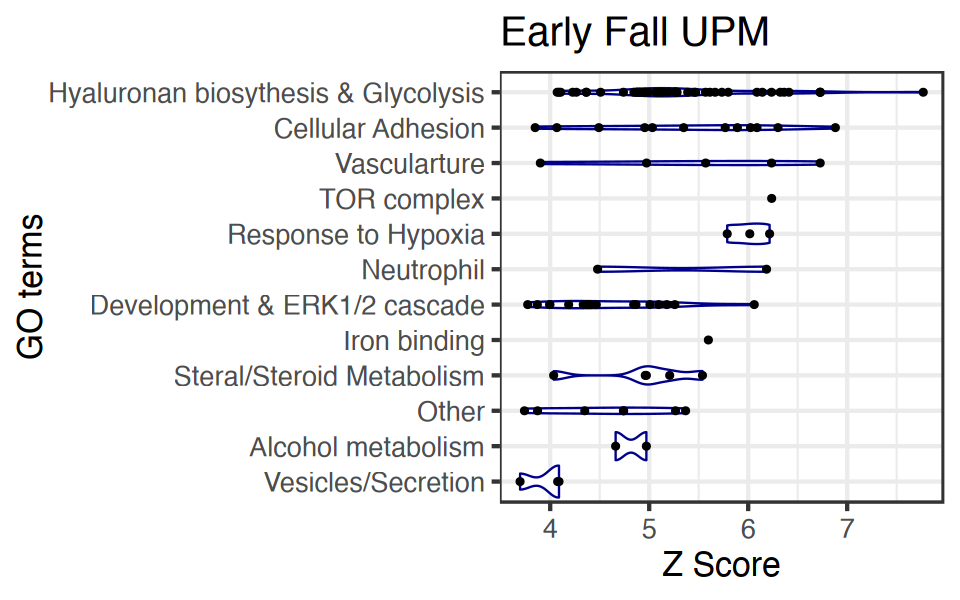

In [286]:
options(repr.plot.width=8)
#go_early_risep$Description
using = as.data.frame(go_early_fall)
length(unique(using$Description))
#using[1:2,]
using$Group <- "Other"
using[grepl("adhesion|fibronectin|integrin|cadherin|junction|semaphorin-plexin", using$Description),]$Group <- "Cellular Adhesion"
using[grepl("hyaluronan|ADP|ATP|organophosphate|hexose|pyridine|purine|ribonucleotide|carbohydrate|glucose|nucleoside|nucleotide|monosaccharide|glycoly|ribose phosphate|pyruvate|fructose|NAD", using$Description),]$Group <- "Hyaluronan biosythesis & Glycolysis"
using[grepl("alcohol", using$Description),]$Group <- "Alcohol metabolism"
using[grepl("hypoxia|oxygen", using$Description),]$Group <- "Response to Hypoxia"
using[grepl("Vascular Permeability|vascul|angiogenesis", using$Description),]$Group <- "Vascularture"
using[grepl("TOR", using$Description),]$Group <- "TOR complex"
using[grepl("ficolin-1-rich", using$Description),]$Group <- "Neutrophil"
using[grepl("vesicle|secretory", using$Description),]$Group <- "Vesicles/Secretion"
using[grepl("sterol|steroid", using$Description),]$Group <- "Steral/Steroid Metabolism"
using[grepl("iron ion", using$Description),]$Group <- "Iron binding"
using[grepl("development|reproducti|female pregnancy|multi-multicellular|heart morphogenesis|cell growth|growth|ERK|morphogenesis", using$Description),]$Group <- "Development & ERK1/2 cascade"

# using[grepl("SREBP|sterol", using$Description),]$Group <- "Sterol Depletion (SREBP)"
# using[grepl("autophagy", using$Description),]$Group <- "Autophagy"
testing = using[using$Group == "Other",]
testing[order(-testing$zScore),]
using$Max_call <- 0
for (group in unique(using$Group)) {
    filt = using[using$Group == group,]
    max_call = max(filt$zScore)
    using[using$Group == group,]$Max_call = max_call
    }
go_early_fall = using
pEF <- ggplot(go_early_fall, aes(x=zScore, y=reorder(Group, Max_call))) + geom_violin(color = "darkblue", drop=FALSE) + geom_point(color = "black") + theme_bw(base_size=20) + 
labs(y="GO terms", x="Z Score") + ggtitle("Early Fall UPM")
pEF

[1] 27

,ONTOLOGY,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count,Group,Max_call
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<chr>,<dbl>
GO:0015026,MF,GO:0015026,coreceptor activity,2/12,57/18522,0.035087719,54.15789,10.234112,0.0006020821,0.005848797,0.002987776,ROR1/LRP5,2,Other,10.23411
GO:0046982,MF,GO:0046982,protein heterodimerization activity,3/12,353/18522,0.008498584,13.11756,5.852707,0.0013288051,0.010039861,0.005128722,UGT1A5/UGT1A4/UGT1A3,3,Other,10.23411


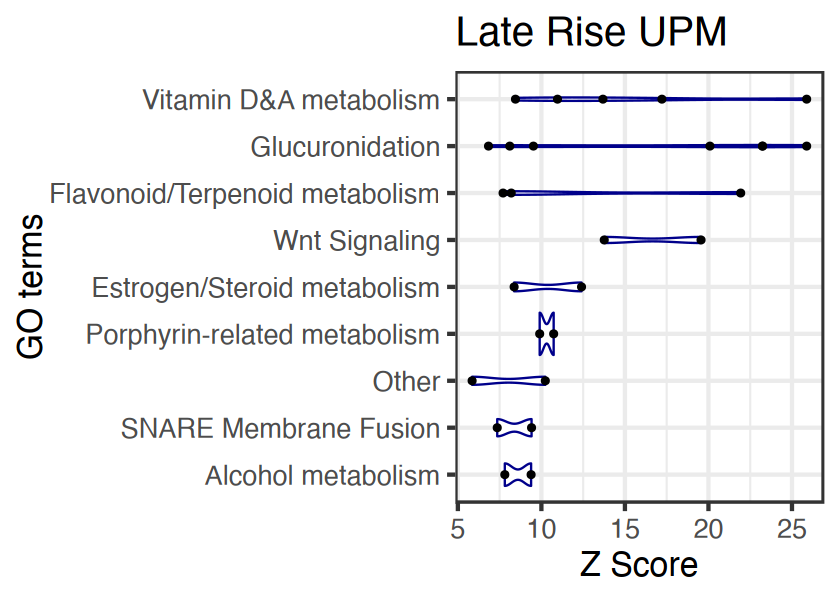

In [295]:
options(repr.plot.width=7)
#go_early_risep$Description
using = as.data.frame(go_late_up)
length(unique(using$Description))
#using[1:2,]
using$Group <- "Other"
using[grepl("vitamin|retinoi", using$Description),]$Group <- "Vitamin D&A metabolism"
using[grepl("flavonoid|terpenoid", using$Description),]$Group <- "Flavonoid/Terpenoid metabolism"
using[grepl("estrogen|steroid", using$Description),]$Group <- "Estrogen/Steroid metabolism"
using[grepl("porphyrin|tetrapyrrole", using$Description),]$Group <- "Porphyrin-related metabolism"
using[grepl("glycosyltransferase|hexosyltransferase|glucuronidation|glucuronosyl|uronic acid|glucuronate", using$Description),]$Group <- "Glucuronidation"
using[grepl("Wnt", using$Description),]$Group <- "Wnt Signaling"
using[grepl("alcohol", using$Description),]$Group <- "Alcohol metabolism"
using[grepl("syntaxin|SNARE", using$Description),]$Group <- "SNARE Membrane Fusion"

testing = using[using$Group == "Other",]
testing[order(-testing$zScore),]
using$Max_call <- 0
for (group in unique(using$Group)) {
    filt = using[using$Group == group,]
    max_call = max(filt$zScore)
    using[using$Group == group,]$Max_call = max_call
    }
go_late_up = using
pLU <- ggplot(go_late_up, aes(x=zScore, y=reorder(Group, Max_call))) + geom_violin(color = "darkblue", drop=FALSE) + geom_point(color = "black") + theme_bw(base_size=20) + 
labs(y="GO terms", x="Z Score") + ggtitle("Late Rise UPM")
pLU

[1] 19

ONTOLOGY,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count,Group
<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<chr>


Warning message:
“Cannot compute density for groups with fewer than two datapoints.”


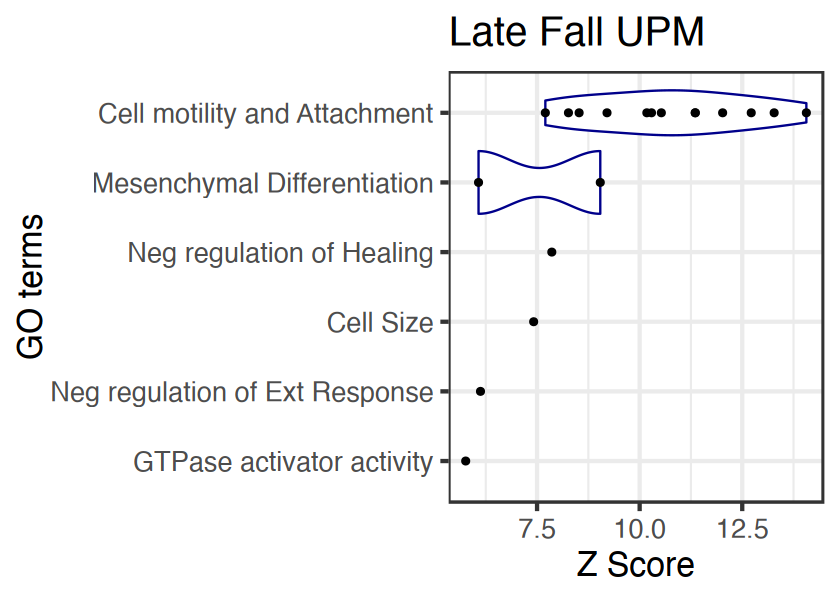

In [307]:
options(repr.plot.width=7)
#go_early_risep$Description
using = as.data.frame(go_late_down)
length(unique(using$Description))
#using[1:2,]
using$Group <- "Other"
using[grepl("axon|chemorepellent|neural crest|semaphorin|neuron projection|cell migration|chemotaxis", using$Description),]$Group <- "Cell motility and Attachment"
using[grepl("mesenchymal", using$Description),]$Group <- "Mesenchymal Differentiation"
using[grepl("GTPase", using$Description),]$Group <- "GTPase activator activity"
using[grepl("wound healing", using$Description),]$Group <- "Neg regulation of Healing"
using[grepl("external", using$Description),]$Group <- "Neg regulation of Ext Response"
using[grepl("cell size", using$Description),]$Group <- "Cell Size"


testing = using[using$Group == "Other",]
testing[order(-testing$zScore),]
using$Max_call <- 0
for (group in unique(using$Group)) {
    filt = using[using$Group == group,]
    max_call = max(filt$zScore)
    using[using$Group == group,]$Max_call = max_call
    }
go_late_down = using
pLF <- ggplot(go_late_down, aes(x=zScore, y=reorder(Group, Max_call))) + geom_violin(color = "darkblue", drop=FALSE) + geom_point(color = "black") + theme_bw(base_size=20) + 
labs(y="GO terms", x="Z Score") + ggtitle("Late Fall UPM")
pLF

[1] 17

ONTOLOGY,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count,Group
<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<chr>


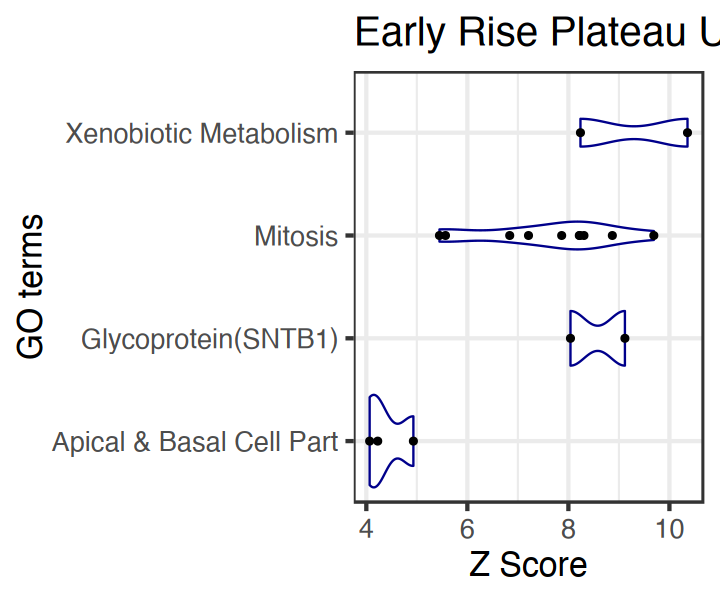

In [313]:
options(repr.plot.width=6)
#go_early_risep$Description
using = as.data.frame(go_early_plat_up)
length(unique(using$Description))
using$Group <- "Other"
using[grepl("xenobiotic", using$Description),]$Group <- "Xenobiotic Metabolism"
using[grepl("mitoti|spindle|cell cycle|centrio|tubul", using$Description),]$Group <- "Mitosis"
using[grepl("glycoprotein", using$Description),]$Group <- "Glycoprotein(SNTB1)"
using[grepl("apical|basal", using$Description),]$Group <- "Apical & Basal Cell Part"
# # using[grepl("autophagy", using$Description),]$Group <- "Autophagy"
testing = using[using$Group == "Other",]
testing[order(-testing$zScore),]
using$Max_call <- 0
for (group in unique(using$Group)) {
    filt = using[using$Group == group,]
    max_call = max(filt$zScore)
    using[using$Group == group,]$Max_call = max_call
    }
go_early_plat_up = using
pERP <- ggplot(go_early_plat_up, aes(x=zScore, y=reorder(Group, Max_call))) + geom_violin(color = "darkblue", drop=FALSE) + geom_point(color = "black") + theme_bw(base_size=20) + 
labs(y="GO terms", x="Z Score") + ggtitle("Early Rise Plateau UPM")
pERP

In [317]:
options(repr.plot.width=6)
#go_early_risep$Description
using = as.data.frame(go_early_plat_down)
length(unique(using$Description))
using$Group <- "Other"
unique(using$geneID)

testing = using[using$Group == "Other" & using$Count > 1,]
testing[order(-testing$zScore),]


[1] 87

[1] "GCLC/GSN"      "GCLC/ERRFI1"   "ERRFI1/TSPAN5" "GSN"          
[5] "GCLC"          "ERRFI1"        "GCLC/TSPAN5"   "TSPAN5"       
[9] "TRPC6"

,ONTOLOGY,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count,Group
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<chr>
GO:0009612,BP,GO:0009612,response to mechanical stimulus,2/5,216/18888,0.009259259,34.97778,8.172547,0.001272544,0.04175892,0.01421068,GCLC/GSN,2,Other
GO:0005996,BP,GO:0005996,monosaccharide metabolic process,2/5,252/18888,0.007936508,29.98095,7.536463,0.001726589,0.04175892,0.01421068,GCLC/ERRFI1,2,Other
GO:0032868,BP,GO:0032868,response to insulin,2/5,269/18888,0.007434944,28.08625,7.280778,0.001964330,0.04175892,0.01421068,GCLC/ERRFI1,2,Other
GO:0072659,BP,GO:0072659,protein localization to plasma membrane,2/5,293/18888,0.006825939,25.78567,6.957726,0.002325230,0.04175892,0.01421068,ERRFI1/TSPAN5,2,Other
GO:0045862,BP,GO:0045862,positive regulation of proteolysis,2/5,336/18888,0.005952381,22.48571,6.466288,0.003045127,0.04175892,0.01421068,GCLC/GSN,2,Other
GO:1990778,BP,GO:1990778,protein localization to cell periphery,2/5,356/18888,0.005617978,21.22247,6.268001,0.003411704,0.04175892,0.01421068,ERRFI1/TSPAN5,2,Other
GO:0042176,BP,GO:0042176,regulation of protein catabolic process,2/5,362/18888,0.005524862,20.87072,6.211665,0.003525577,0.04175892,0.01421068,GCLC/TSPAN5,2,Other
GO:0010639,BP,GO:0010639,negative regulation of organelle organization,2/5,365/18888,0.005479452,20.69918,6.184006,0.003583187,0.04175892,0.01421068,GCLC/GSN,2,Other
GO:0031400,BP,GO:0031400,negative regulation of protein modification process,2/5,426/18888,0.004694836,17.73521,5.684963,0.004851084,0.04175892,0.01421068,GCLC/ERRFI1,2,Other


Warning message:
“Cannot compute density for groups with fewer than two datapoints.”
Warning message:
“Cannot compute density for groups with fewer than two datapoints.”
Warning message:
“Cannot compute density for groups with fewer than two datapoints.”


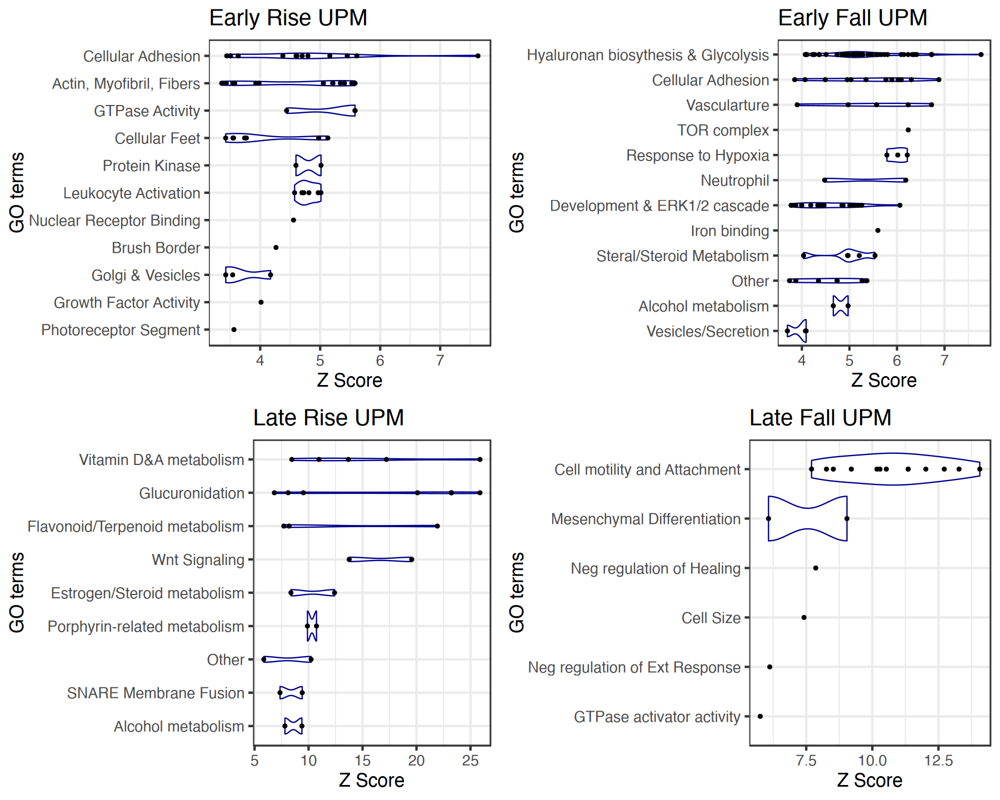

In [324]:
options(repr.plot.width=15, repr.plot.height=12)
plot_grid(pER, pEF, 
         pLU, pLF, nrow=2)

In [330]:
go_early_plat_down[1:2,]

,ONTOLOGY,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>
GO:0009612,BP,GO:0009612,response to mechanical stimulus,2/5,216/18888,0.009259259,34.97778,8.172547,0.001272544,0.04175892,0.01421068,GCLC/GSN,2
GO:0005996,BP,GO:0005996,monosaccharide metabolic process,2/5,252/18888,0.007936508,29.98095,7.536463,0.001726589,0.04175892,0.01421068,GCLC/ERRFI1,2


In [331]:
# Resave with the groups added
write.table(go_early_rise, paste0("../results/GO/p1e20_GO_EarlyRise", pert, "_DESeq2_GeneHK.txt"), 
           sep="\t", quote=FALSE)
write.table(go_early_fall, paste0("../results/GO/p1e20_GO_EarlyFall", pert, "_DESeq2_GeneHK.txt"),, 
           sep="\t", quote=FALSE)
write.table(go_late_up, paste0("../results/GO/p1e20_GO_LateRise", pert, "_DESeq2_GeneHK.txt"), 
           sep="\t", quote=FALSE)
write.table(go_late_down, paste0("../results/GO/p1e20_GO_LateFall", pert, "_DESeq2_GeneHK.txt"),, 
           sep="\t", quote=FALSE)
write.table(go_early_plat_up, paste0("../results/GO/p1e20_GO_EarlyRisePlat", pert, "_DESeq2_GeneHK.txt"), 
           sep="\t", quote=FALSE)
write.table(go_early_plat_down, paste0("../results/GO/p1e20_GO_EarlyFallPlat", pert, "_DESeq2_GeneHK.txt"), 
           sep="\t", quote=FALSE)
